# Author: Tanay Yadav
# Roll No: AI20BTECH11026
# Assignment 3

In [266]:
# importing the required packages

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
import pickle

## Some necessary functions

In [268]:
# flipping function from the previous assignment.

def flip_left_right(image):
    W, H, C = image.shape
    flipped_image = np.zeros((W, H, C))
    for i in range(H):
        flipped_image[:, H-i-1, :] = image[:, i, :]

    return flipped_image

def flip_up_down(image):
    W, H, C = image.shape
    flipped_image = np.zeros((W, H, C))
    for i in range(H):
        flipped_image[H-i-1, :, :] = image[i, :, :]

    return flipped_image

# defining the non-linearities
def sigmoid(X):
    return 1/(1 + np.exp(-X))

def tanh(X):
    return (np.exp(X) - np.exp(-X))/(np.exp(X) + np.exp(-X))

def ReLU(X):
    return (X + np.abs(X))/2

def PReLU(X):
    a = 0.2    # this is a hyperparameter, set as 0.2 for this homework
    m, n = X.shape
    for i in range(m):
        for j in range(n):
            if X[i, j] < 0:
                X[i, j] *= a
    return X

# Q1

In [309]:
'''
Takes in an image with dimensions W x H x C and convolves it with an input kernel K x K x C, gives J = I*h

# Inputs:
img: A numpy array of size W x H x C
ker: A numpy array of size K x K x C
stride: int (default = 1)
padding: bool (default = True)
non_lin: string (default = 'sigmoid'; available choices: ['sigmoid', 'tanh', 'ReLU', 'PReLU'])

# Outputs:
kernel and the activation map after convolution

# Returns:
Output activation map 
'''


def convolve_2D (img, ker, stride=1, padding=True, non_lin='sigmoid'):
    
    n_lins = ['sigmoid', 'tanh', 'ReLU', 'PReLU']
    if non_lin not in n_lins:
        raise ValueError("Available non-linearities are:", n_lins)
        
    stri = stride-1
    W, H, C = img.shape
    K, K, C = ker.shape

    # displaying the kernel
    # flipping the kernel for convolution
    ker = flip_up_down(flip_left_right(ker))
    
    # setting the dimensions for the padded and non-padded outputs
    W_out_pad = int((W + 2*(K-1) - K)/stride + 1)
    H_out_pad = int((H + 2*(K-1) - K)/stride + 1)
    W_out = int((W-K)/stride + 1)
    H_out = int((H-K)/stride + 1)
    
    
    if padding:
        convolvedImage = np.zeros((W_out_pad, H_out_pad))
    else:
        convolvedImage = np.zeros((W_out, H_out))

    if padding:
        paddedImage = np.zeros((W + 2*(K-1), H + 2*(K-1), C))
        for i in range(W):
            for j in range(H):
                paddedImage[(K-1)+i, (K-1)+j] = img[i, j]
    
        temp_ud = flip_up_down(img)
        for i in range(0, K-1):
            for j in range(K-1, H+K-1): 
                paddedImage[K-2-i, j] = temp_ud[W-i-1, j-(K-1)]         # top
                paddedImage[W+K-1+i, j] = temp_ud[(K-1)-i, j-(K-1)]     # bottom

        temp_lr = flip_left_right(img)
        for i in range(K-1, W+K-1):
            for j in range(0, K-1):
                paddedImage[i, K-2-j] = temp_lr[i-(K-1), H-j-1]         #left
                paddedImage[i, H+K-1+j] = temp_lr[i-(K-1), j]           #right
    

        # corners
        # numbering the corners 1, 2, 3, 4 in the clockwise manner starting from the top-left corner and picking up image parts for each corner
        corner1 = np.zeros((K-1, K-1, C))
        corner2 = np.zeros((K-1, K-1, C))
        corner3 = np.zeros((K-1, K-1, C))
        corner4 = np.zeros((K-1, K-1, C))
    
        # getting the corners from the image
        for i in range(0, K-1):
            for j in range(0, K-1):
                corner1[i, j] = img[i, j]
                corner2[i, j] = img[i, (H-(K-1))+j]
                corner3[i, j] = img[(W-(K-1))+i, (H-(K-1))+j]
                corner4[i, j] = img[(W-(K-1))+i, j]
    
        # mirroring the corners
        for i in range(C):
            corner2[:, :, i] = corner2[:, :, i].T
            corner3[:, :, i] = corner3[:, :, i].T

        J = np.zeros((K-1, K-1), dtype=int)
        for i in range(K-1):
            for j in range(K-1):
                if i + j + 1 == (K-1):
                    J[i, j] = 1
        for i in range(C):
            corner1[:, :, i] = ((corner1[:, :, i]@J).T)@J
            corner4[:, :, i] = ((corner4[:, :, i]@J).T)@J

        # replacing the mirrored matrices in the corners
        for i in range(0, K-1):
            for j in range(0, K-1):
                paddedImage[i, j] = corner1[i, j]
                paddedImage[i, H+K-1+j] = corner2[i, j]
                paddedImage[W+K-1+i, H+K-1+j] = corner3[i, j]
                paddedImage[W+K-1+i, j] = corner4[i, j]
        
        
    # applying convolution
        for i in range(W_out_pad):
            for j in range(H_out_pad):
                temp_img = paddedImage[i+(stri*i):(i+(stri*i)+K), j+(stri*j):(j+(stri*j)+K), :]
                for k in range(C):
                    convolvedImage[i, j] += int(np.sum(ker[:, :, k]*temp_img[:, :, k]))
                

    
    else:
        paddedImage = img
        for i in range(W_out):
            for j in range(H_out):
                temp_img = paddedImage[i+(stri*i):(i+(stri*i)+K), j+(stri*j):(j+(stri*j)+K), :]
                for k in range(C):
                    convolvedImage[i, j] += int(np.sum(ker[:, :, k]*temp_img[:, :, k]))
            
    # extracting the same dimensional image from the convolved image
    if padding and stride==1:
        final_image = convolvedImage[int((K-1)/2):(W + int((K-1)/2)), int((K-1)/2):(H + int((K-1)/2))]
    else:
        final_image = convolvedImage
    
    # normalising 
    final_image = final_image/np.max(final_image)
    
    # applying the non-linearity to the convolution performed
    if non_lin == 'sigmoid':
        final_image = sigmoid(final_image)

    if non_lin == 'tanh':
        final_image = tanh(final_image)
    
    if non_lin == 'ReLU':
        final_image = ReLU(final_image)
    
    if non_lin == 'PReLU':
        final_image = PReLU(final_image)
    
    # displaying the output activation map
    plt.title('Final image with the dimensions: %d'%final_image.shape[0] + ' x %d' %final_image.shape[1])
    plt.imshow(final_image)
    plt.colorbar()
    plt.show()

    return final_image

# Q2

In [270]:
'''
Takes an input activation map with dimensions W x H and returns pooled output specific to the stride set as input

# inputs:
img: Numpy array of size W x H
stride: integer (default=1)
filt_size: filter size, integer (default=2)
pool_func: Function used in pooling (default='max'; available:['max', 'min', 'avg', 'norm']

# outputs:
input activation map,
activation map after pooling

# returns:
activation map after pooling

'''

def pooling(img, stride=1, filt_size=2, pool_func='max'):
    
    # printing the size and stride
    print('Size of filter:', filt_size,'x', filt_size)
    print('Stride:', stride)
    
    # checking if pooling function is valid
    pool_funcs = ['max', 'min', 'avg', 'norm']
    if pool_func not in pool_funcs:
        raise ValueError('Input pool_func not valid. Valid choices are:', pool_funcs)
    
    # normalising the input activation map
    img = img/np.max(img)
    
    # displaying the input activation map
    plt.title('Received activation map: %d' %img.shape[0] + ' x %d' %img.shape[1])
    plt.imshow(img, vmin=0, vmax=1)
    plt.colorbar()
    plt.show()

    # setting stri as stride-1 for computational ease
    stri = stride-1
    
    # setting dimensions for the pooled output
    W, H = img.shape
    W_out = int((W - filt_size + 1)/stride)
    H_out = int((H - filt_size + 1)/stride)

    pooled_out = np.zeros((W_out, H_out))

    if pool_func=='max':
        for i in range(W_out):
            for j in range(H_out):
                pooled_out[i, j] = np.max(img[i+(stri*i):i+(stri*i)+filt_size, j+(stri*j):j+(stri*j)+filt_size])
    
    if pool_func=='min':
        for i in range(W_out):
            for j in range(H_out):
                pooled_out[i, j] = np.min(img[i+(stri*i):i+(stri*i)+filt_size, j+(stri*j):j+(stri*j)+filt_size])
    
    if pool_func=='avg':
        for i in range(W_out):
            for j in range(H_out):
                pooled_out[i, j] = np.average(img[i+(stri*i):i+(stri*i)+filt_size, j+(stri*j):j+(stri*j)+filt_size])
    
    if pool_func=='norm':
        for i in range(W_out):
            for j in range(H_out):
                pooled_out[i, j] = np.linalg.norm(img[i+(stri*i):i+(stri*i)+filt_size, j+(stri*j):j+(stri*j)+filt_size])
    
    # displaying the pooled output
    plt.title('Pooled output: %d' %pooled_out.shape[0] + ' x %d' %pooled_out.shape[1])
    plt.imshow(pooled_out, vmin=0, vmax=1)
    plt.colorbar()
    plt.show()
    
    return pooled_out

# Q3

In [271]:
# uses the convolve_2D function to perform convolution on an image with 'm' kernels
# returns an activation volume

def convolution_layer(input, kernels, stride=1, padding=True, non_lin='sigmoid'):
    
    # getting the number of kernels
    num_ker = kernels.shape[3]
    
    # checking if the number of channels in the input are same as the channels in the kernels
    if input.shape[2] != kernels.shape[2]:
        raise ValueError('Channels of input and kernels do not match.')


    fin_out = []
    for k in range(num_ker):
        print('Applying filter kernel', k+1)
        fin_out.append(convolve_2D(input, kernels[:, :, :, k], stride, padding, non_lin))

    # creating the output volume
    w_out, h_out = fin_out[0].shape
    img_out = np.zeros((w_out, h_out, num_ker))
    for k in range(num_ker):
        img_out[:, :, k] = fin_out[k]

    print('Confirming the dimensions of the output of this function:', img_out.shape)
    return img_out

In [272]:
# generating random kernels for testing
kernels_test = np.zeros((3,3,3,3))
for i in range(3):
    kernels_test[:, :, :, i] = np.random.uniform(-1, 1, size=(3,3,3))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Applying filter kernel 1


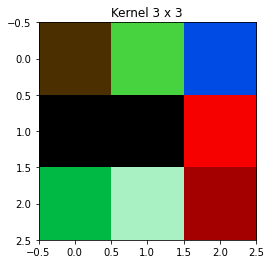

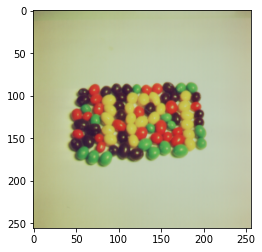

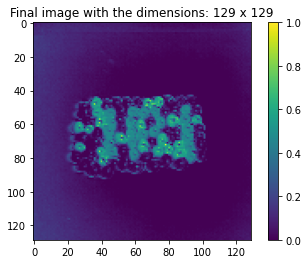

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Applying filter kernel 2


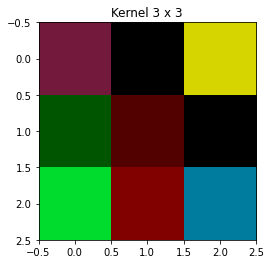

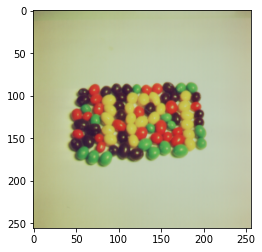

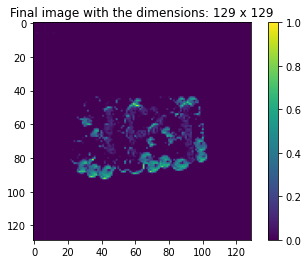

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Applying filter kernel 3


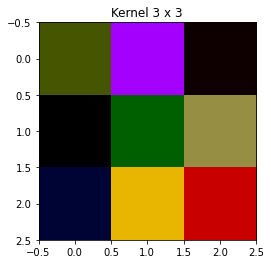

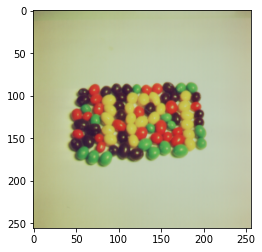

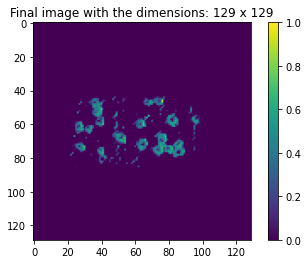

Confirming the dimensions of the output of this function: (129, 129, 3)


In [273]:
# testing the function
convolved = convolution_layer(image, kernels_test, stride=2, non_lin='ReLU')

# Q4

In [274]:
# uses the pooling function to pool an input activation volume to the specified filter size, stride and pooling function
# returns the pooled volume of the input activation

def pooling_layer(input, filt_size=2, stride=1, pool_func='max'):
    
    out = []
    m = input.shape[2]
    for k in range(m):
        print('Pooling layer %d of input activation map' %(k+1))
        out.append(pooling(input[:, :, k], stride, filt_size, pool_func))

    w_out, h_out = out[0].shape
    img_out = np.zeros((w_out, h_out, m))
    for k in range(m):
        img_out[:, :, k] = out[k]

    return img_out

Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


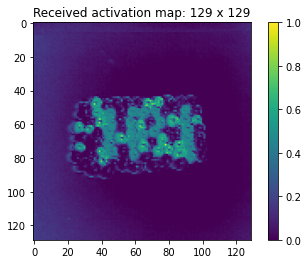

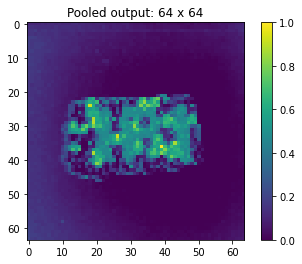

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


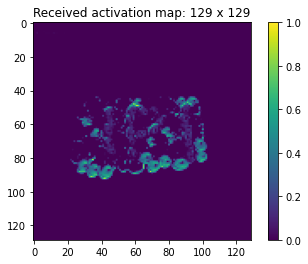

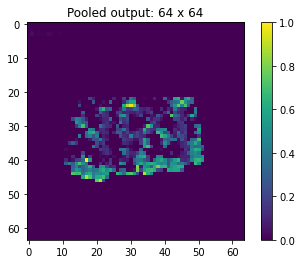

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


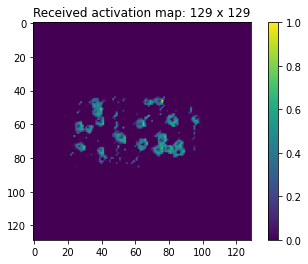

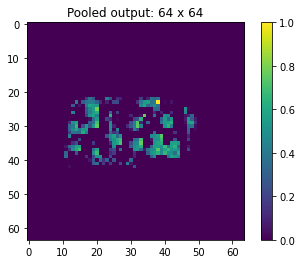

In [275]:
# testing the function
pooled = pooling_layer(convolved, stride=2)

# Q5

In [276]:
# function for flattening (unravelling) the input volume 
# returns a flattened output of size 'out_size' for the given 'input' 

def flatten(input, out_size):
    w, h, m = input.shape
    out = np.zeros((m, w*h))
    for i in range(m):
        out[i] = input[:, :, i].reshape(w*h)
    out = out.reshape(w*h*m)
    
    weights = np.random.rand(out_size, out.shape[0])        # random weights
    return weights@out

In [283]:
# testing the function
flattened = flatten(pooled, 10)
print(flattened.shape, '\n', flattened)

(10,) 
 [366.56618539 363.49657199 364.91062185 364.4308419  372.21544635
 360.59764232 371.14961869 375.7479777  360.05049348 370.23815293]


# Q6

In [294]:
'''
Takes an input vector and gives an output vector for specified number of nodes. 

# Inputs:
input: 1D numpy array,
n_hidlayers: number of hidden layers, integer
n_hidlayernode: number of nodes in 1 hidden layer, integer
out_size: size of the output vector, integer
non_lin: non-linearity to be applied, str=['sigmoid', 'tanh', 'ReLU', 'PReLU'], default='sigmoid'
softmax: to apply softmax or not, boolean, default: True

# returns
output vector with the specified size.
'''

def mlp(input, n_hidlayers, n_hidlayernode, out_size, non_lin='sigmoid', softmax=True):
    
    # reshaping the array
    input = input.reshape((1, input.shape[0]))
    
    # iterating over the layers to multiply with the weights and apply non-linearities
    for i in range (n_hidlayers):
        weight_hid = np.random.rand(input.shape[1], n_hidlayernode)
        bias = np.random.rand(1, n_hidlayernode)
        out = input@weight_hid + bias
        
        if non_lin == 'sigmoid':
            out = sigmoid(out)
        if non_lin == 'tanh':
            out = tanh(out)
        if non_lin == 'ReLU':
            out = ReLU(out)
        if non_lin == 'PReLU':
            out = PReLU(out)
        
        input = out.reshape((1, out.shape[1]))

    # weights associated to the output layer
    weight_out = np.random.rand(input.shape[1], out_size)
    bias = np.random.rand(1, out_size) 
    fin_out = input@weight_out + bias 

    # to apply softmax or no
    if (softmax == True):
        e_x = np.exp(fin_out)
        return e_x/e_x.sum(axis = 1)
    else:
        return fin_out

In [295]:
# testing the function

output = mlp(flattened, 1, 11, 10)
print(output, output.shape)

[[0.03133134 0.14551523 0.14481883 0.04705626 0.06835865 0.02294164
  0.01255222 0.35990416 0.06295399 0.10456769]] (1, 10)


# Getting 1 test image for Q7 

In [296]:
def unpickle(file):
    
    with open(file, 'rb') as fo:
        dict = pickle.load(fo, encoding='bytes')
    return dict

In [297]:
# unpickling the entire data batch 1
img_dict = unpickle('cifar-10-batches-py\\data_batch_1')
all_img_data = img_dict[b'data']
all_img_name = img_dict[b'filenames']

In [298]:
# randomly choosing an image from the unpickled data
img_data = all_img_data[100]
img_name = all_img_name[100]

# since each image is 32 x 32 x 3
img_data = img_data.reshape((3, 1024))

In [299]:
# transforming the given format of image data into a tensor which we can actually use
image = np.zeros((32, 32, 3), dtype=int)
for i in range(3):
    image[:, :, i] = img_data[i].reshape((32, 32))

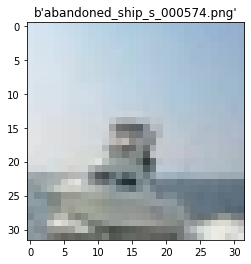

In [300]:
# displaying the image that we have chosen
plt.title(img_name)
plt.imshow(image)
plt.show()

# Q8

In [325]:
# function to create random kernels using np.random.uniform

def kernel_create(ker_size, n_kernels, n_channels):
    kernels = np.zeros((ker_size, ker_size, n_channels, n_kernels))
    for i in range(n_kernels):
        kernels[:, :, :, i] = np.random.uniform(0, 1, size=(ker_size, ker_size, n_channels))

    return kernels

In [301]:
# function to create the CNN

def feed_forward(img):
    out = convolution_layer(img, kernel_create(3, 16, 3), non_lin='sigmoid')
    out = pooling_layer(out, 2, 2, 'max')
    out = convolution_layer(out, kernel_create(3, 8, 16), non_lin='sigmoid')
    out = pooling_layer(out, 2, 2, 'max')
    out = flatten(out, 10)
    out = mlp(out, 1, 11, 10, 'sigmoid')

    return out

Applying filter kernel 1


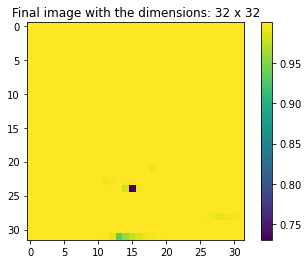

Applying filter kernel 2


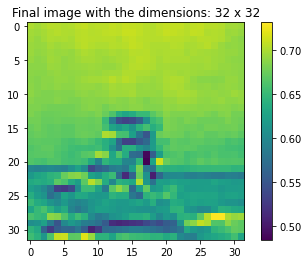

Applying filter kernel 3


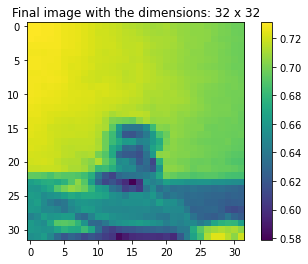

Applying filter kernel 4


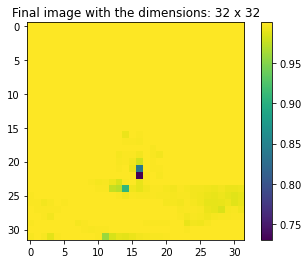

Applying filter kernel 5


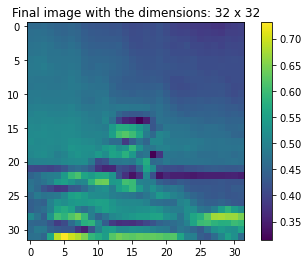

Applying filter kernel 6


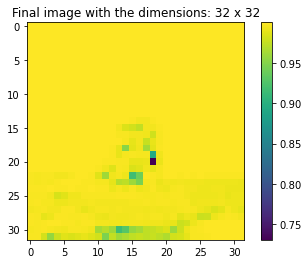

Applying filter kernel 7


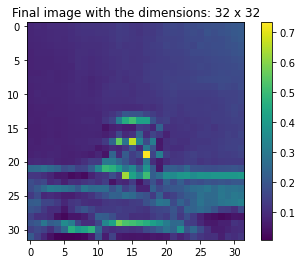

Applying filter kernel 8


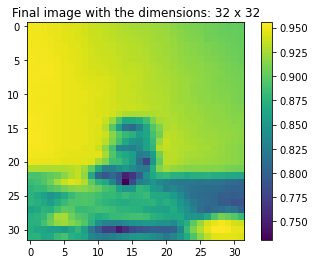

Applying filter kernel 9


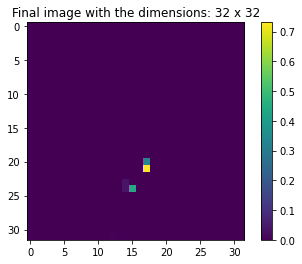

Applying filter kernel 10


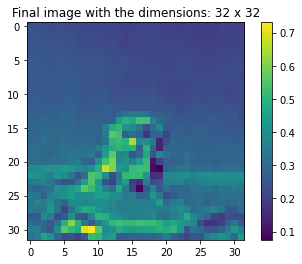

Applying filter kernel 11


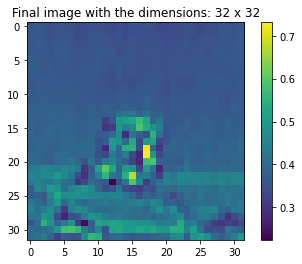

Applying filter kernel 12


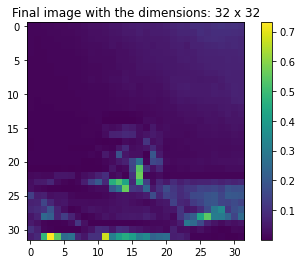

Applying filter kernel 13


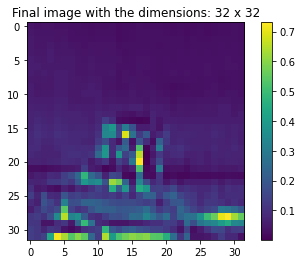

Applying filter kernel 14


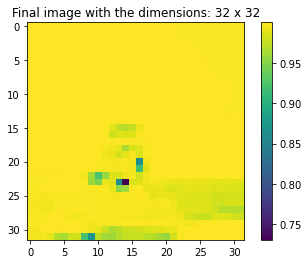

Applying filter kernel 15


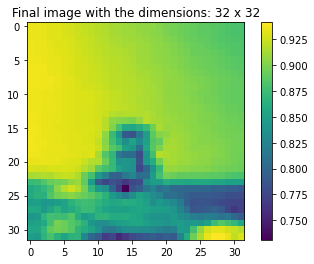

Applying filter kernel 16


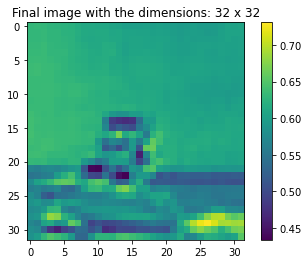

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


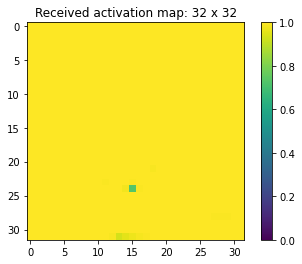

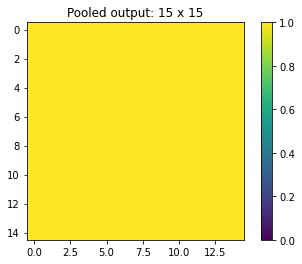

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


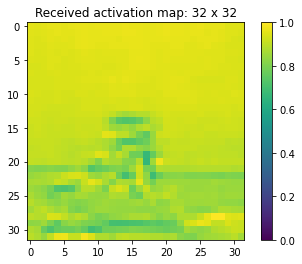

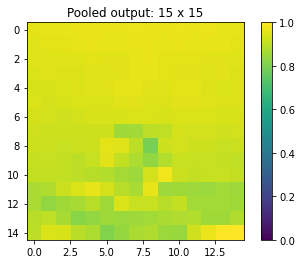

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


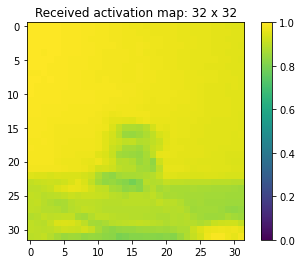

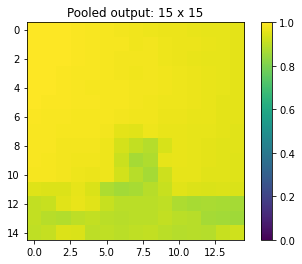

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


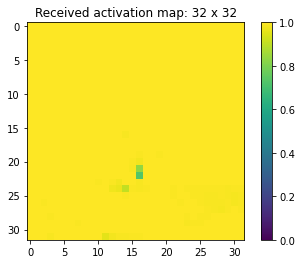

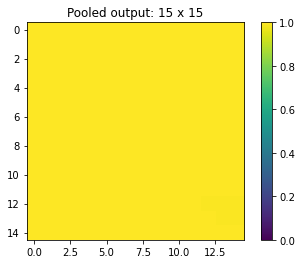

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


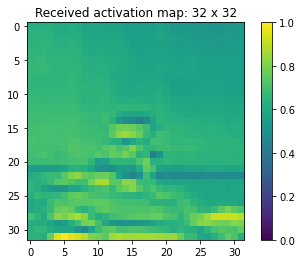

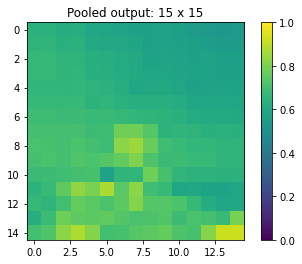

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


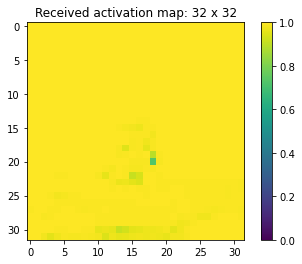

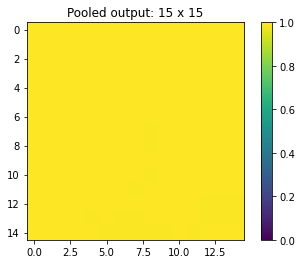

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


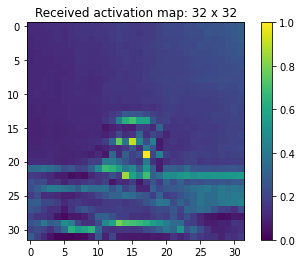

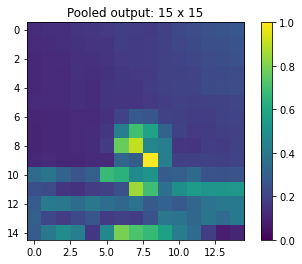

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


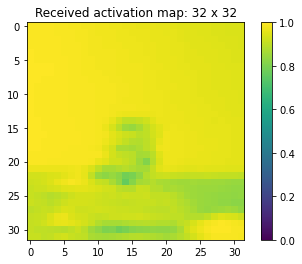

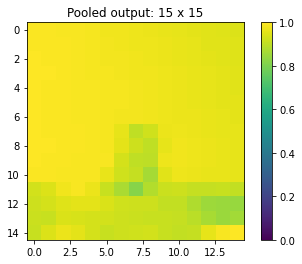

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


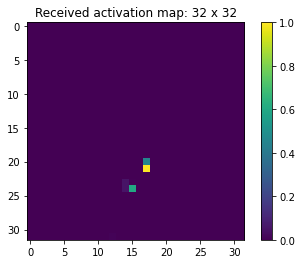

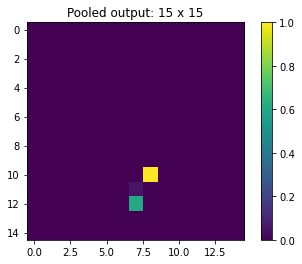

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


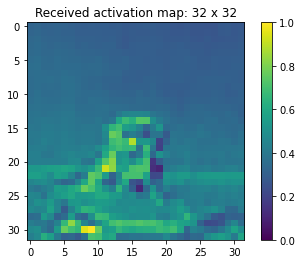

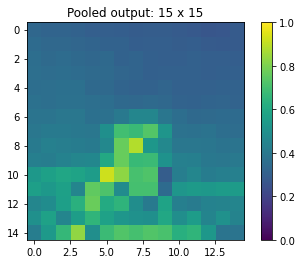

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


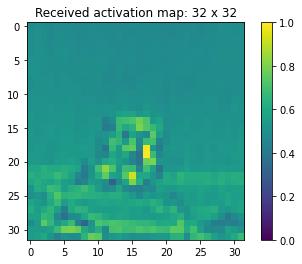

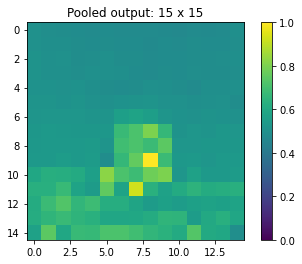

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


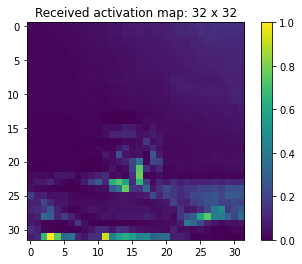

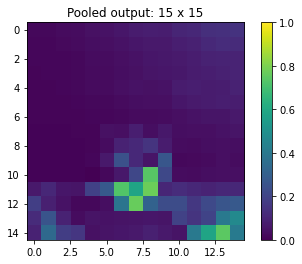

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


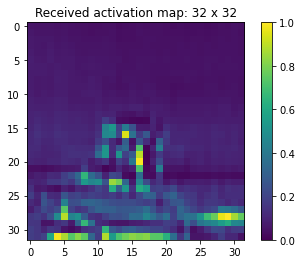

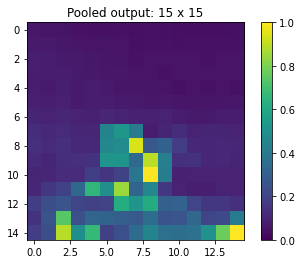

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


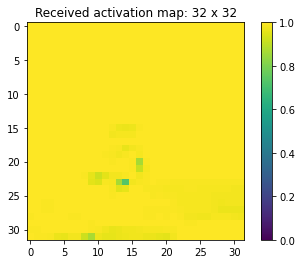

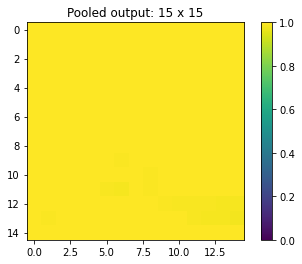

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


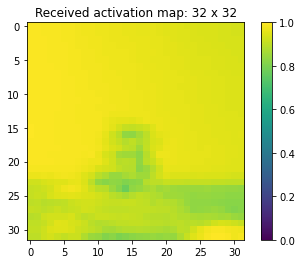

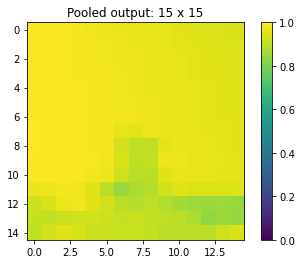

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


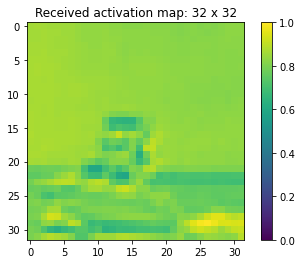

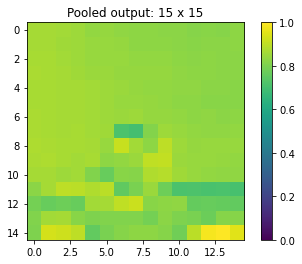

Applying filter kernel 1


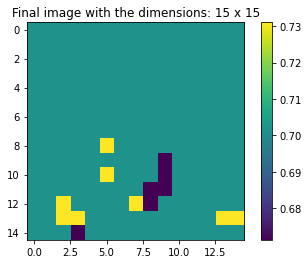

Applying filter kernel 2


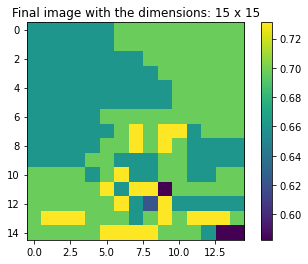

Applying filter kernel 3


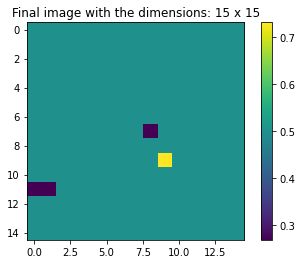

Applying filter kernel 4


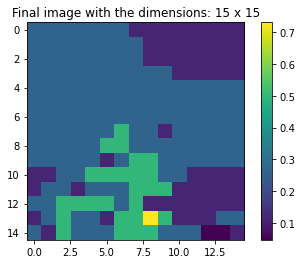

Applying filter kernel 5


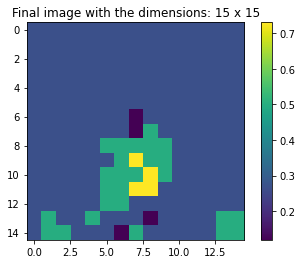

Applying filter kernel 6


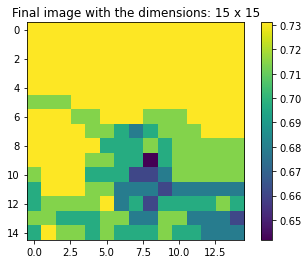

Applying filter kernel 7


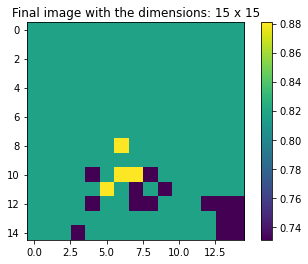

Applying filter kernel 8


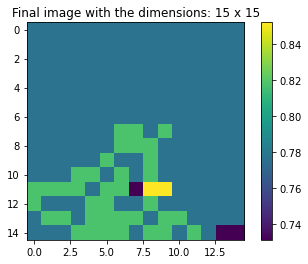

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


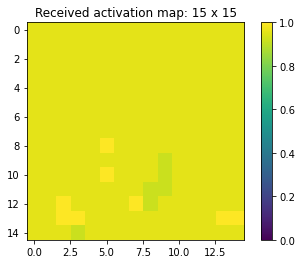

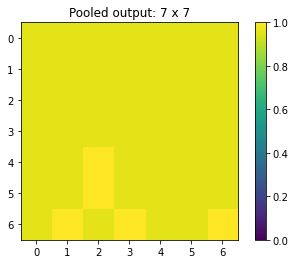

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


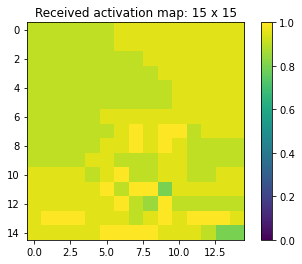

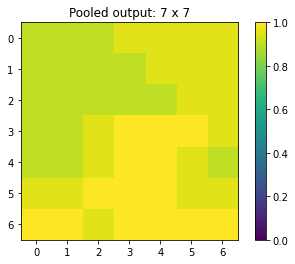

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


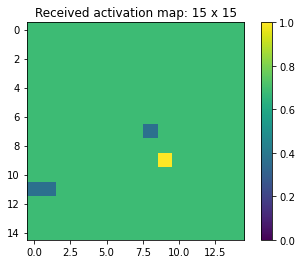

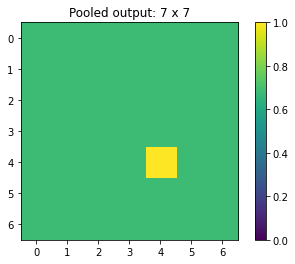

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


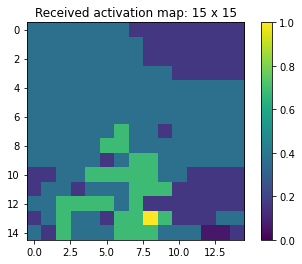

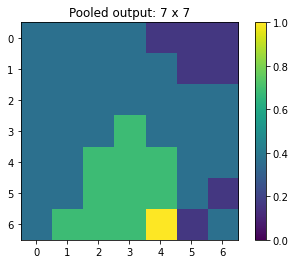

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


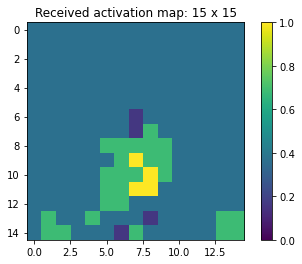

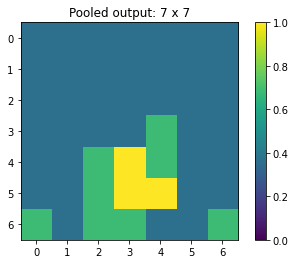

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


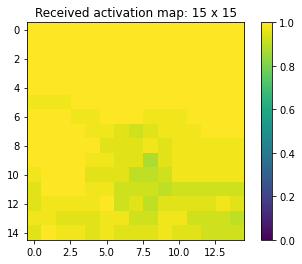

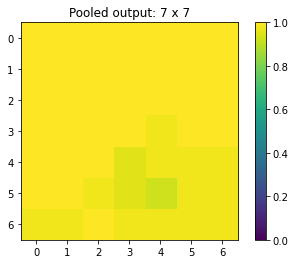

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


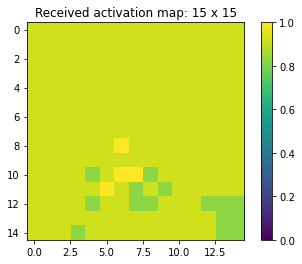

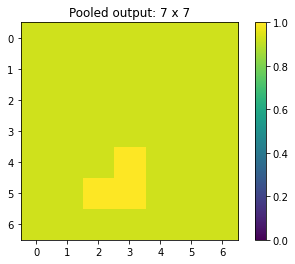

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


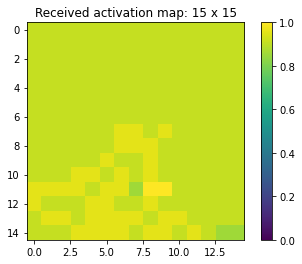

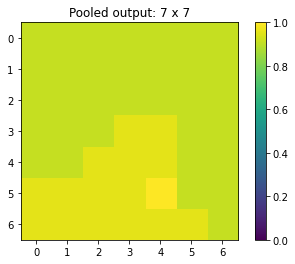

array([[0.12897349, 0.05422833, 0.16993731, 0.02583188, 0.12175388,
        0.1517648 , 0.10144856, 0.04924919, 0.01503125, 0.18178132]])

In [314]:
# testing the function 
feed_forward(image)

Since the kernel size varies greatly and also image size during convolution, we cannot display all the images and kernels.

# Getting an image from each class

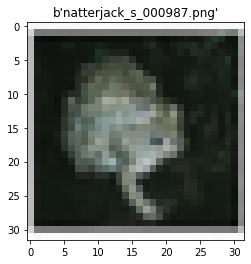

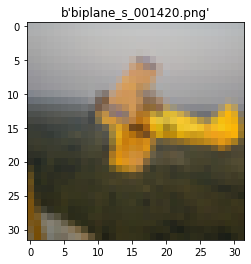

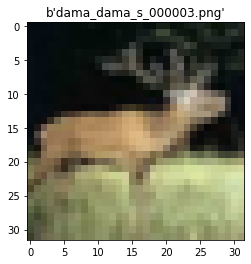

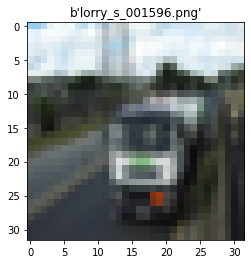

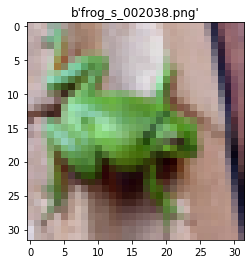

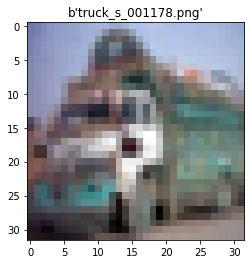

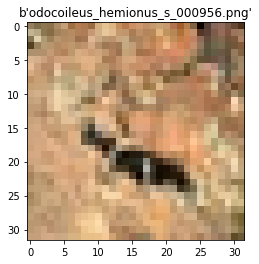

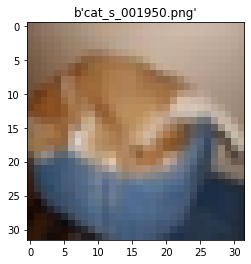

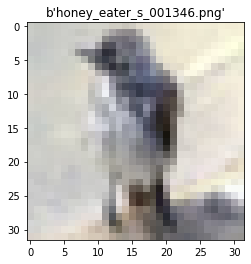

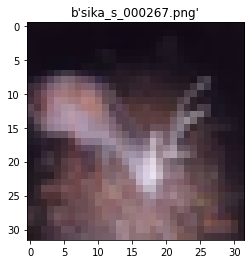

In [321]:
# getting the 235th image from all the classes
im_no = 234
trial_images = []
for i in range(10):
    img_data = all_img_data[1000*i + im_no]
    img_name = all_img_name[1000*i + im_no]

    # since each image is 32 x 32 x 3
    img_data = img_data.reshape((3, 1024))
    image = np.zeros((32, 32, 3), dtype=int)
    for i in range(3):
        image[:, :, i] = img_data[i].reshape((32, 32))

    # displaying the image that we have chosen
    plt.title(img_name)
    plt.imshow(image)
    plt.show()
    trial_images.append(image)

Applying filter kernel 1


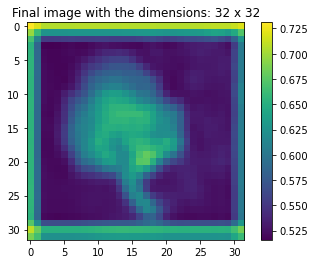

Applying filter kernel 2


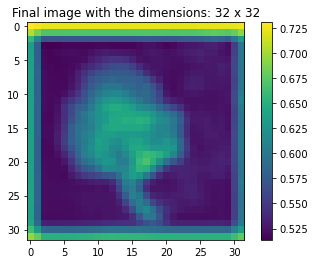

Applying filter kernel 3


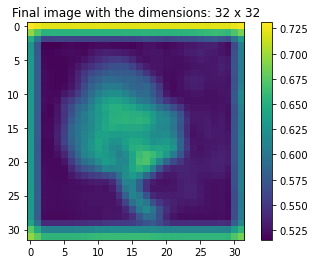

Applying filter kernel 4


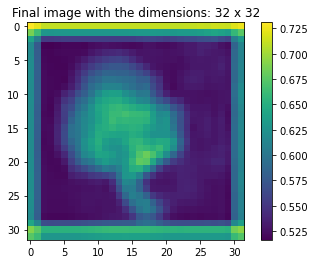

Applying filter kernel 5


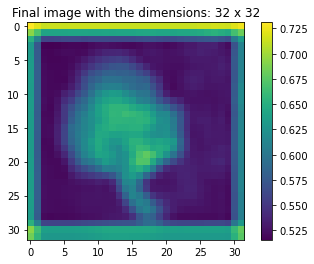

Applying filter kernel 6


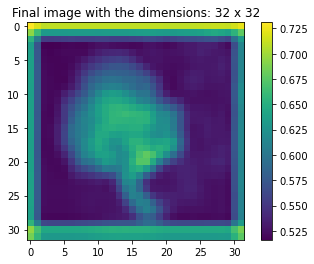

Applying filter kernel 7


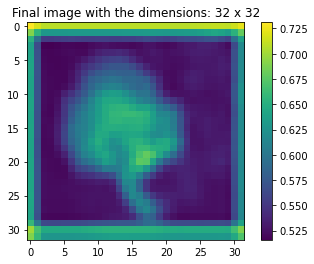

Applying filter kernel 8


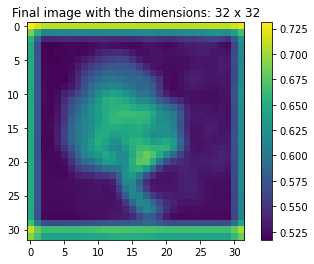

Applying filter kernel 9


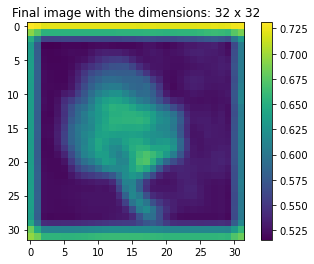

Applying filter kernel 10


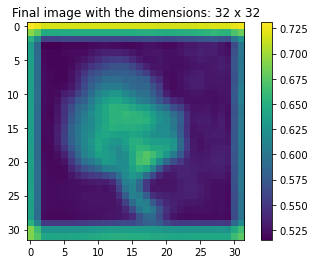

Applying filter kernel 11


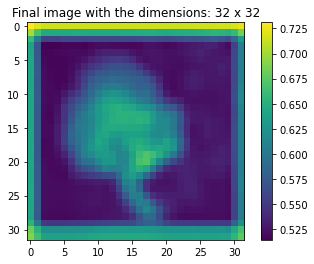

Applying filter kernel 12


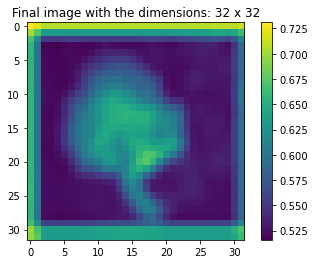

Applying filter kernel 13


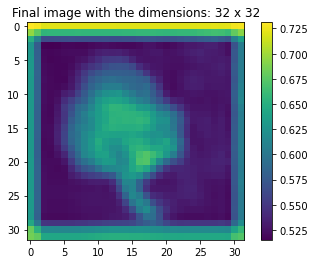

Applying filter kernel 14


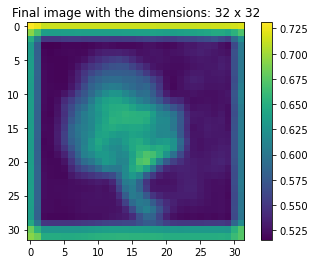

Applying filter kernel 15


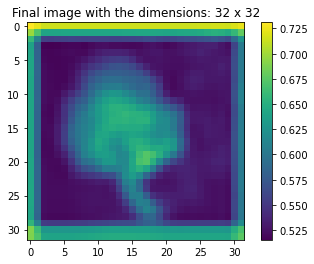

Applying filter kernel 16


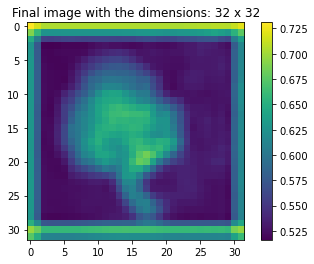

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


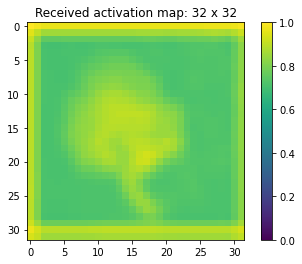

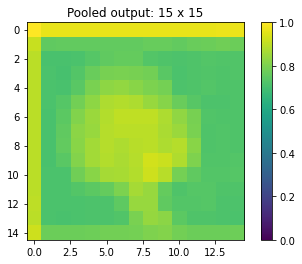

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


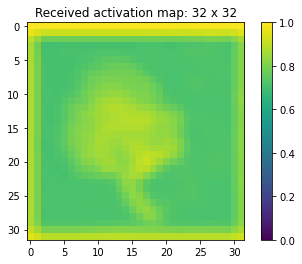

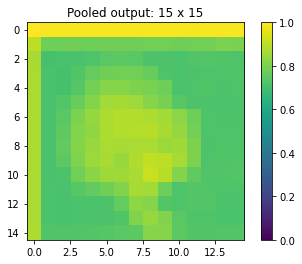

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


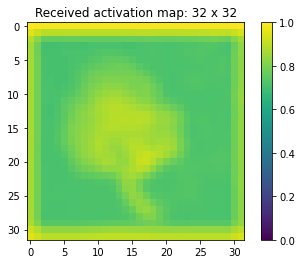

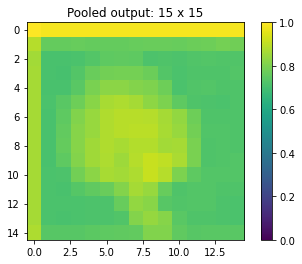

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


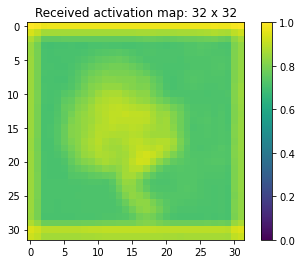

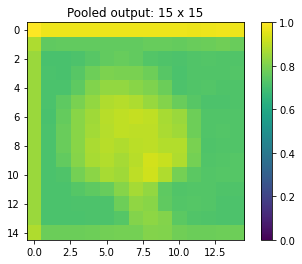

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


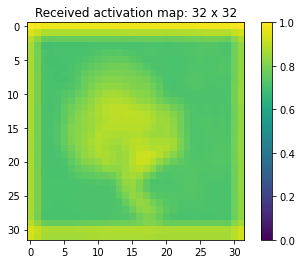

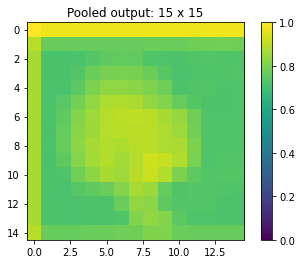

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


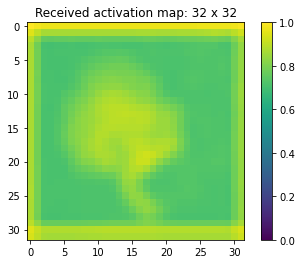

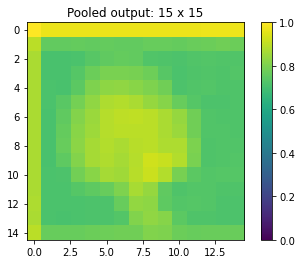

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


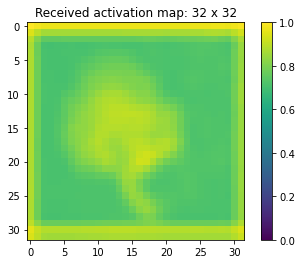

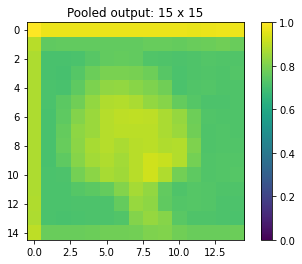

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


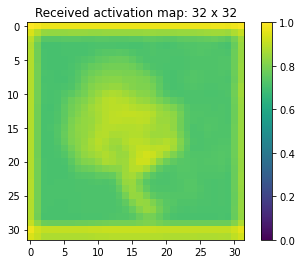

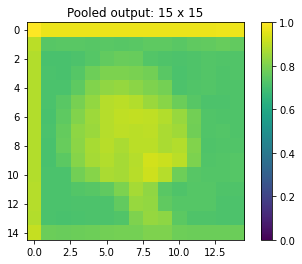

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


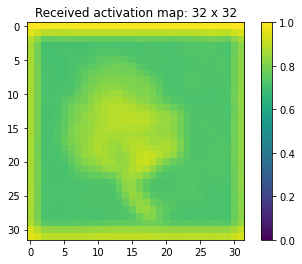

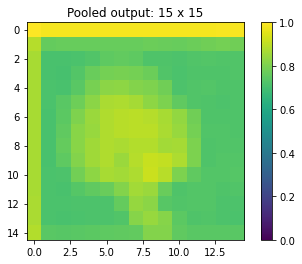

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


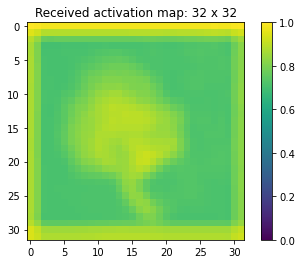

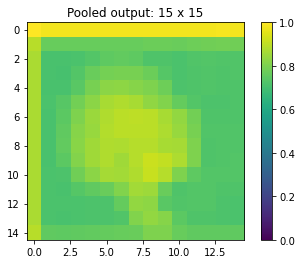

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


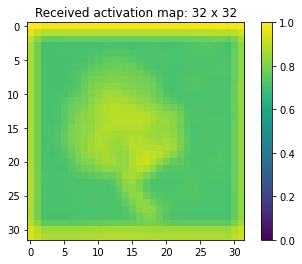

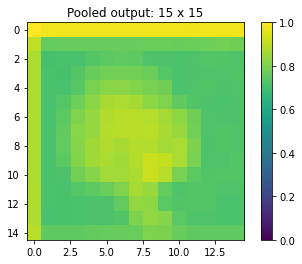

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


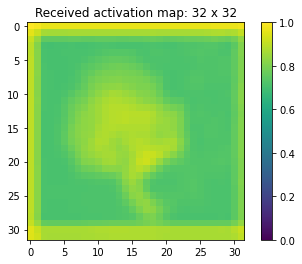

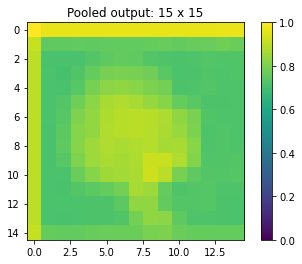

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


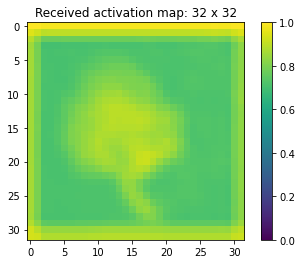

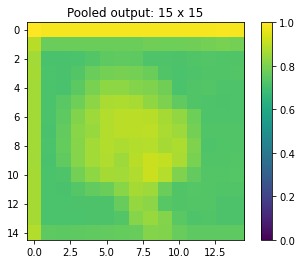

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


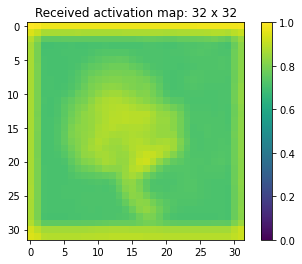

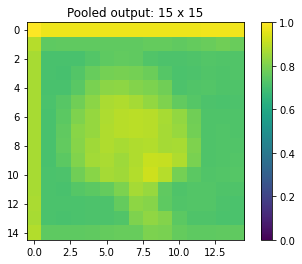

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


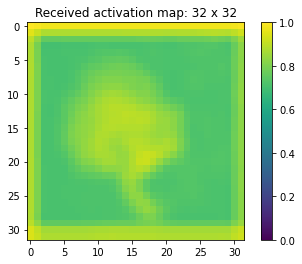

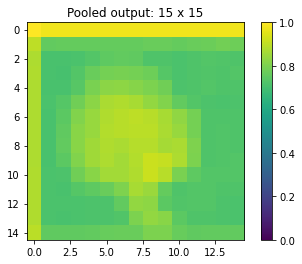

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


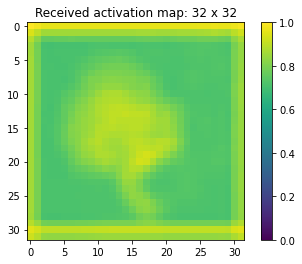

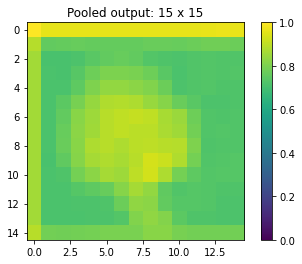

Applying filter kernel 1


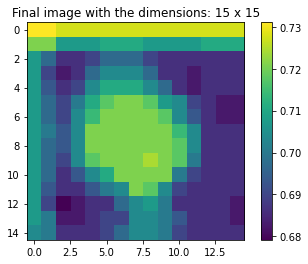

Applying filter kernel 2


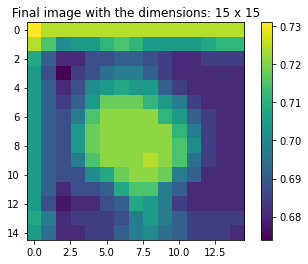

Applying filter kernel 3


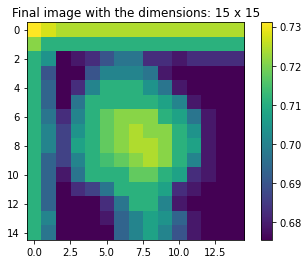

Applying filter kernel 4


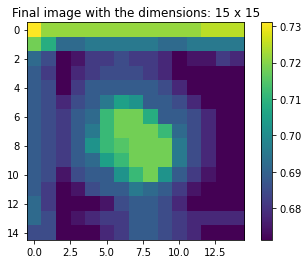

Applying filter kernel 5


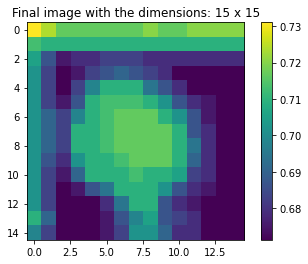

Applying filter kernel 6


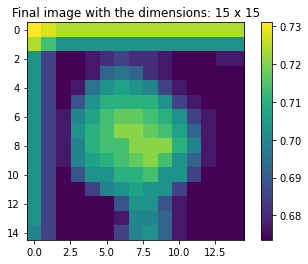

Applying filter kernel 7


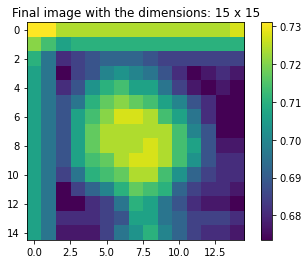

Applying filter kernel 8


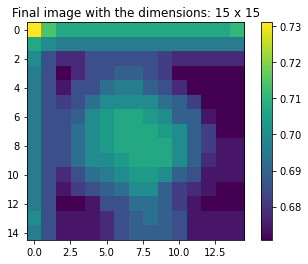

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


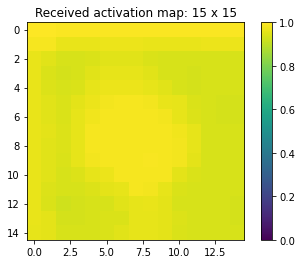

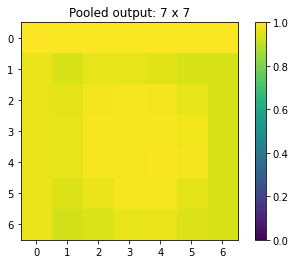

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


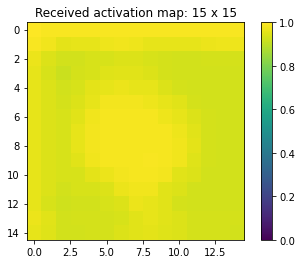

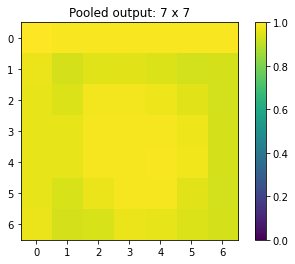

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


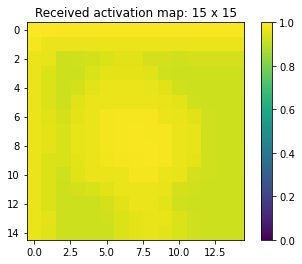

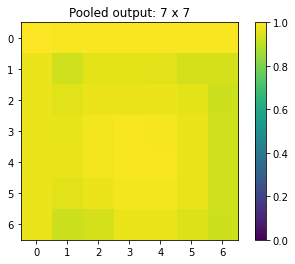

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


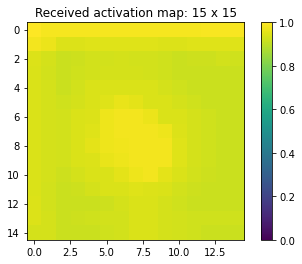

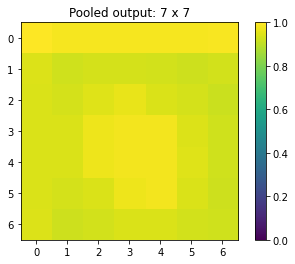

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


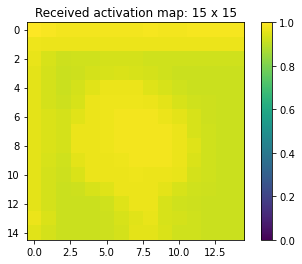

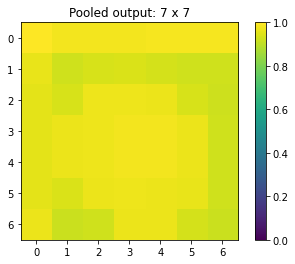

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


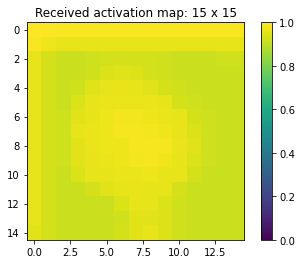

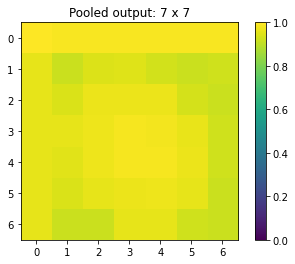

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


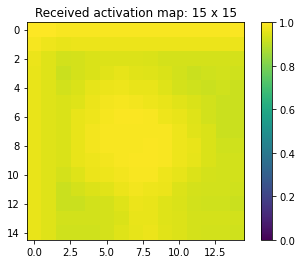

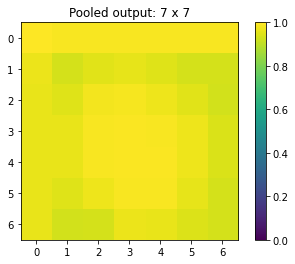

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


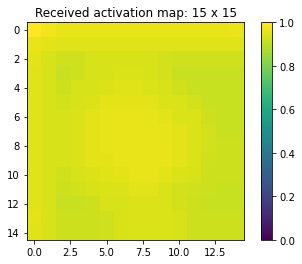

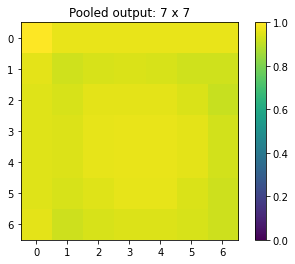

Applying filter kernel 1


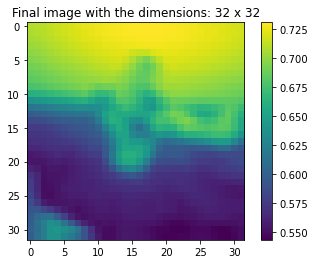

Applying filter kernel 2


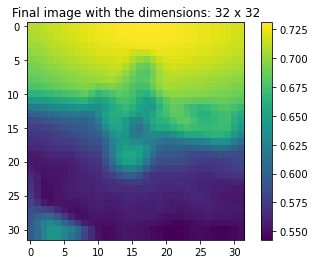

Applying filter kernel 3


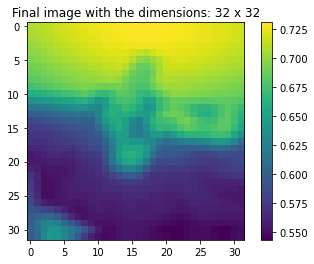

Applying filter kernel 4


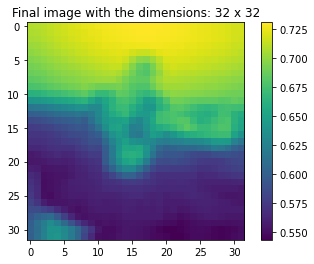

Applying filter kernel 5


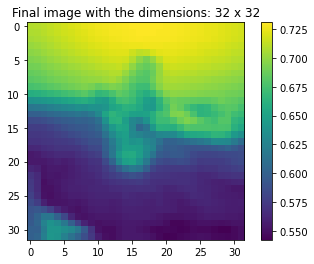

Applying filter kernel 6


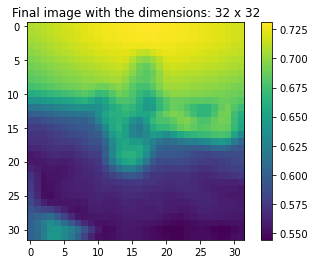

Applying filter kernel 7


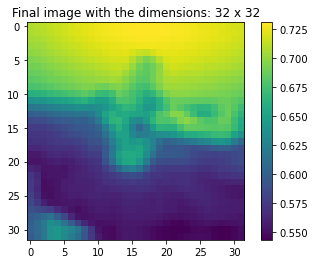

Applying filter kernel 8


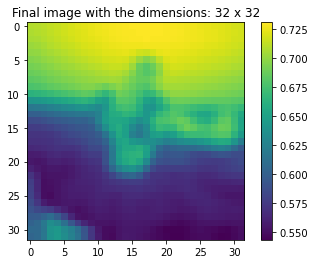

Applying filter kernel 9


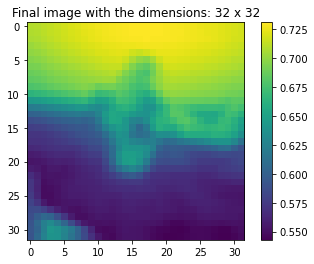

Applying filter kernel 10


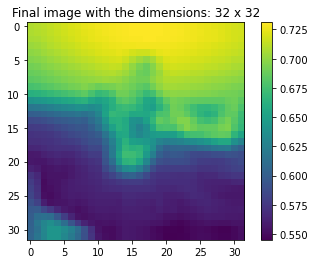

Applying filter kernel 11


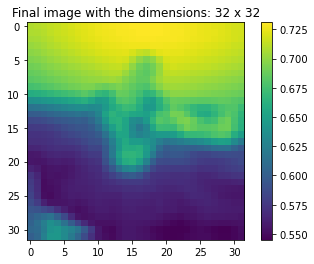

Applying filter kernel 12


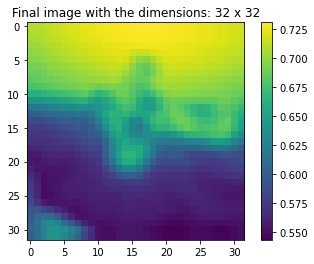

Applying filter kernel 13


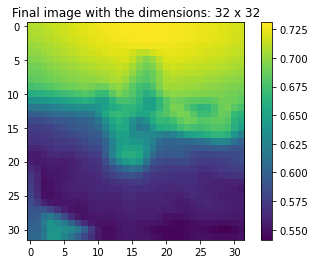

Applying filter kernel 14


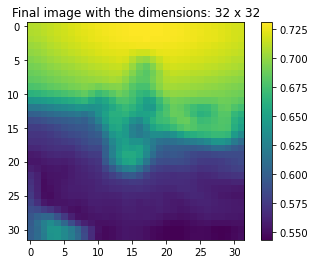

Applying filter kernel 15


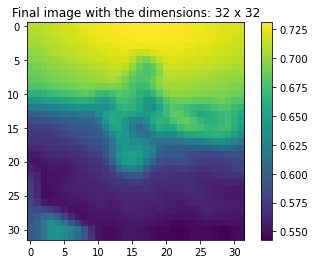

Applying filter kernel 16


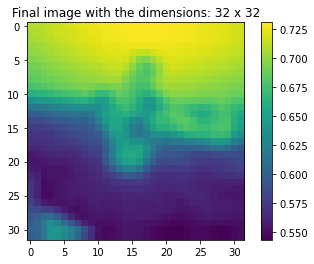

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


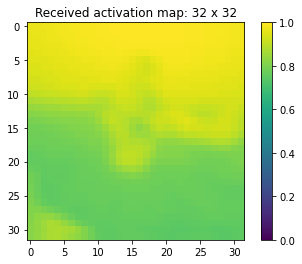

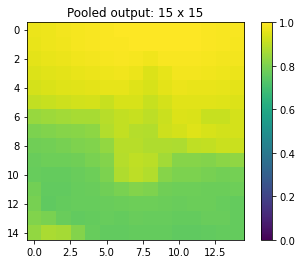

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


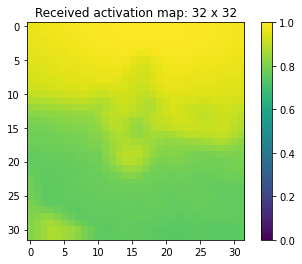

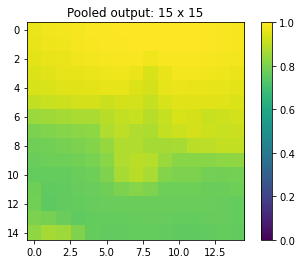

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


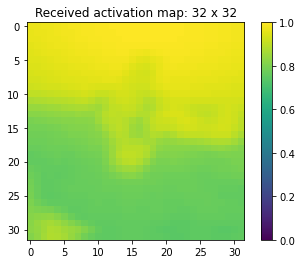

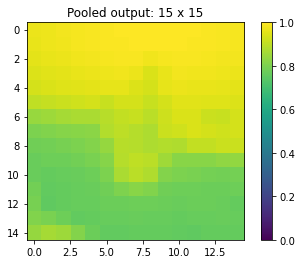

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


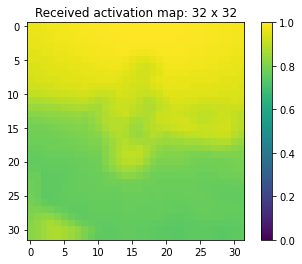

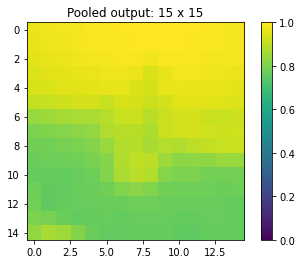

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


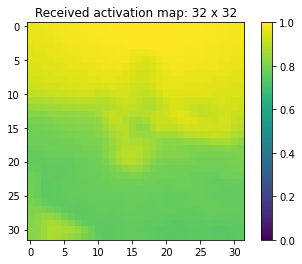

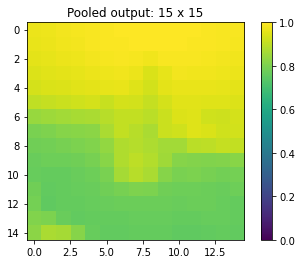

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


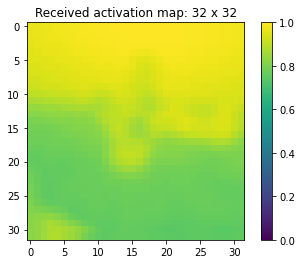

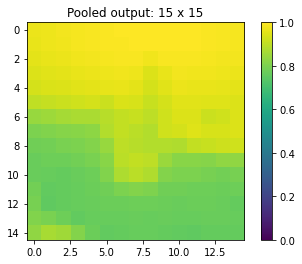

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


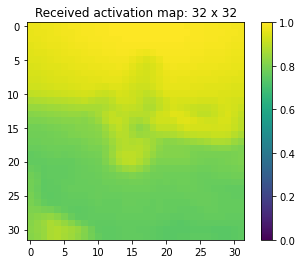

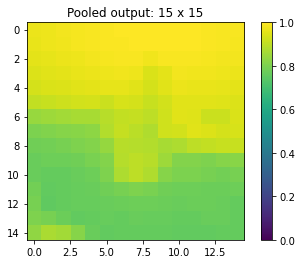

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


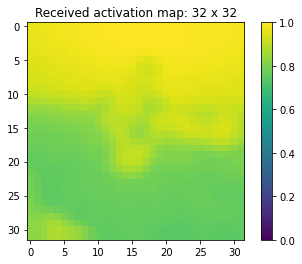

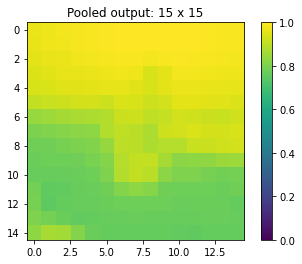

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


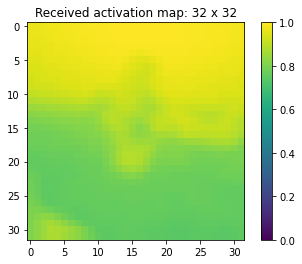

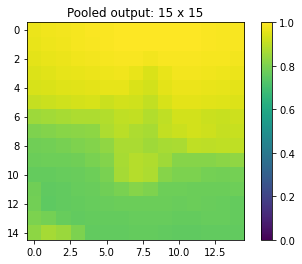

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


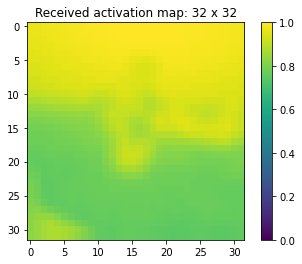

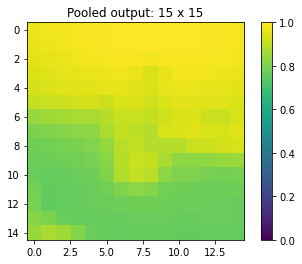

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


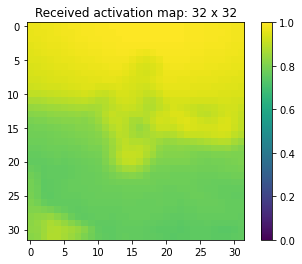

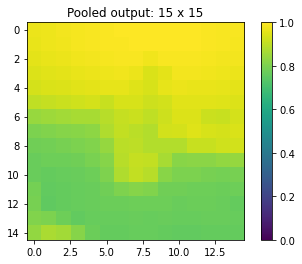

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


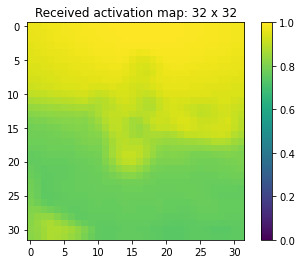

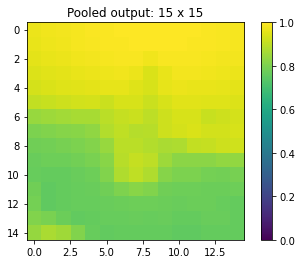

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


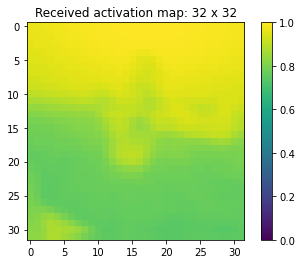

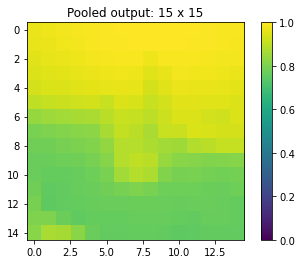

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


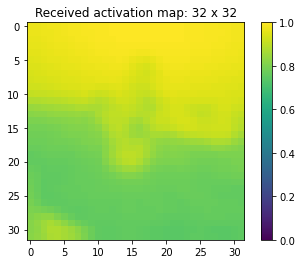

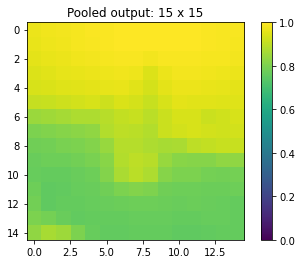

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


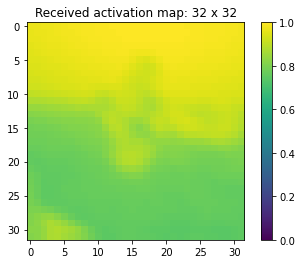

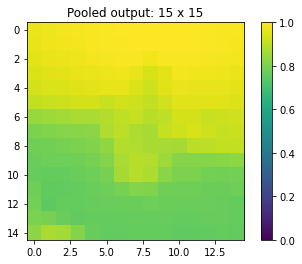

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


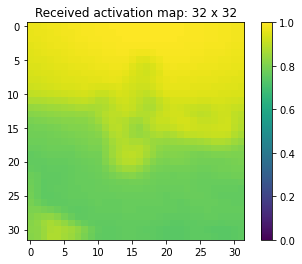

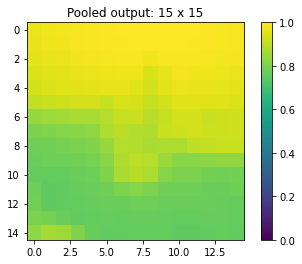

Applying filter kernel 1


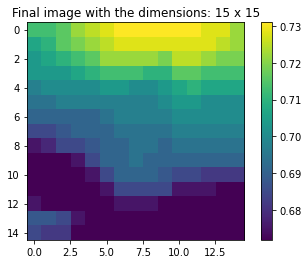

Applying filter kernel 2


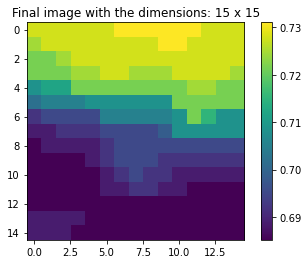

Applying filter kernel 3


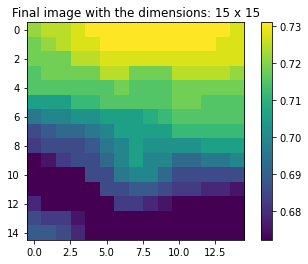

Applying filter kernel 4


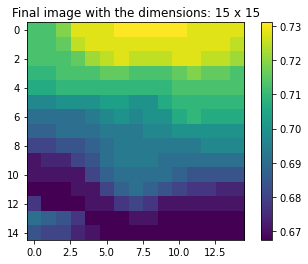

Applying filter kernel 5


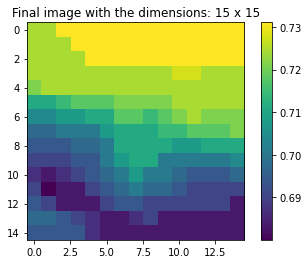

Applying filter kernel 6


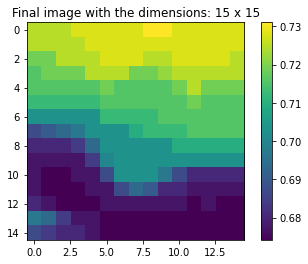

Applying filter kernel 7


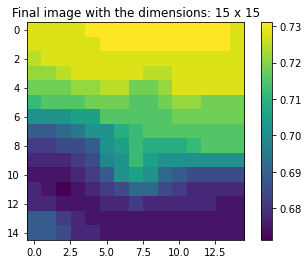

Applying filter kernel 8


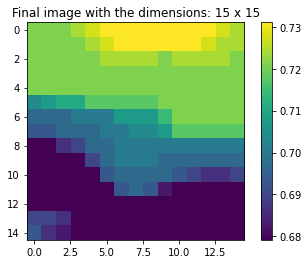

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


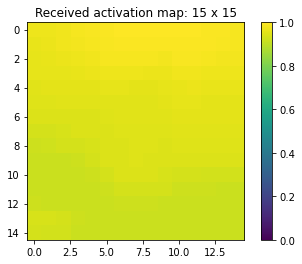

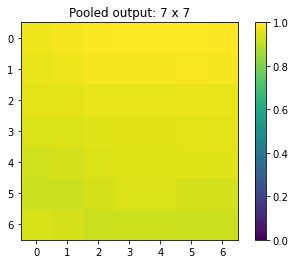

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


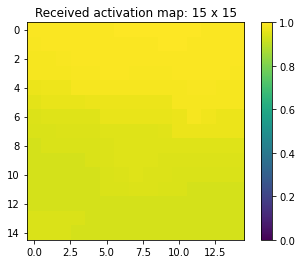

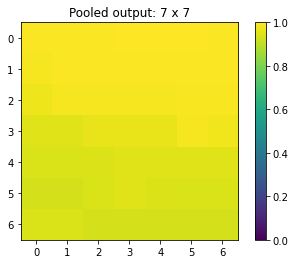

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


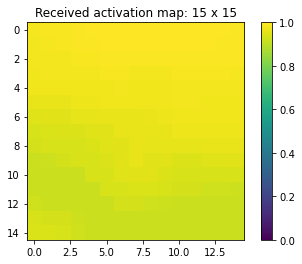

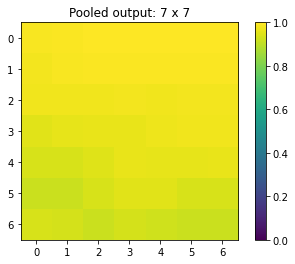

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


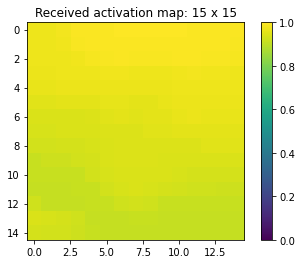

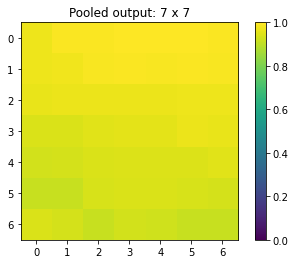

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


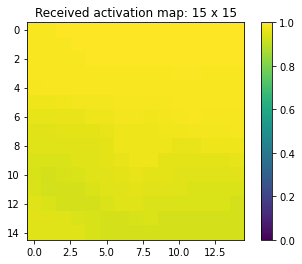

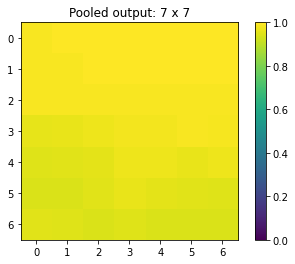

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


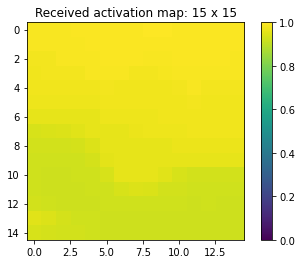

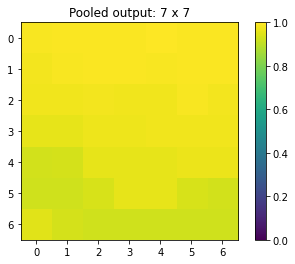

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


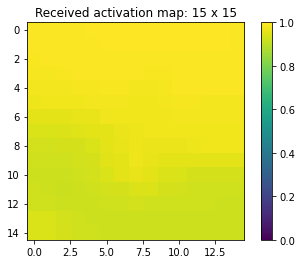

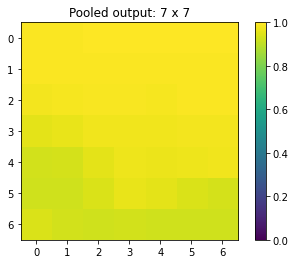

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


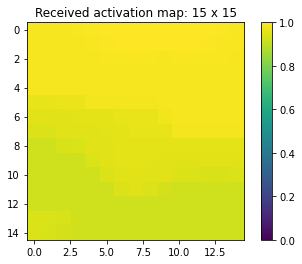

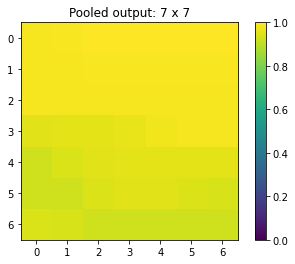

Applying filter kernel 1


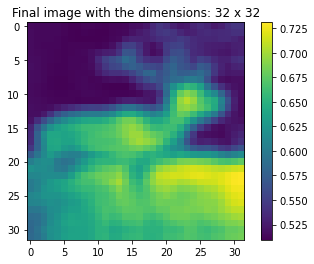

Applying filter kernel 2


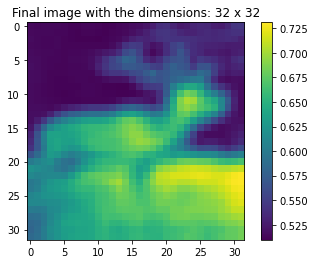

Applying filter kernel 3


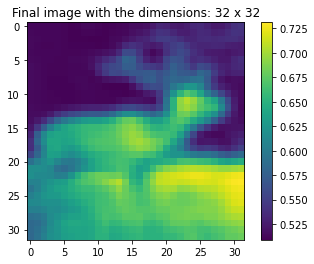

Applying filter kernel 4


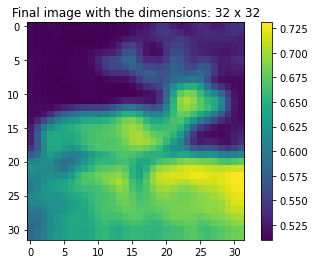

Applying filter kernel 5


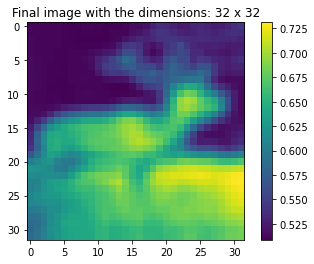

Applying filter kernel 6


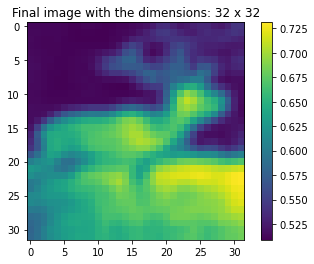

Applying filter kernel 7


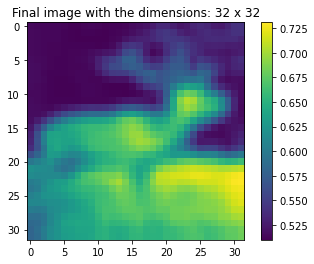

Applying filter kernel 8


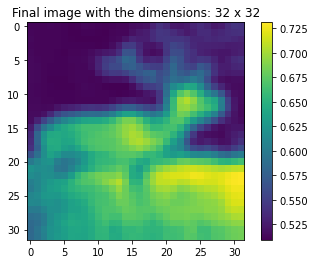

Applying filter kernel 9


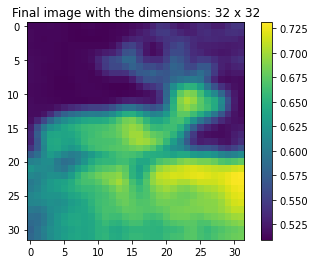

Applying filter kernel 10


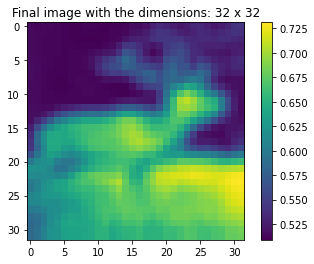

Applying filter kernel 11


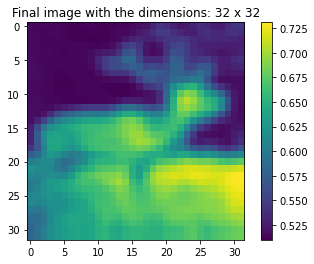

Applying filter kernel 12


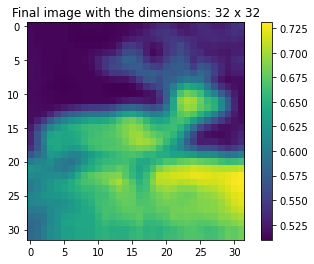

Applying filter kernel 13


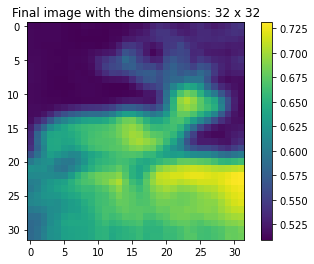

Applying filter kernel 14


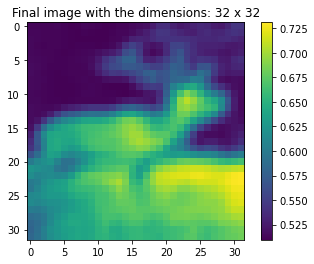

Applying filter kernel 15


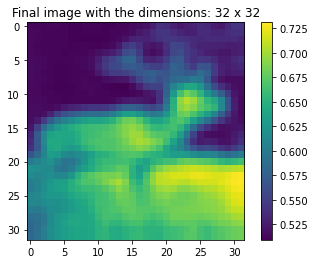

Applying filter kernel 16


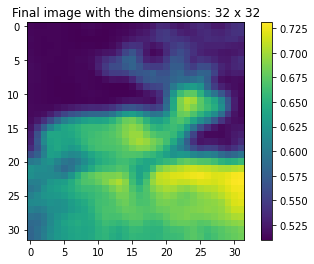

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


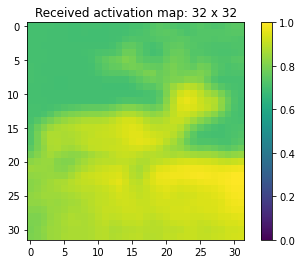

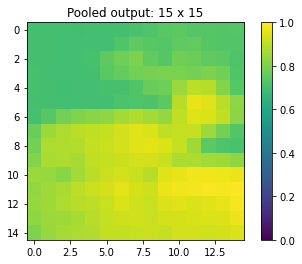

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


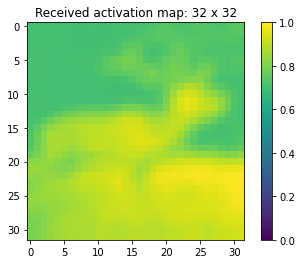

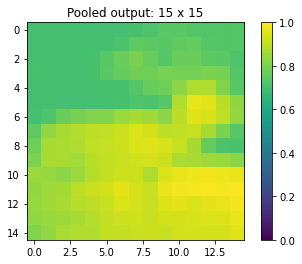

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


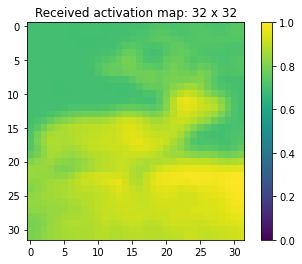

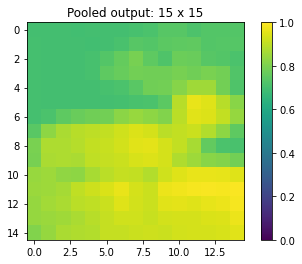

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


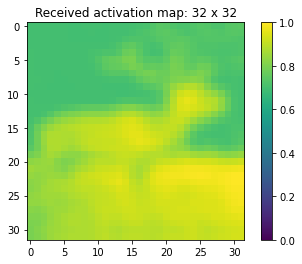

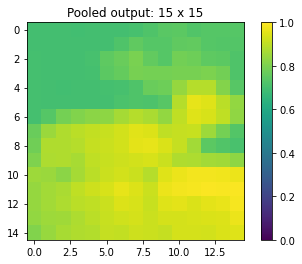

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


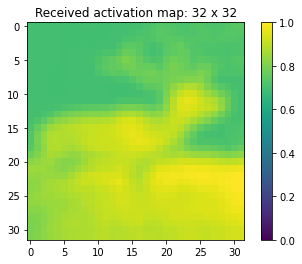

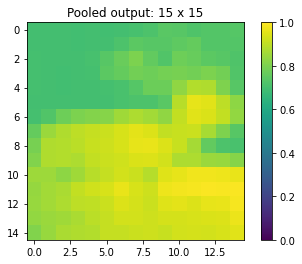

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


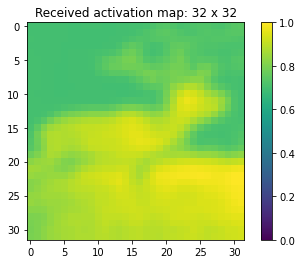

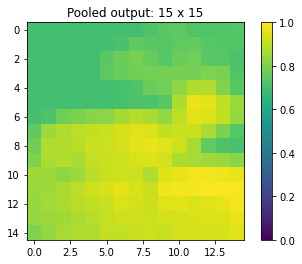

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


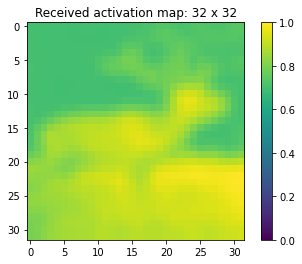

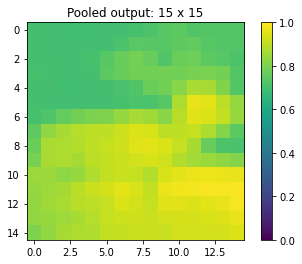

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


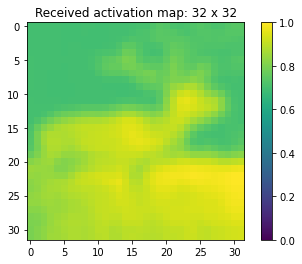

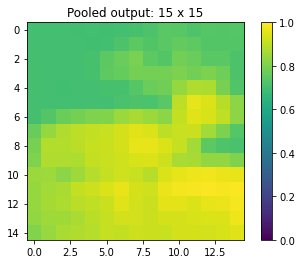

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


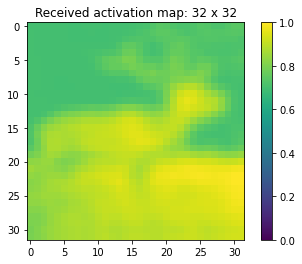

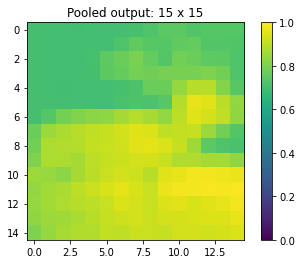

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


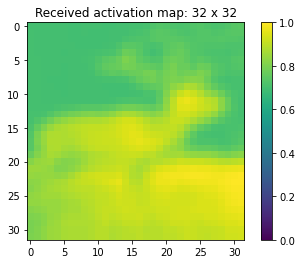

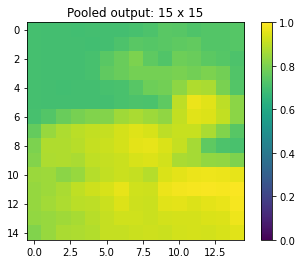

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


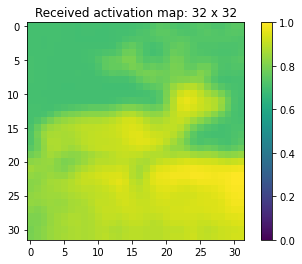

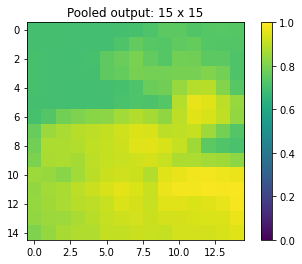

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


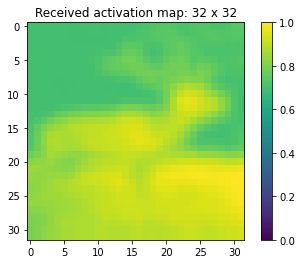

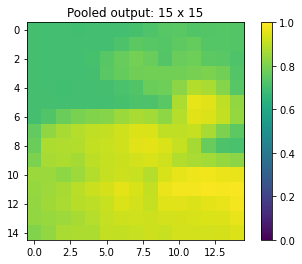

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


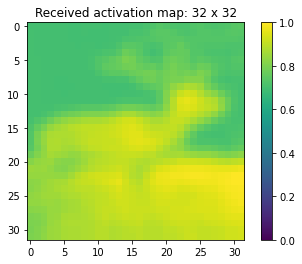

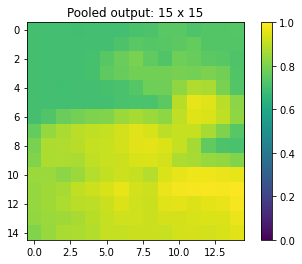

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


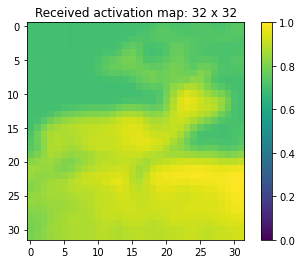

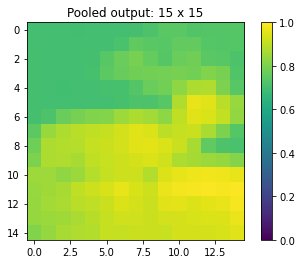

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


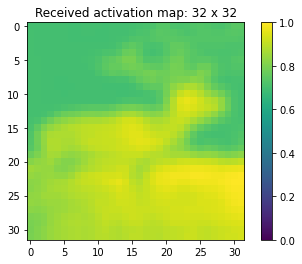

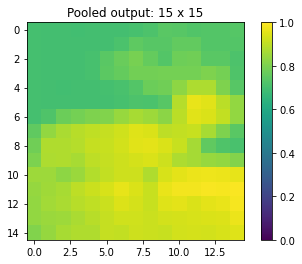

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


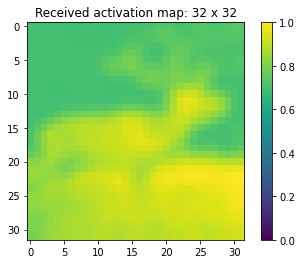

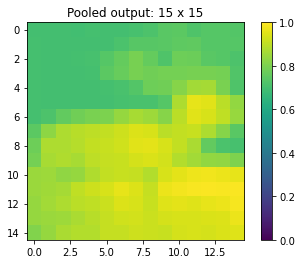

Applying filter kernel 1


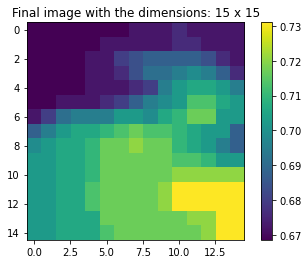

Applying filter kernel 2


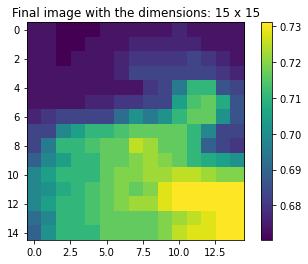

Applying filter kernel 3


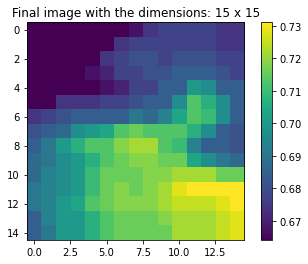

Applying filter kernel 4


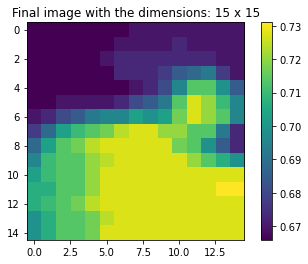

Applying filter kernel 5


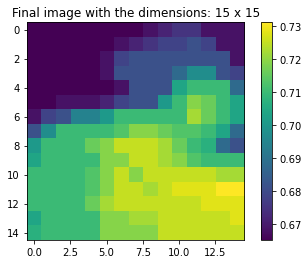

Applying filter kernel 6


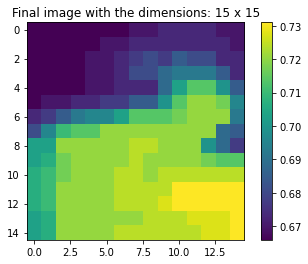

Applying filter kernel 7


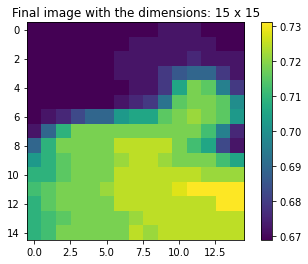

Applying filter kernel 8


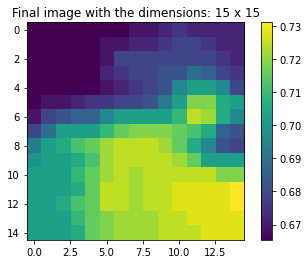

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


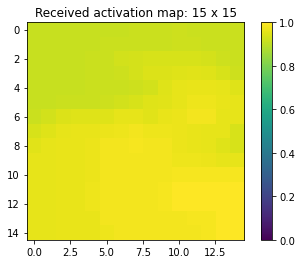

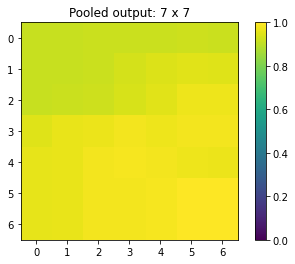

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


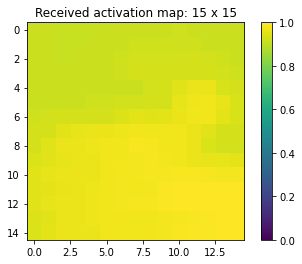

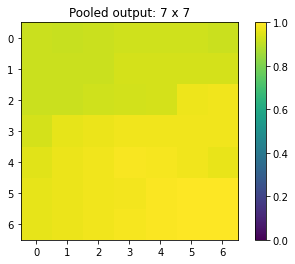

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


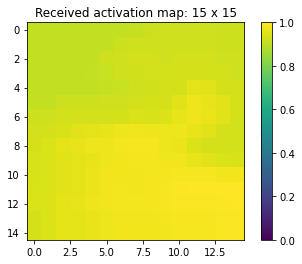

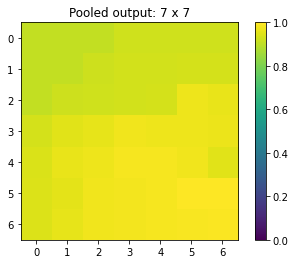

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


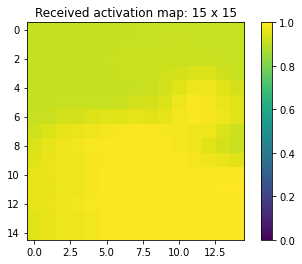

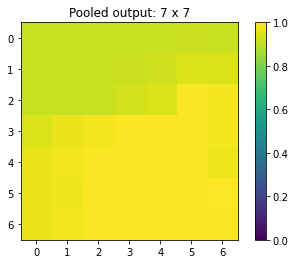

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


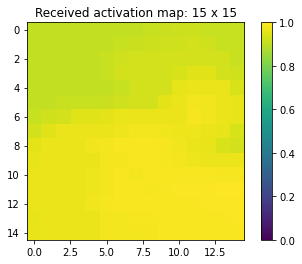

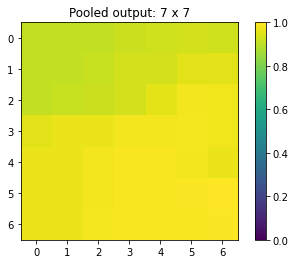

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


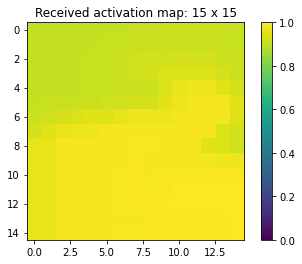

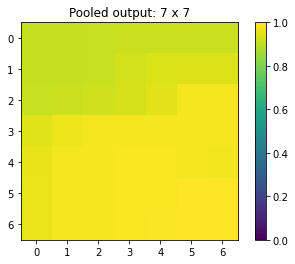

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


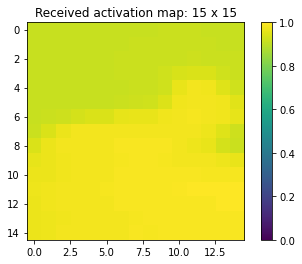

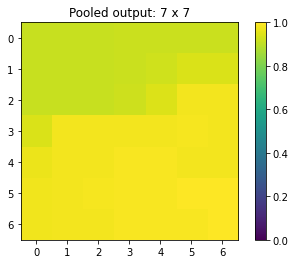

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


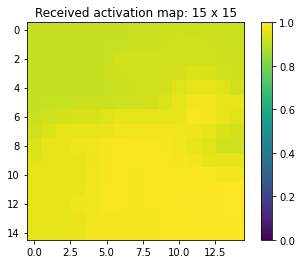

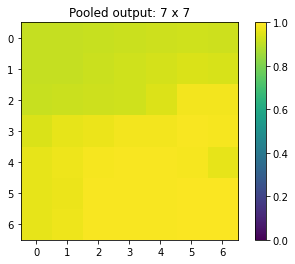

Applying filter kernel 1


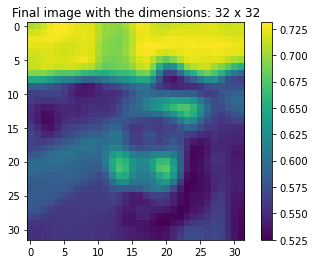

Applying filter kernel 2


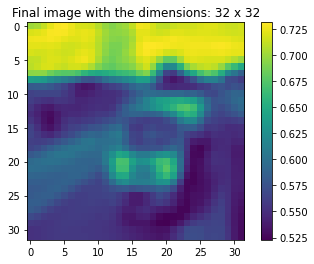

Applying filter kernel 3


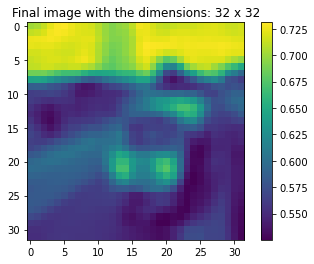

Applying filter kernel 4


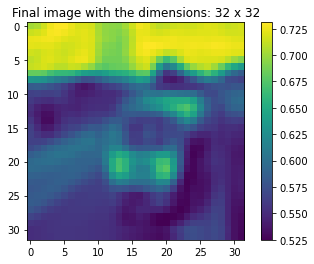

Applying filter kernel 5


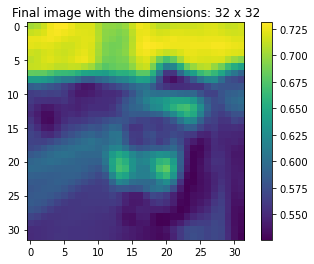

Applying filter kernel 6


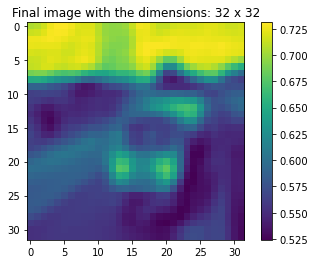

Applying filter kernel 7


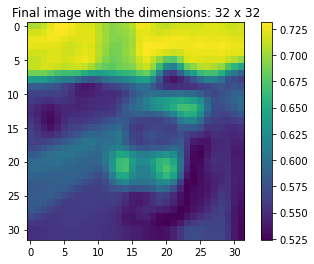

Applying filter kernel 8


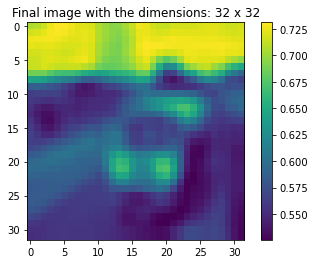

Applying filter kernel 9


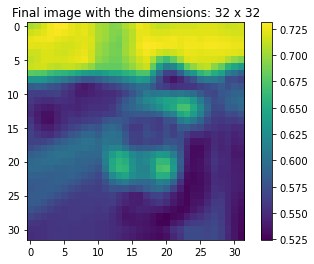

Applying filter kernel 10


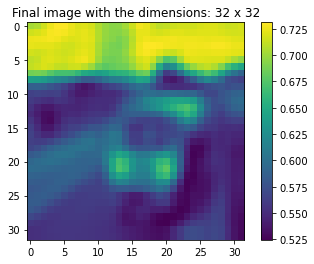

Applying filter kernel 11


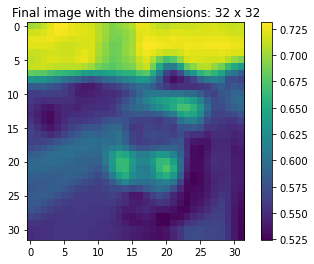

Applying filter kernel 12


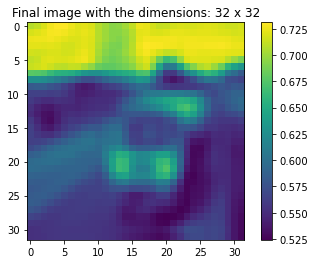

Applying filter kernel 13


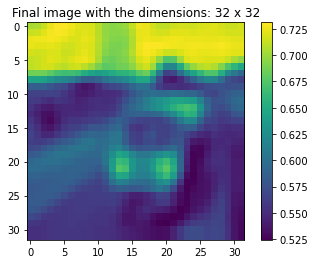

Applying filter kernel 14


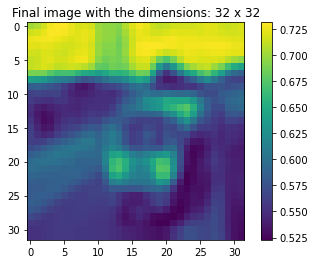

Applying filter kernel 15


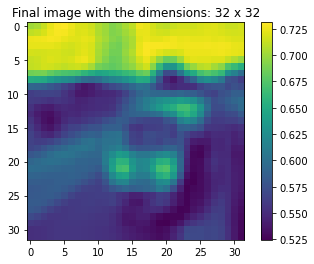

Applying filter kernel 16


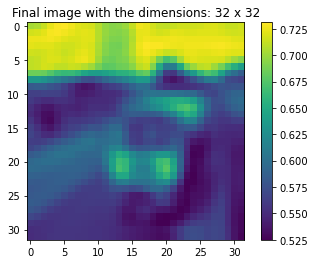

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


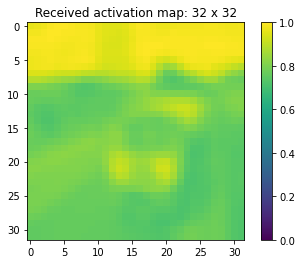

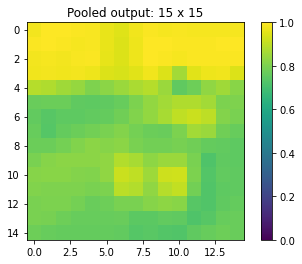

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


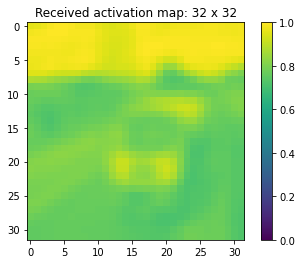

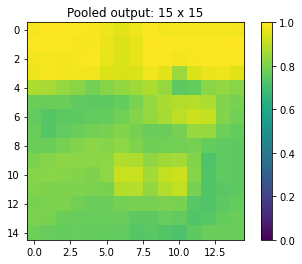

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


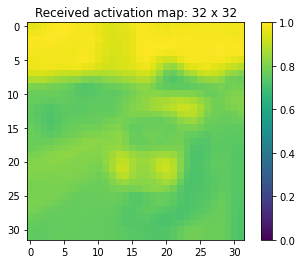

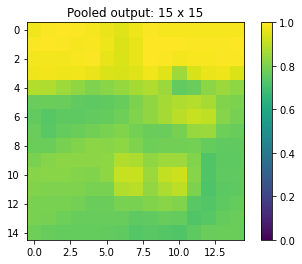

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


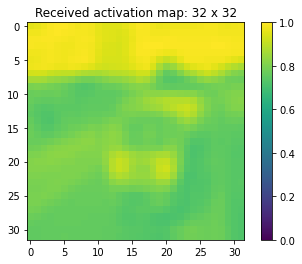

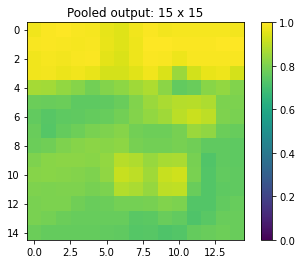

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


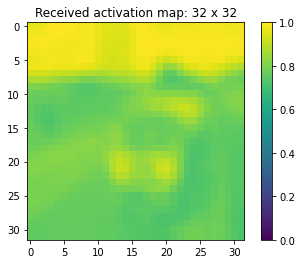

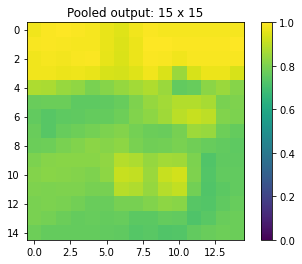

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


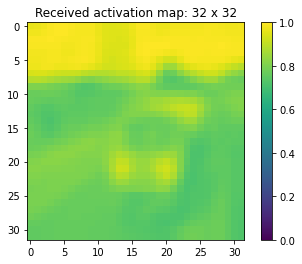

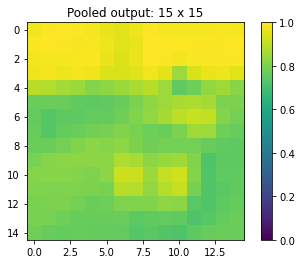

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


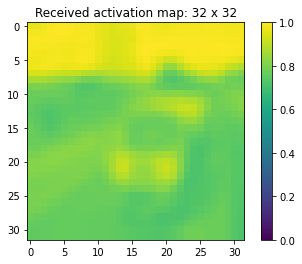

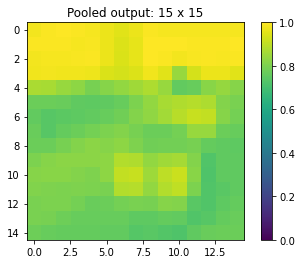

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


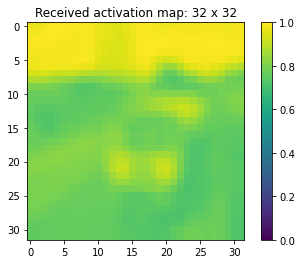

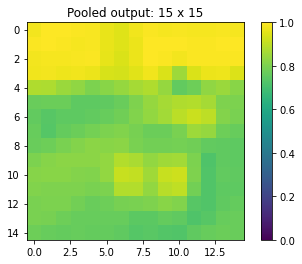

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


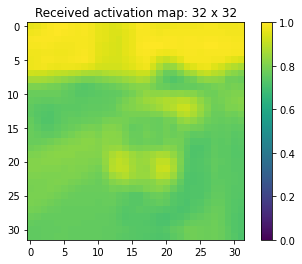

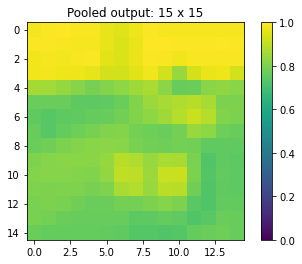

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


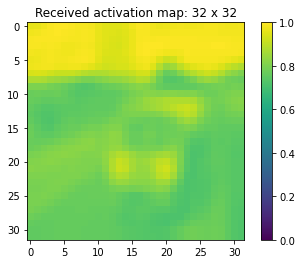

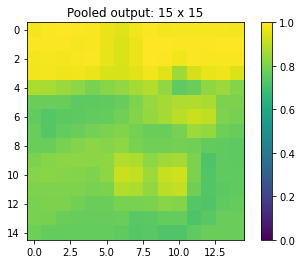

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


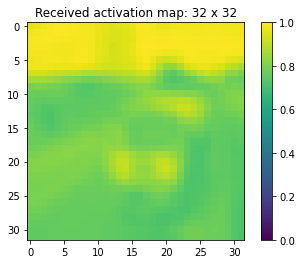

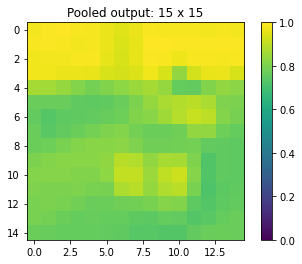

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


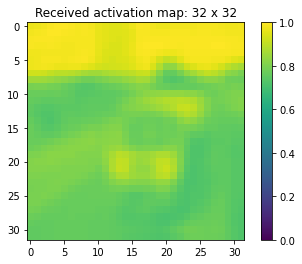

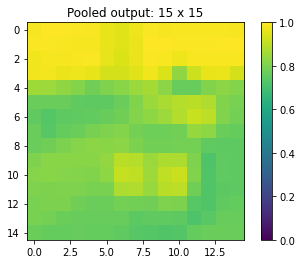

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


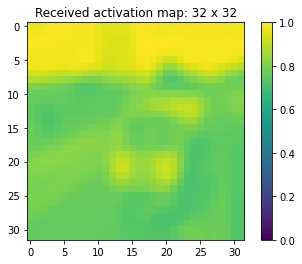

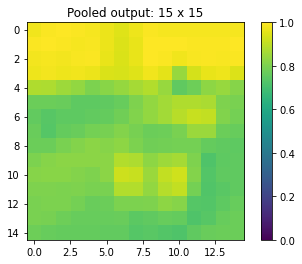

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


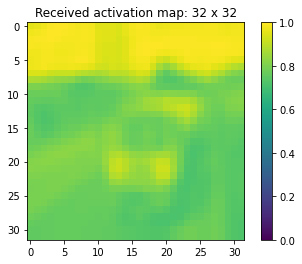

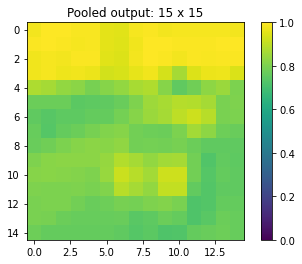

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


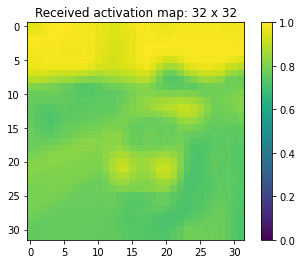

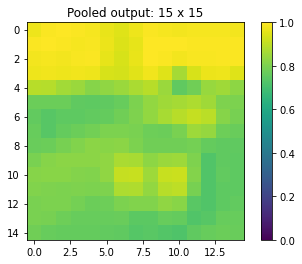

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


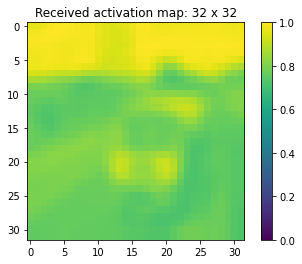

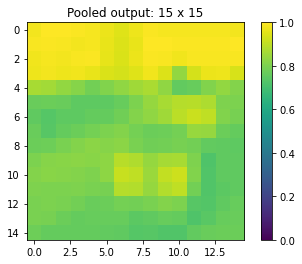

Applying filter kernel 1


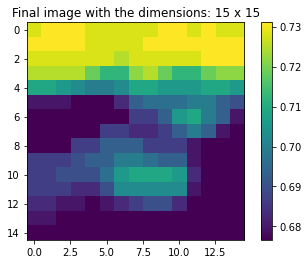

Applying filter kernel 2


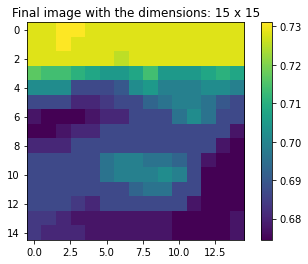

Applying filter kernel 3


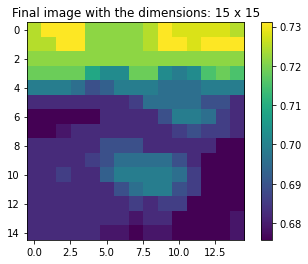

Applying filter kernel 4


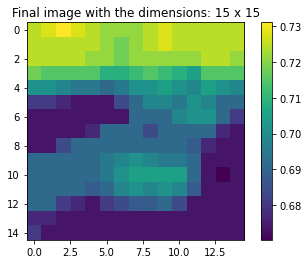

Applying filter kernel 5


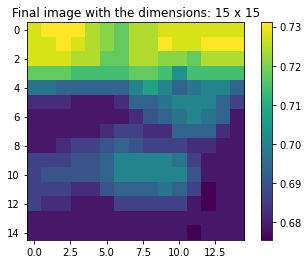

Applying filter kernel 6


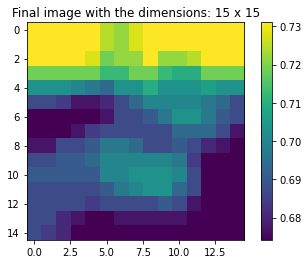

Applying filter kernel 7


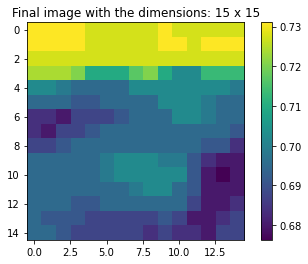

Applying filter kernel 8


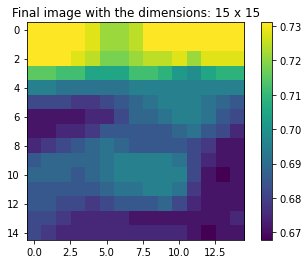

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


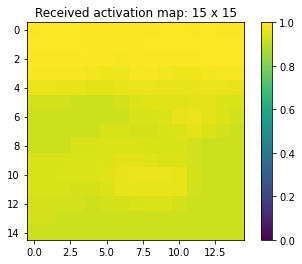

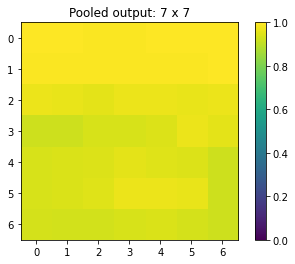

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


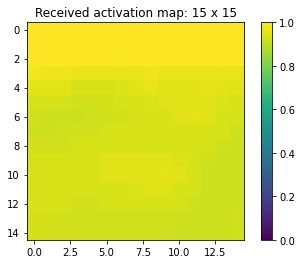

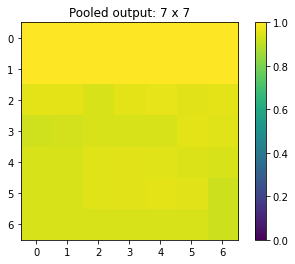

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


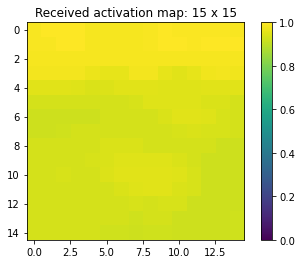

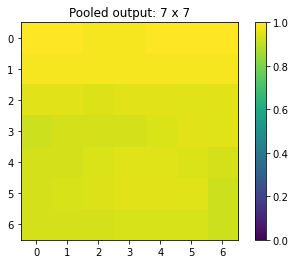

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


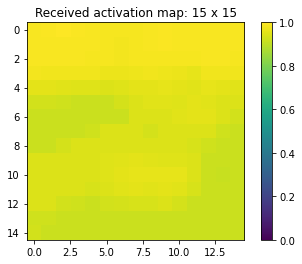

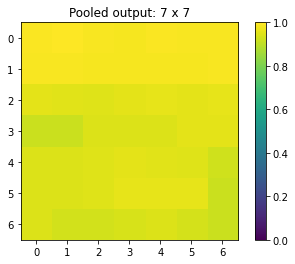

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


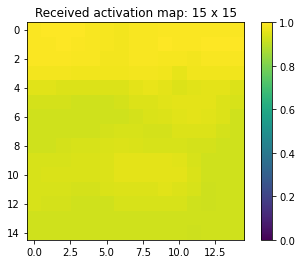

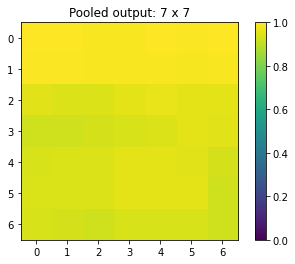

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


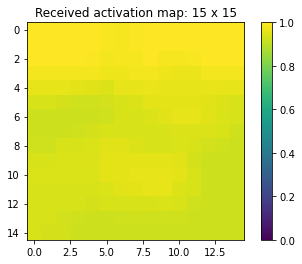

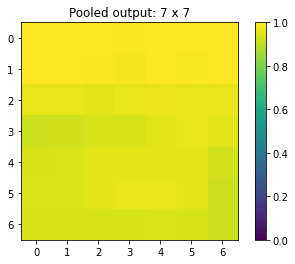

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


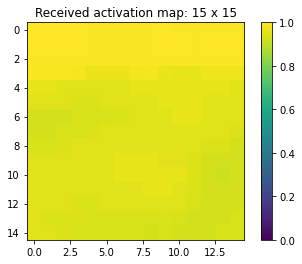

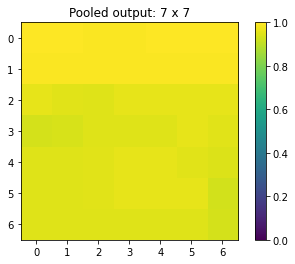

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


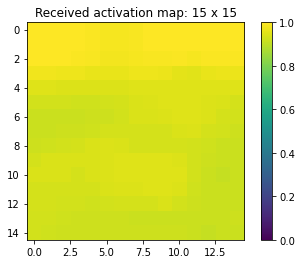

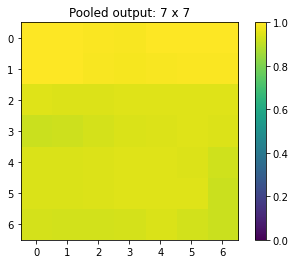

Applying filter kernel 1


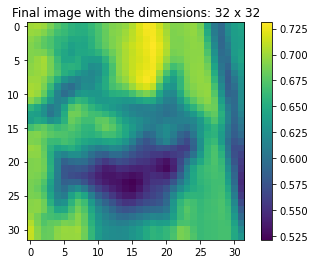

Applying filter kernel 2


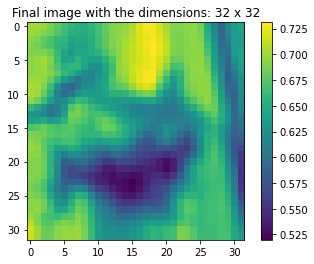

Applying filter kernel 3


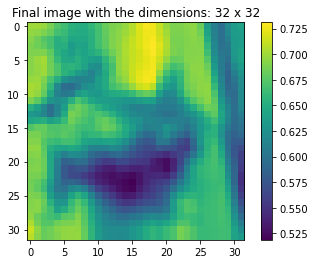

Applying filter kernel 4


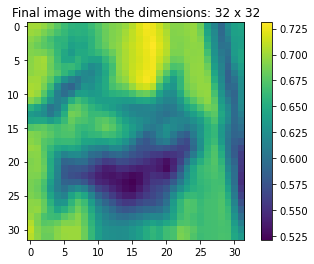

Applying filter kernel 5


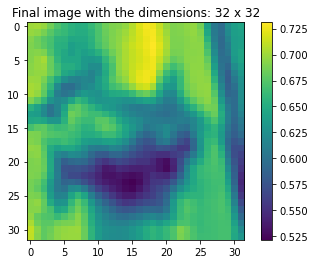

Applying filter kernel 6


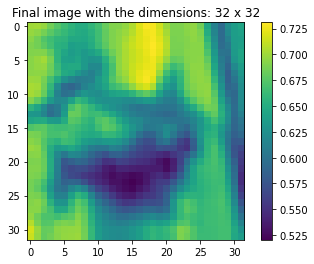

Applying filter kernel 7


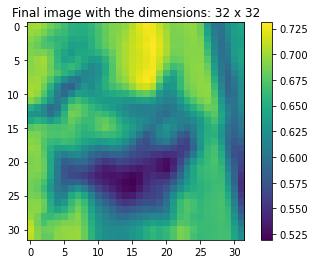

Applying filter kernel 8


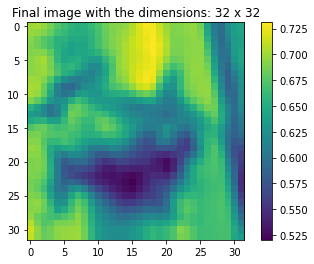

Applying filter kernel 9


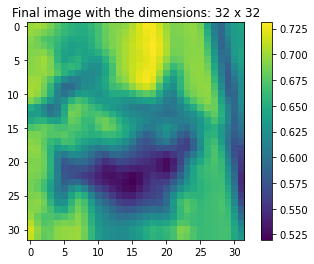

Applying filter kernel 10


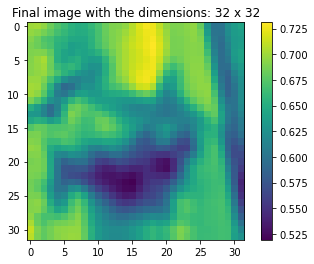

Applying filter kernel 11


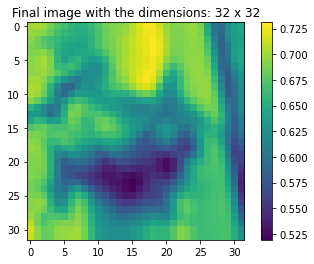

Applying filter kernel 12


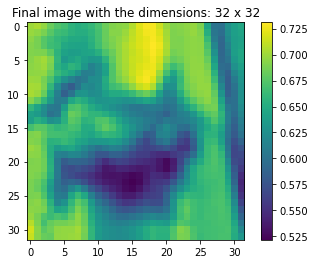

Applying filter kernel 13


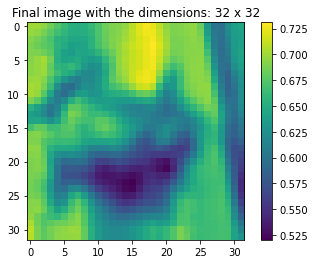

Applying filter kernel 14


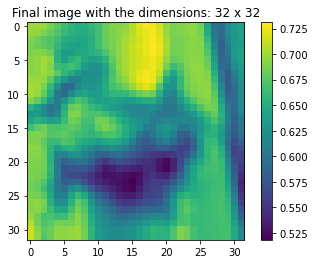

Applying filter kernel 15


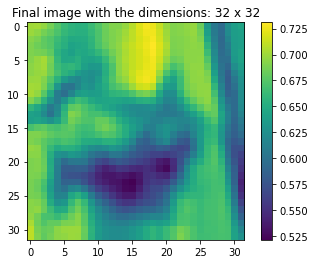

Applying filter kernel 16


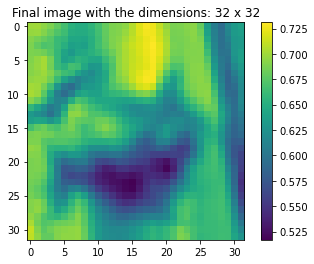

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


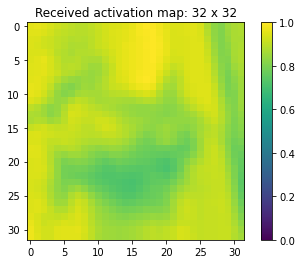

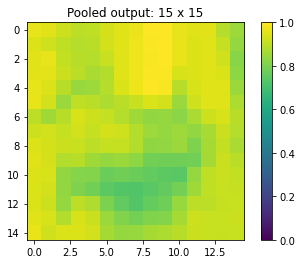

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


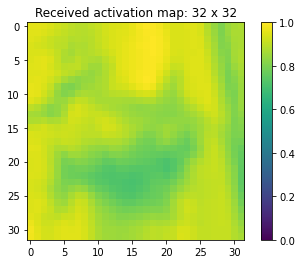

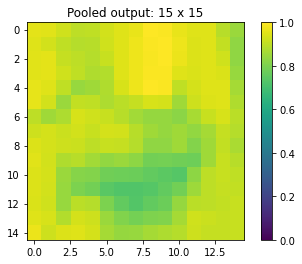

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


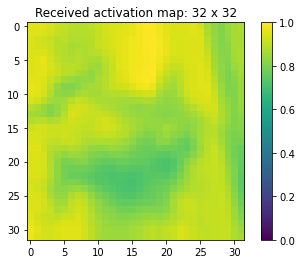

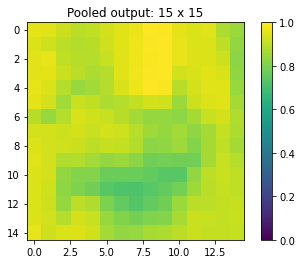

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


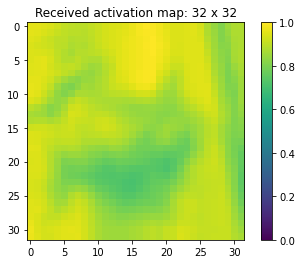

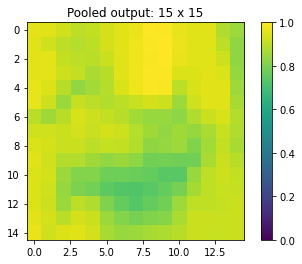

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


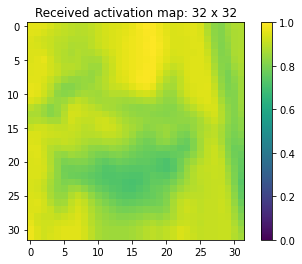

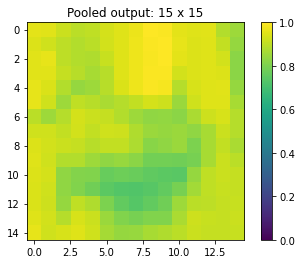

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


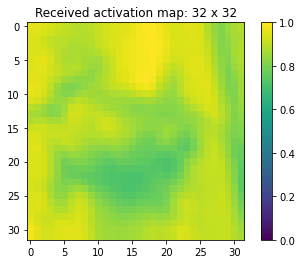

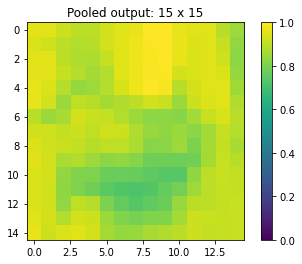

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


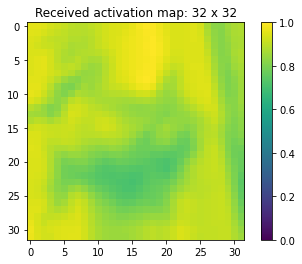

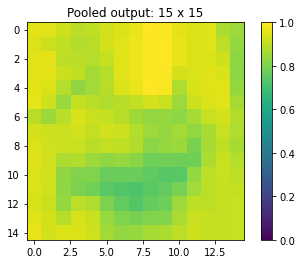

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


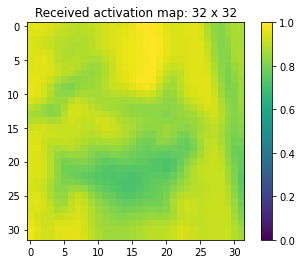

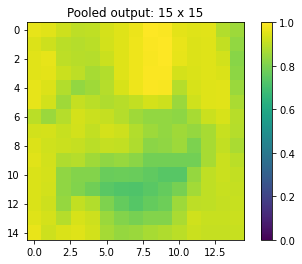

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


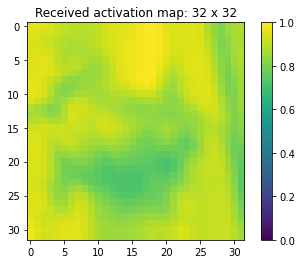

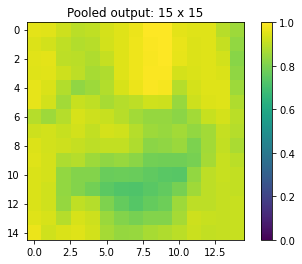

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


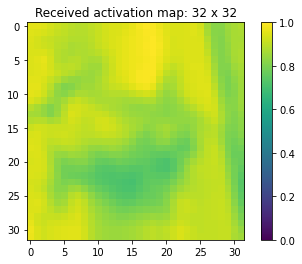

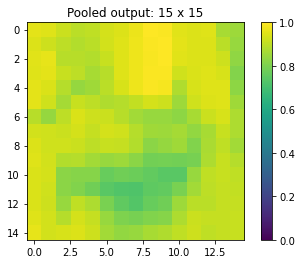

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


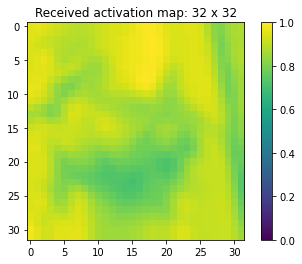

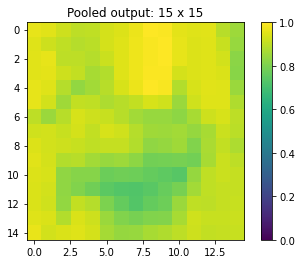

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


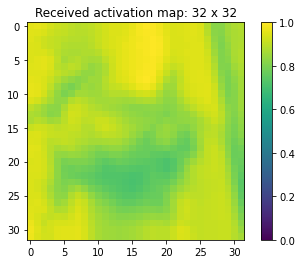

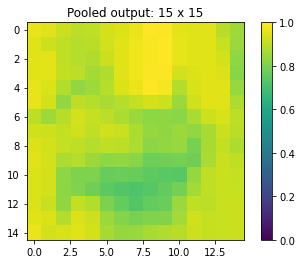

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


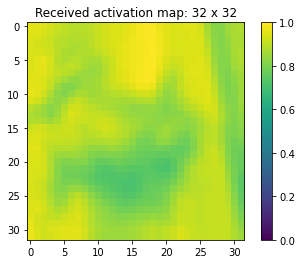

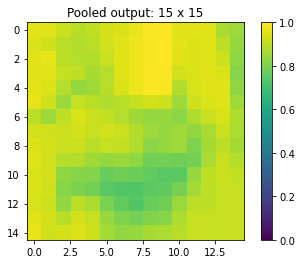

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


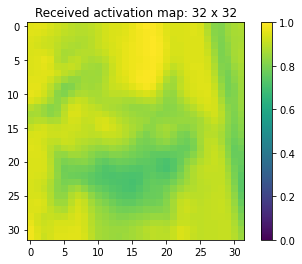

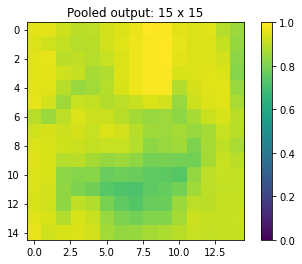

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


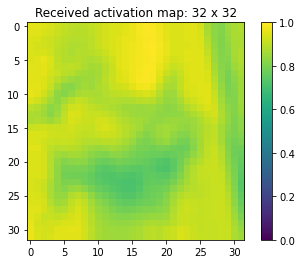

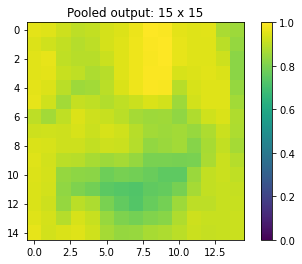

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


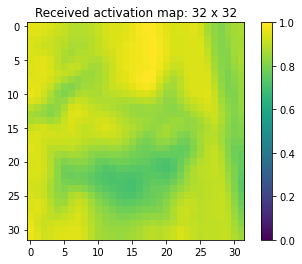

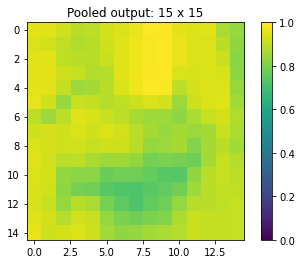

Applying filter kernel 1


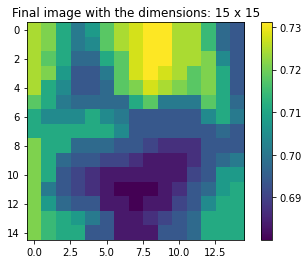

Applying filter kernel 2


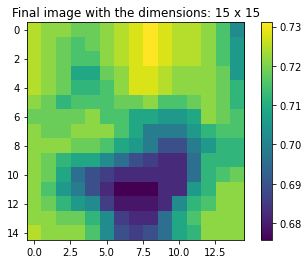

Applying filter kernel 3


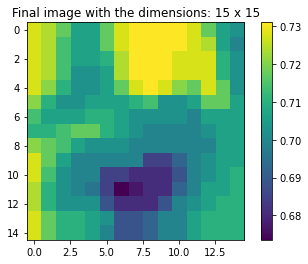

Applying filter kernel 4


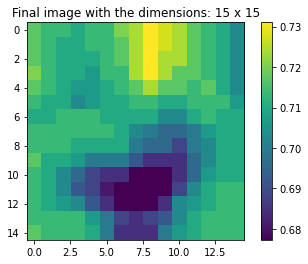

Applying filter kernel 5


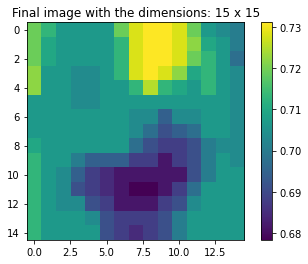

Applying filter kernel 6


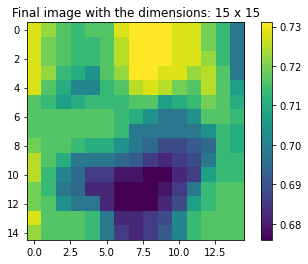

Applying filter kernel 7


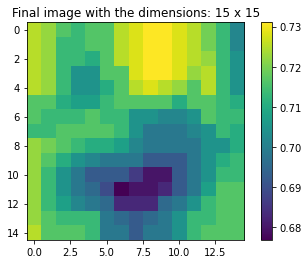

Applying filter kernel 8


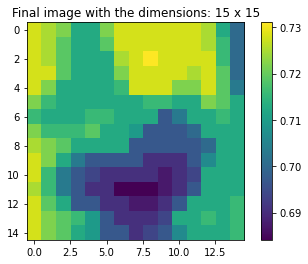

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


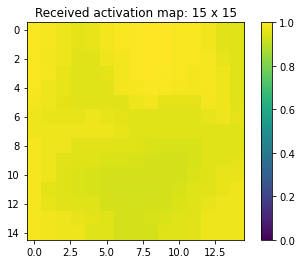

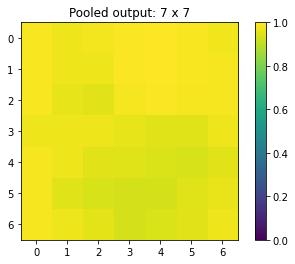

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


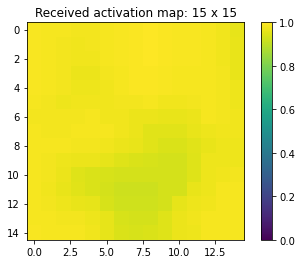

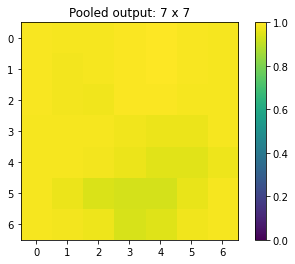

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


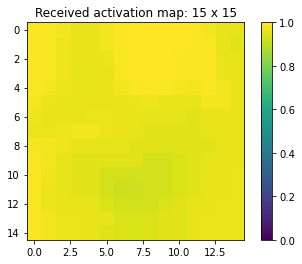

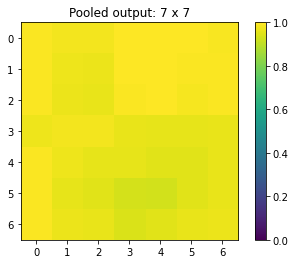

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


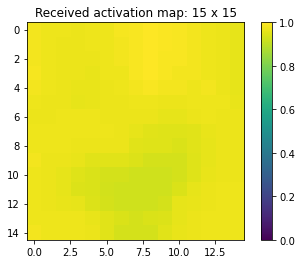

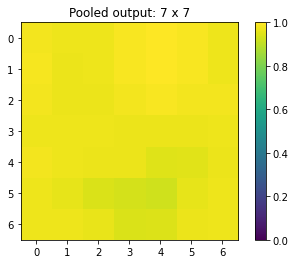

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


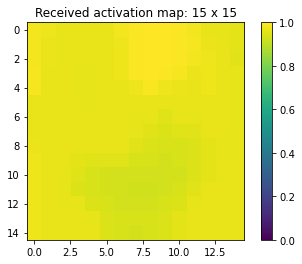

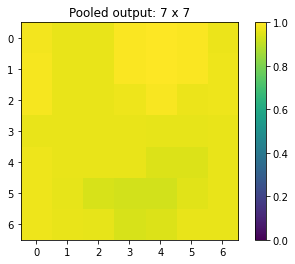

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


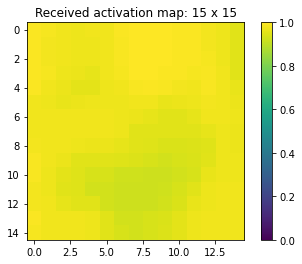

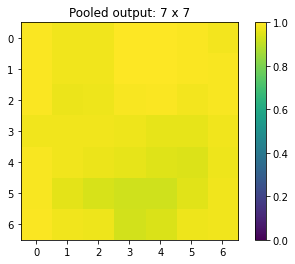

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


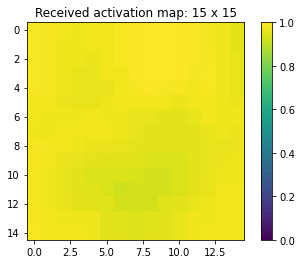

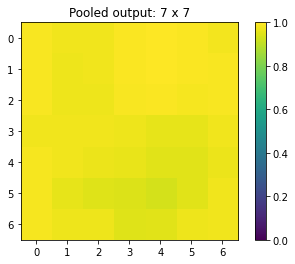

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


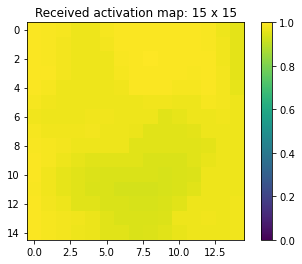

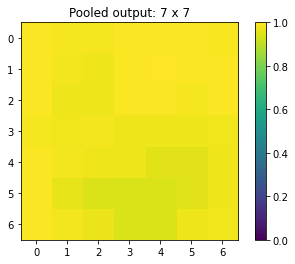

Applying filter kernel 1


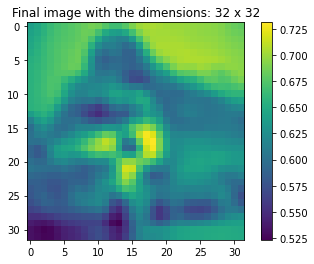

Applying filter kernel 2


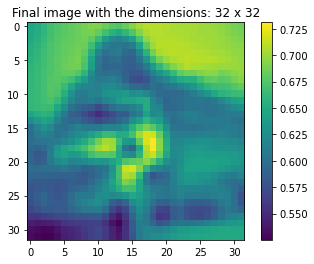

Applying filter kernel 3


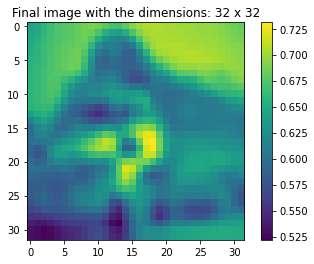

Applying filter kernel 4


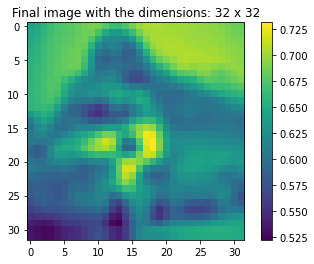

Applying filter kernel 5


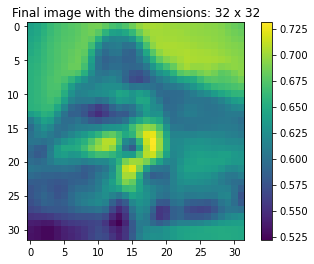

Applying filter kernel 6


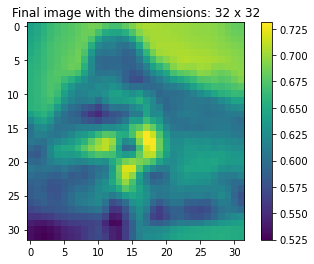

Applying filter kernel 7


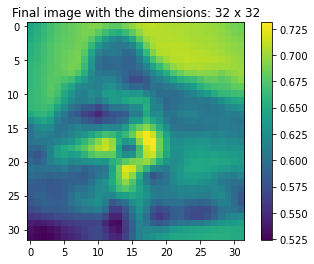

Applying filter kernel 8


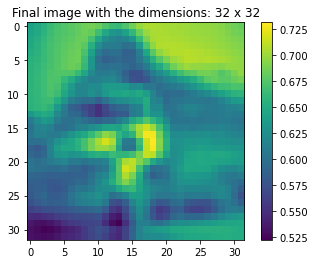

Applying filter kernel 9


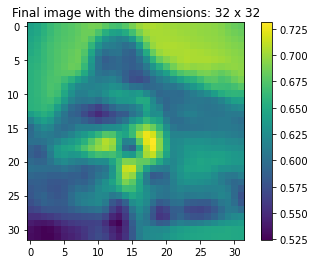

Applying filter kernel 10


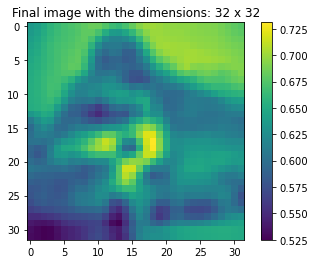

Applying filter kernel 11


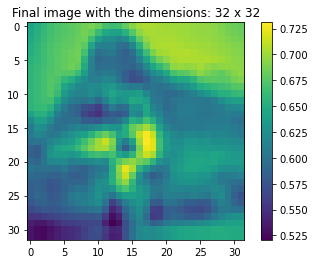

Applying filter kernel 12


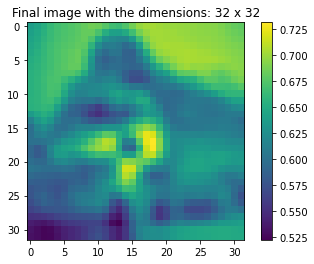

Applying filter kernel 13


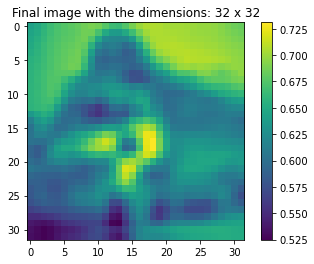

Applying filter kernel 14


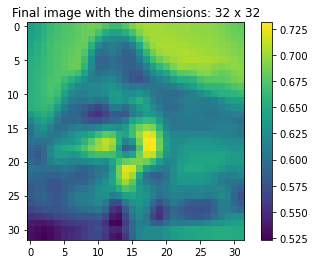

Applying filter kernel 15


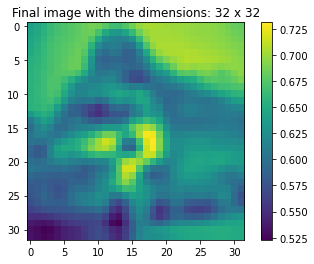

Applying filter kernel 16


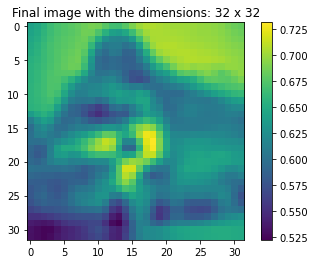

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


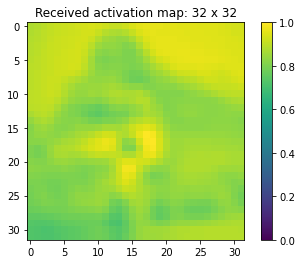

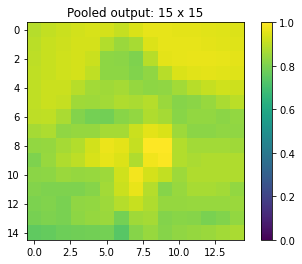

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


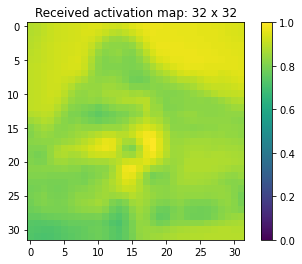

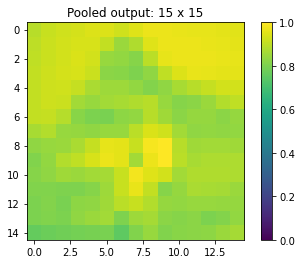

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


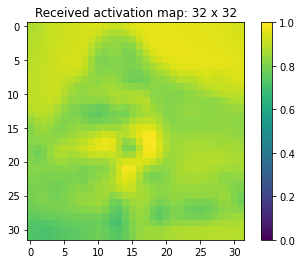

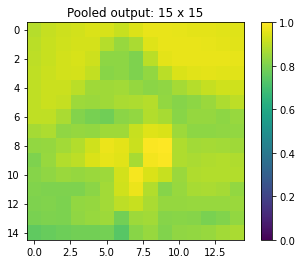

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


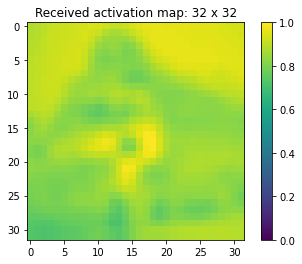

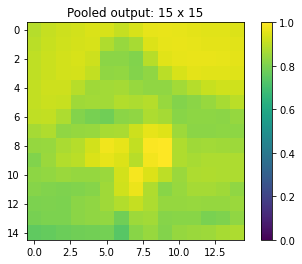

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


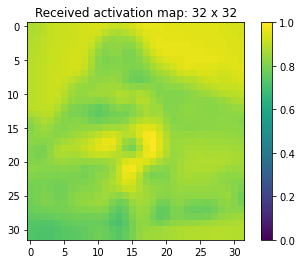

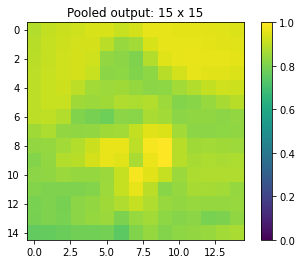

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


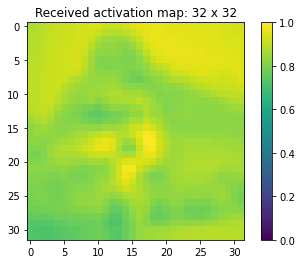

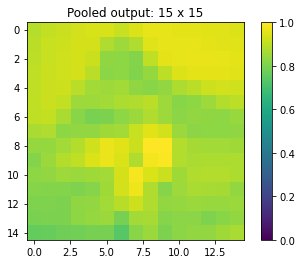

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


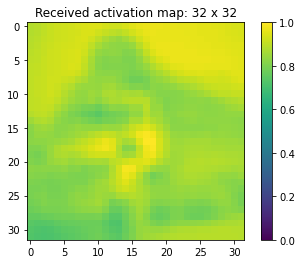

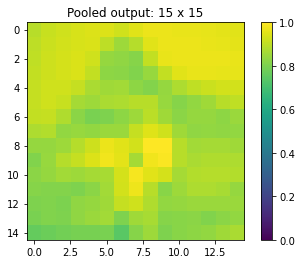

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


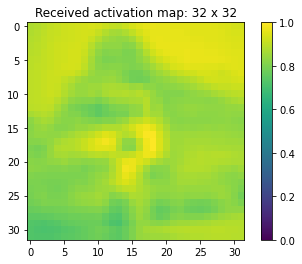

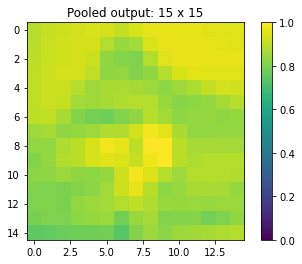

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


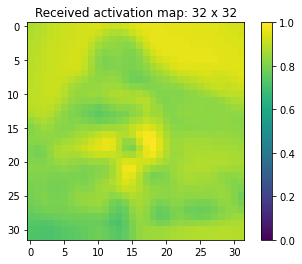

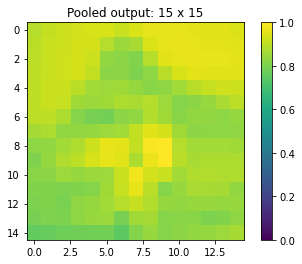

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


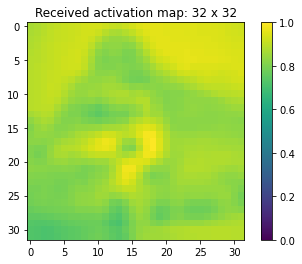

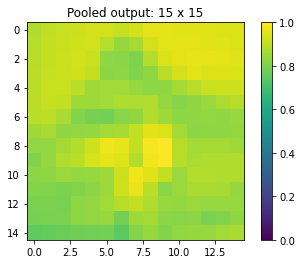

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


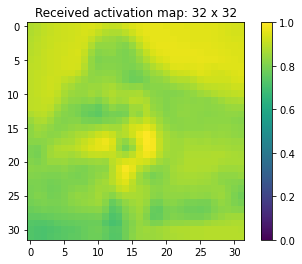

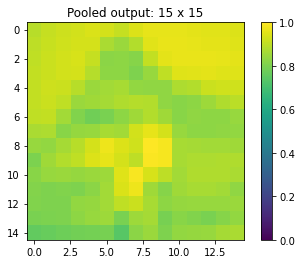

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


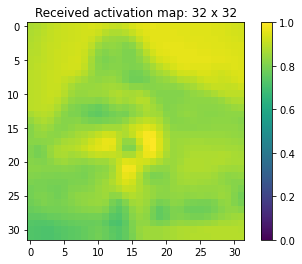

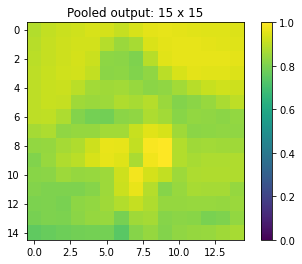

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


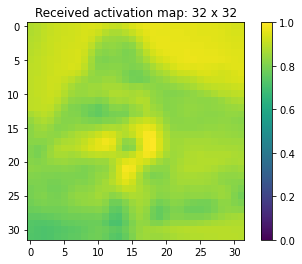

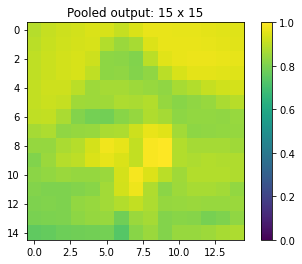

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


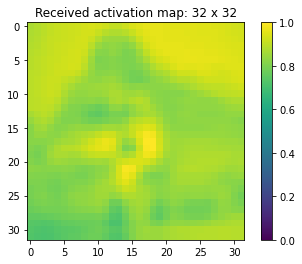

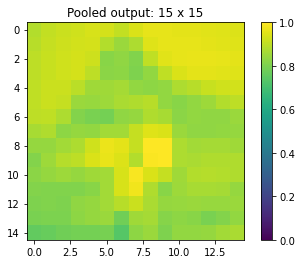

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


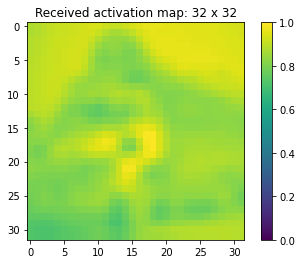

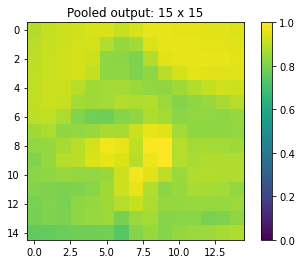

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


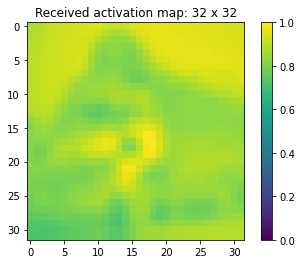

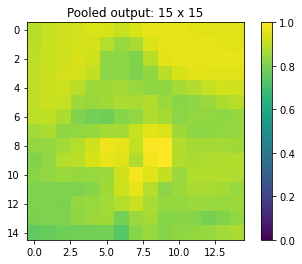

Applying filter kernel 1


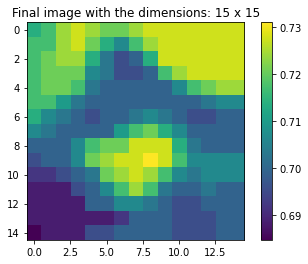

Applying filter kernel 2


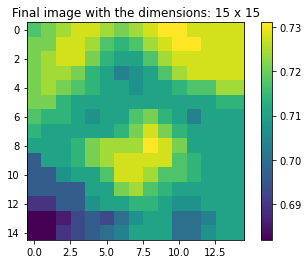

Applying filter kernel 3


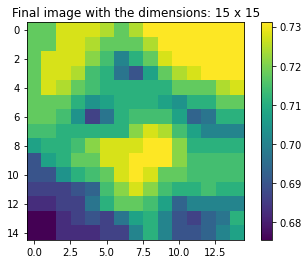

Applying filter kernel 4


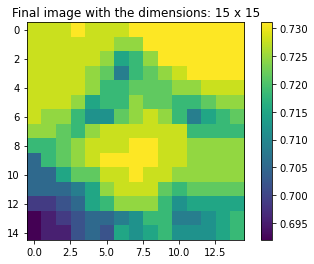

Applying filter kernel 5


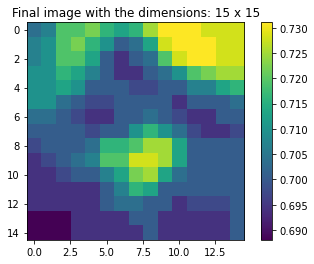

Applying filter kernel 6


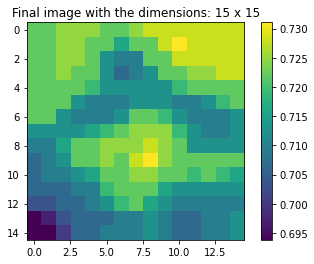

Applying filter kernel 7


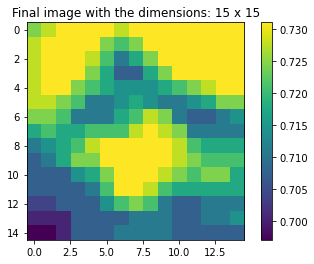

Applying filter kernel 8


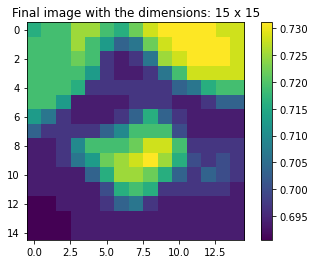

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


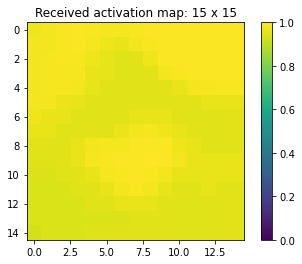

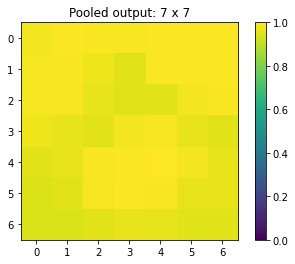

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


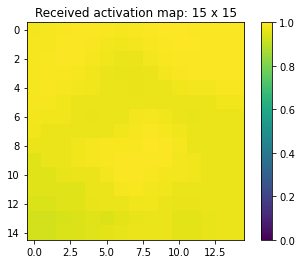

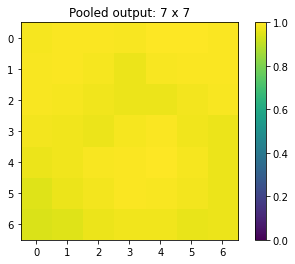

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


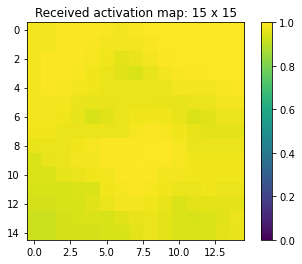

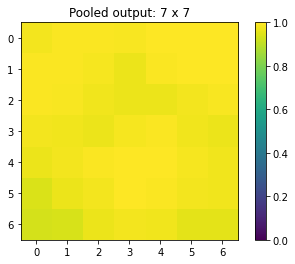

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


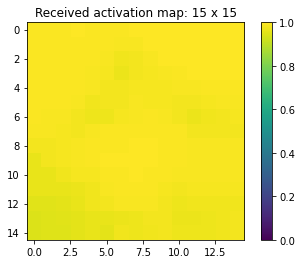

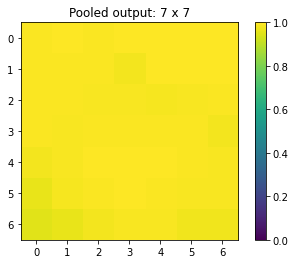

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


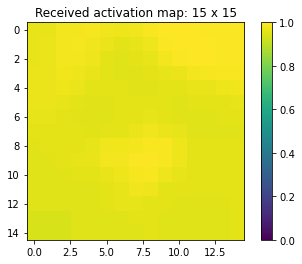

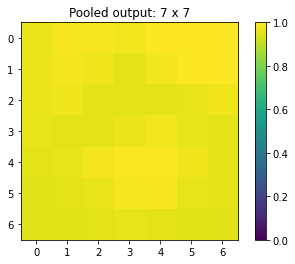

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


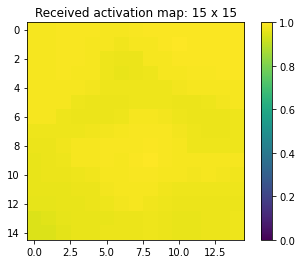

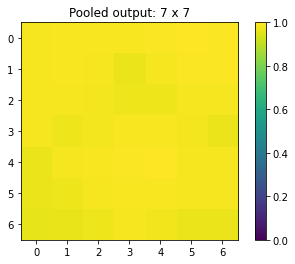

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


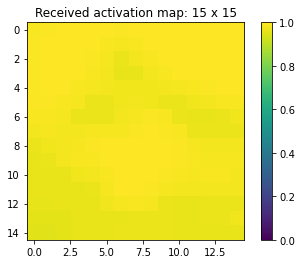

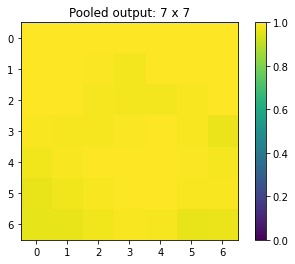

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


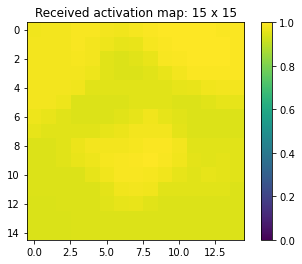

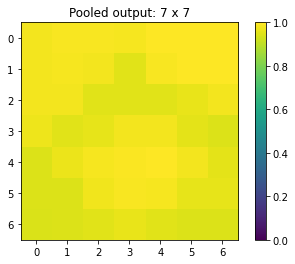

Applying filter kernel 1


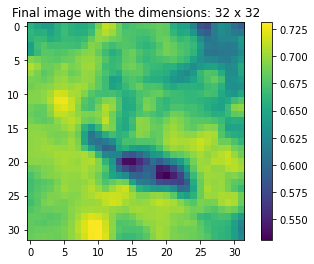

Applying filter kernel 2


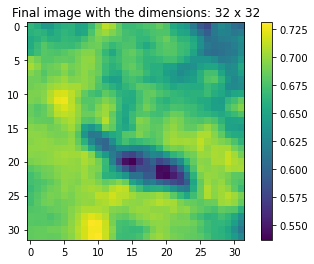

Applying filter kernel 3


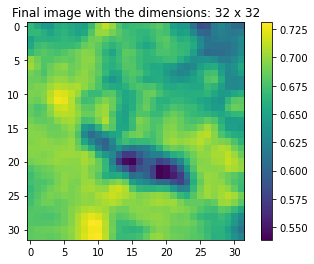

Applying filter kernel 4


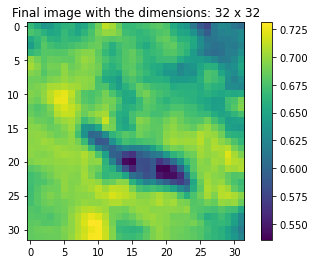

Applying filter kernel 5


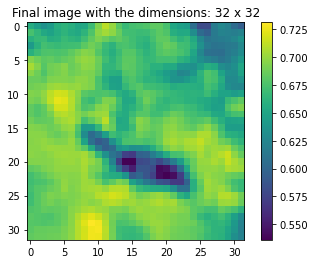

Applying filter kernel 6


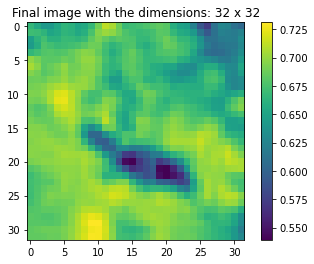

Applying filter kernel 7


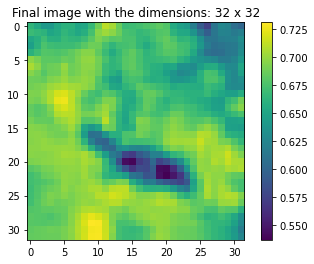

Applying filter kernel 8


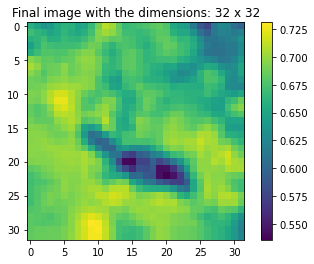

Applying filter kernel 9


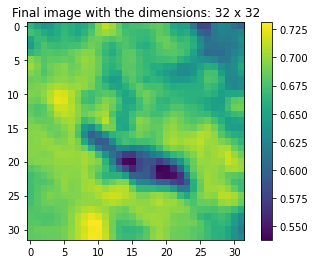

Applying filter kernel 10


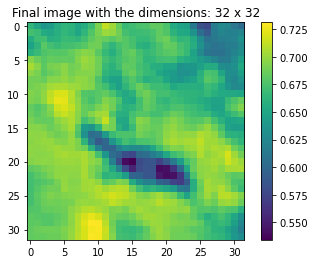

Applying filter kernel 11


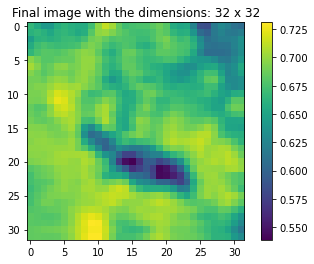

Applying filter kernel 12


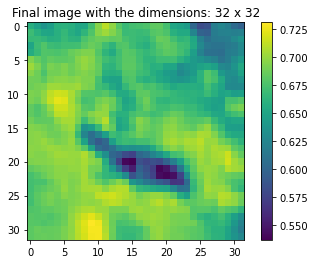

Applying filter kernel 13


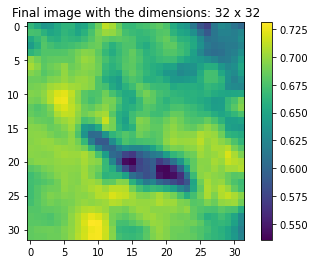

Applying filter kernel 14


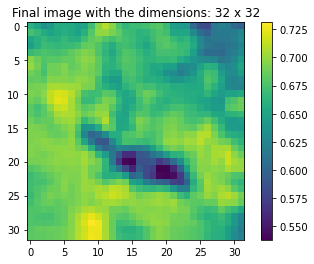

Applying filter kernel 15


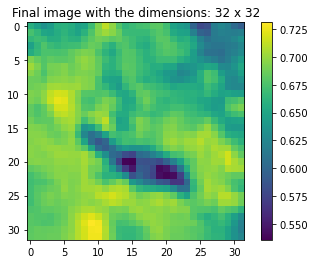

Applying filter kernel 16


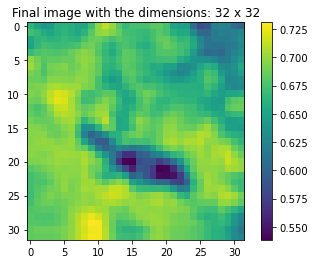

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


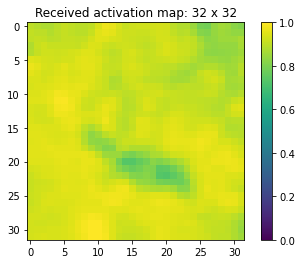

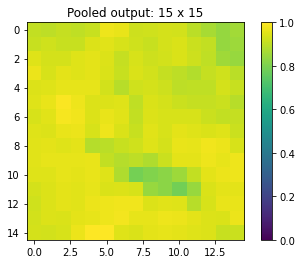

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


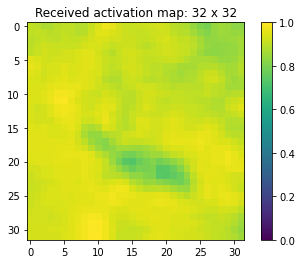

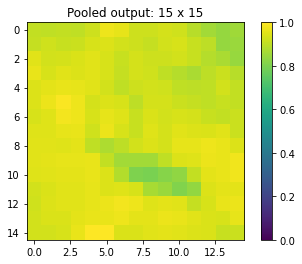

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


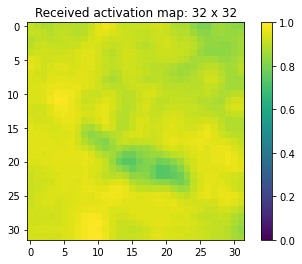

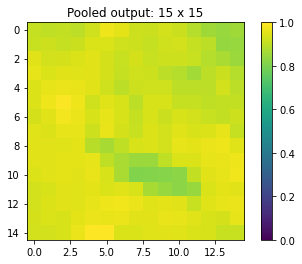

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


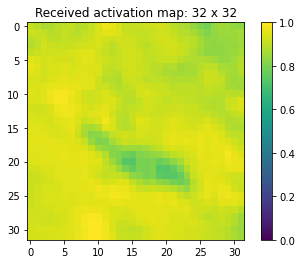

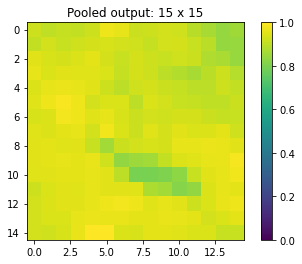

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


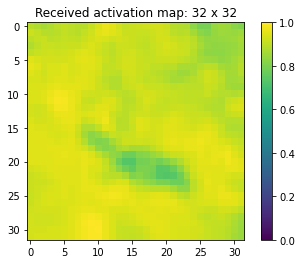

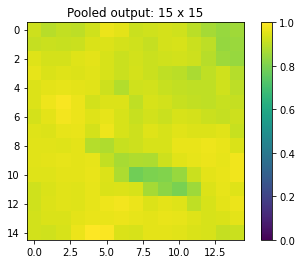

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


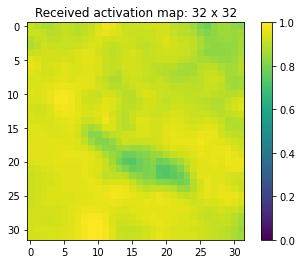

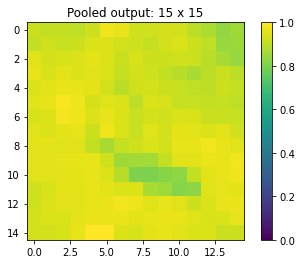

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


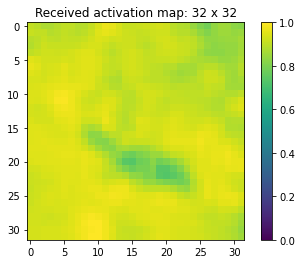

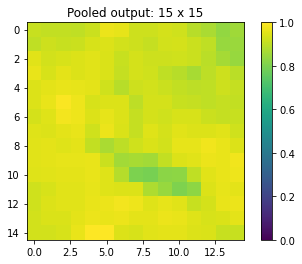

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


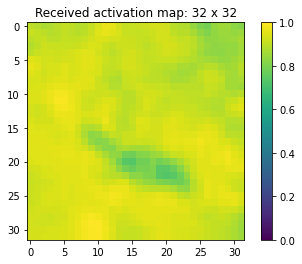

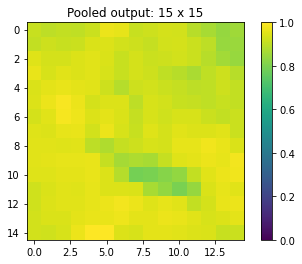

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


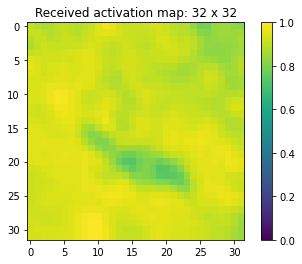

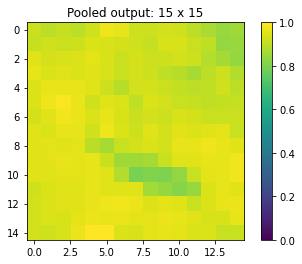

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


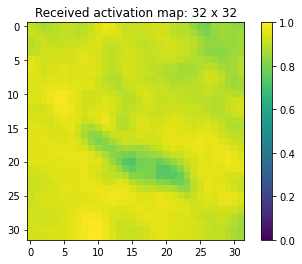

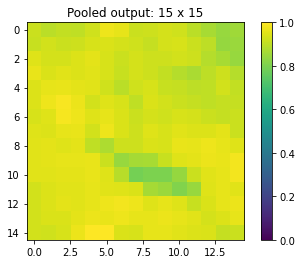

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


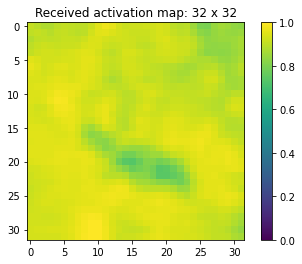

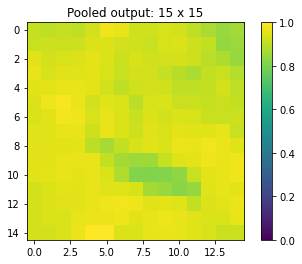

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


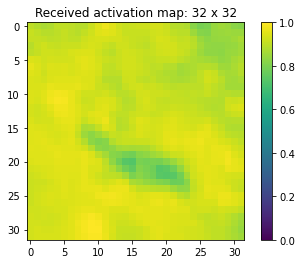

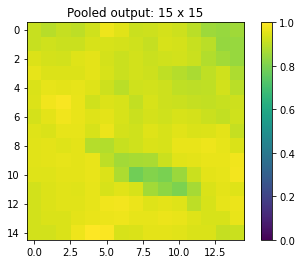

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


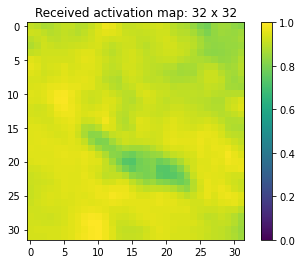

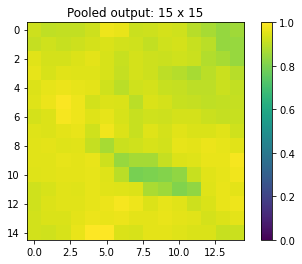

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


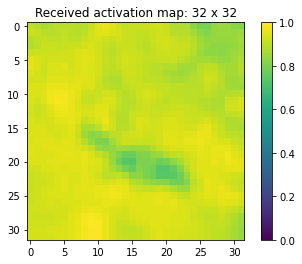

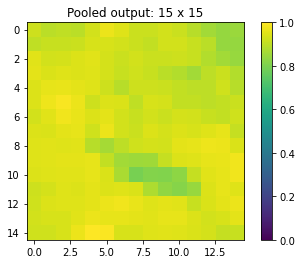

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


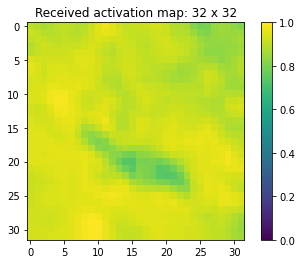

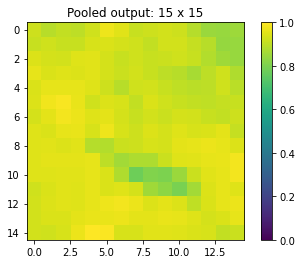

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


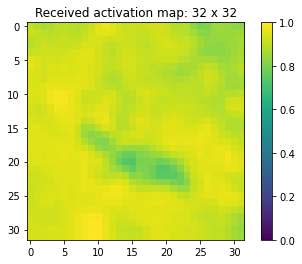

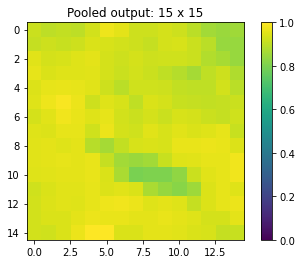

Applying filter kernel 1


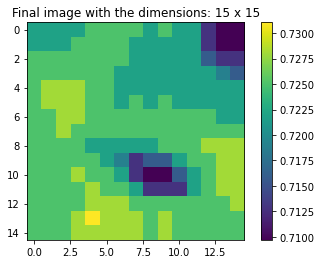

Applying filter kernel 2


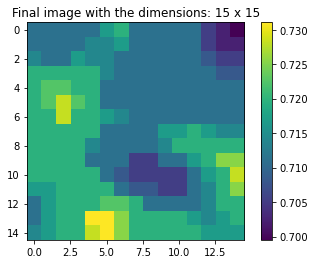

Applying filter kernel 3


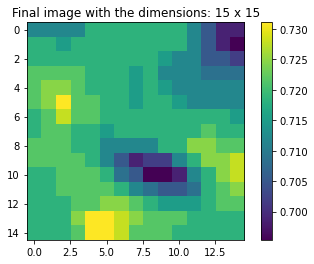

Applying filter kernel 4


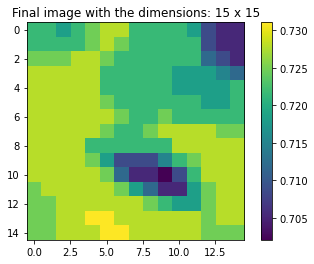

Applying filter kernel 5


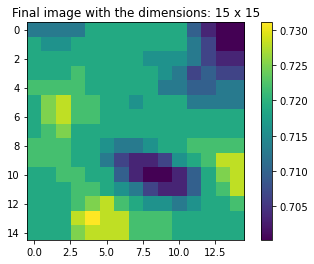

Applying filter kernel 6


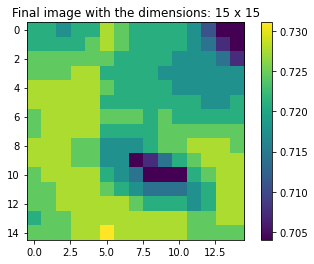

Applying filter kernel 7


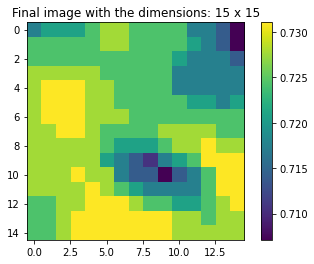

Applying filter kernel 8


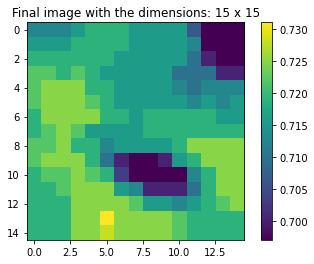

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


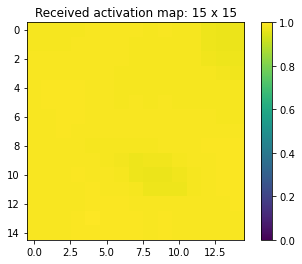

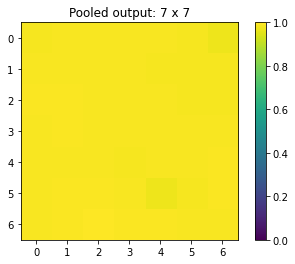

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


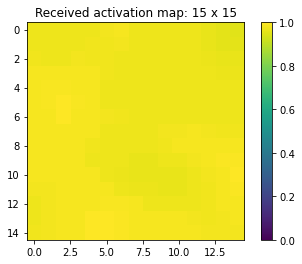

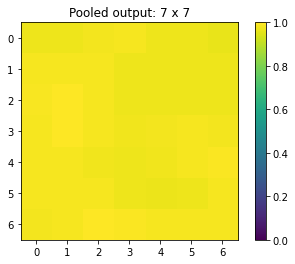

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


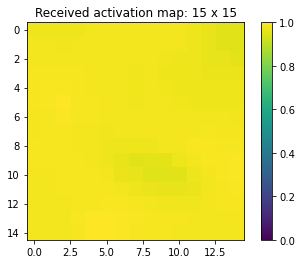

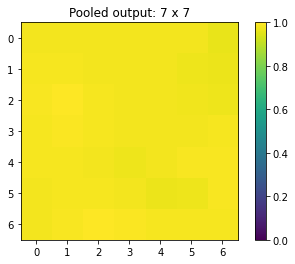

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


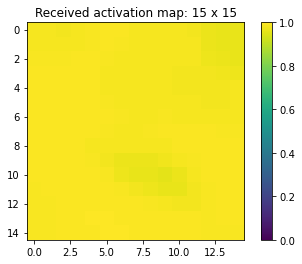

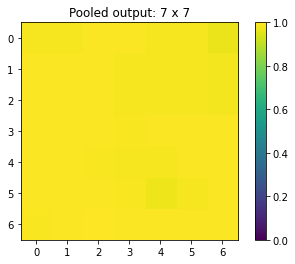

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


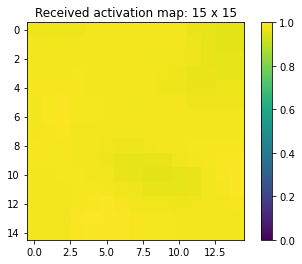

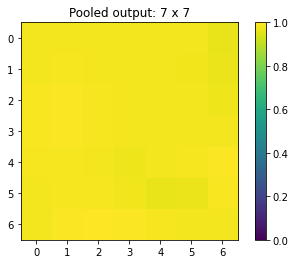

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


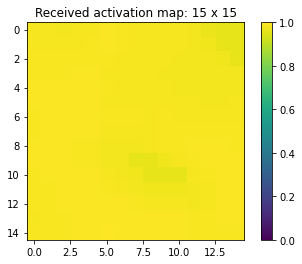

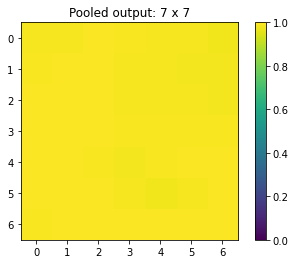

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


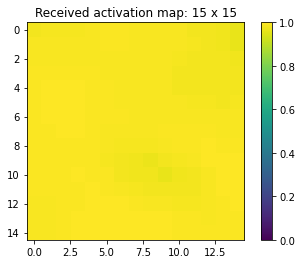

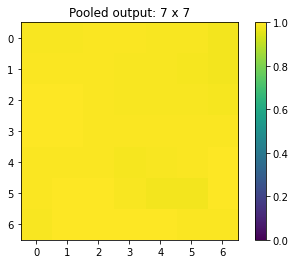

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


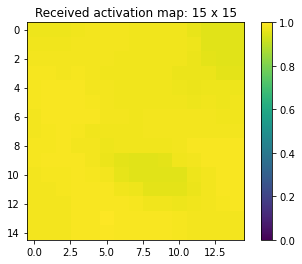

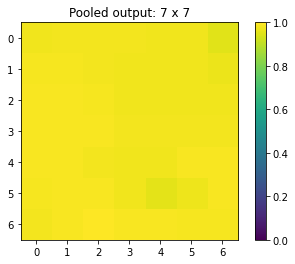

Applying filter kernel 1


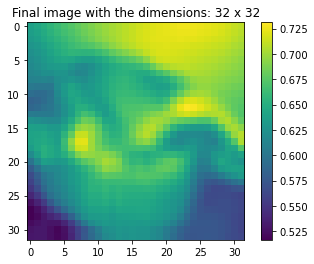

Applying filter kernel 2


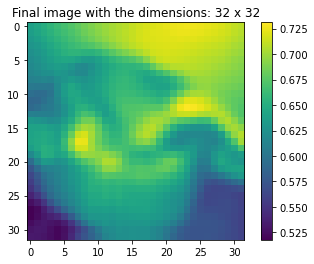

Applying filter kernel 3


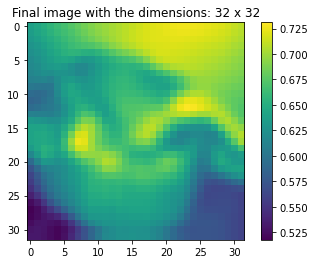

Applying filter kernel 4


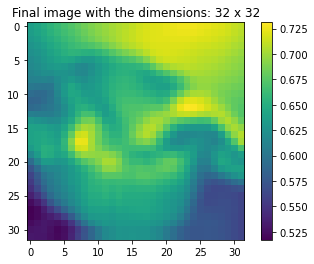

Applying filter kernel 5


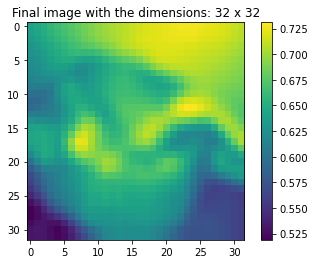

Applying filter kernel 6


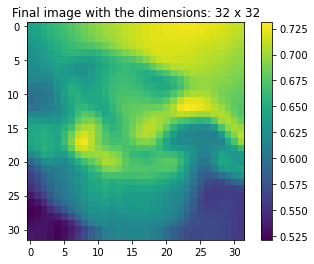

Applying filter kernel 7


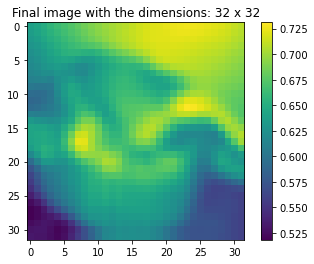

Applying filter kernel 8


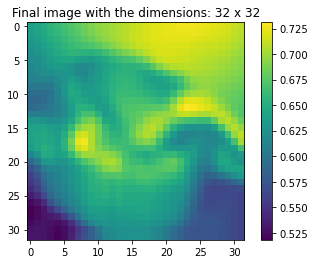

Applying filter kernel 9


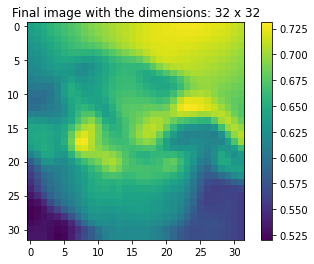

Applying filter kernel 10


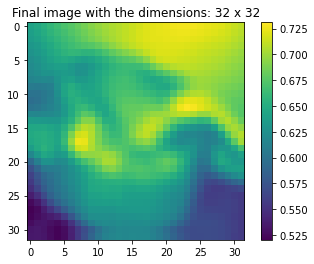

Applying filter kernel 11


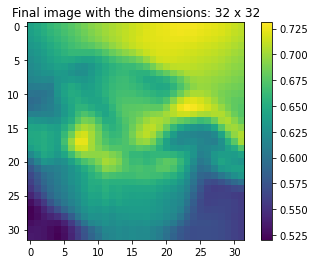

Applying filter kernel 12


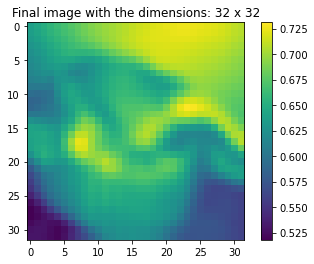

Applying filter kernel 13


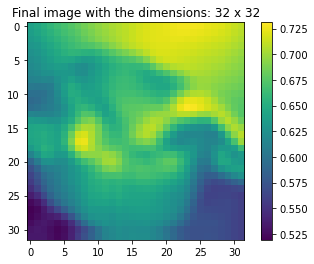

Applying filter kernel 14


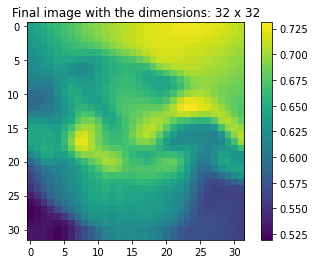

Applying filter kernel 15


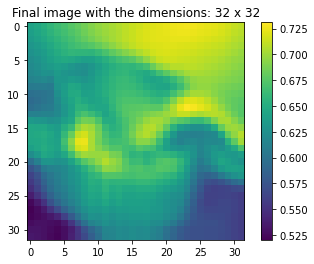

Applying filter kernel 16


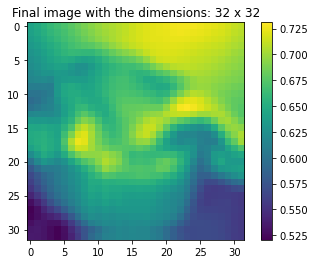

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


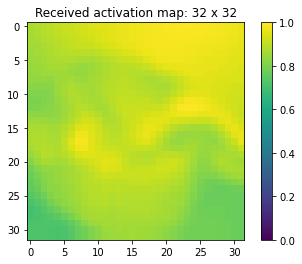

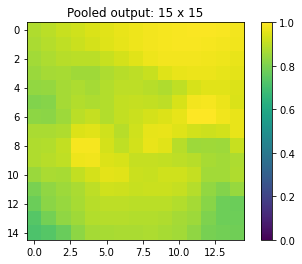

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


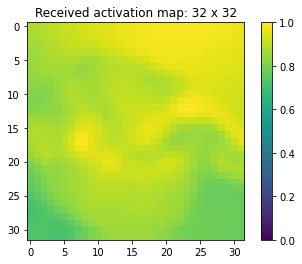

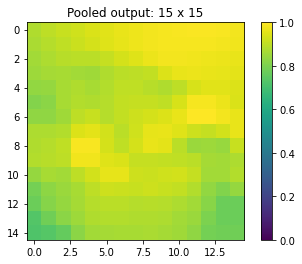

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


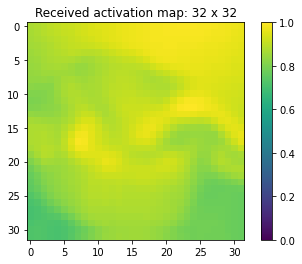

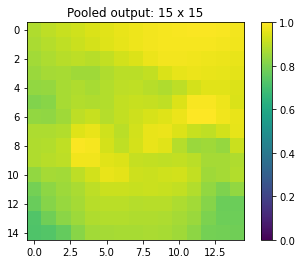

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


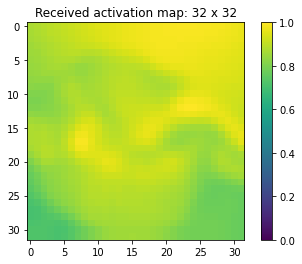

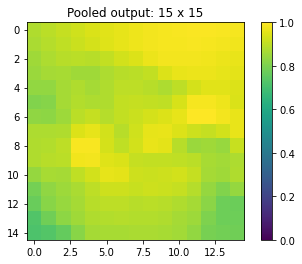

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


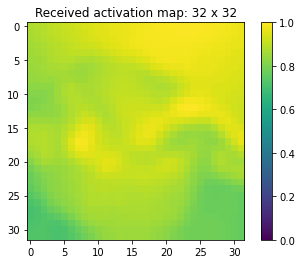

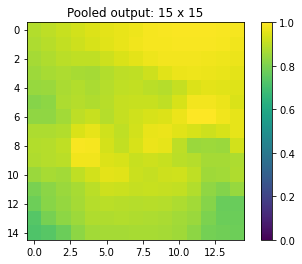

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


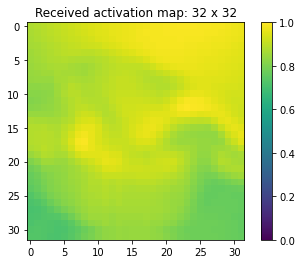

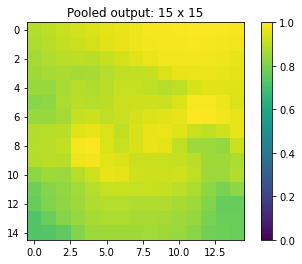

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


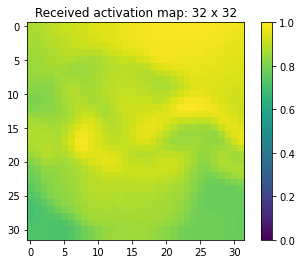

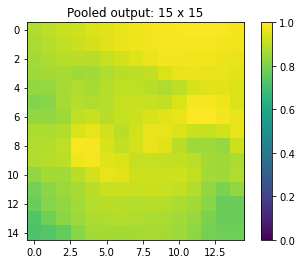

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


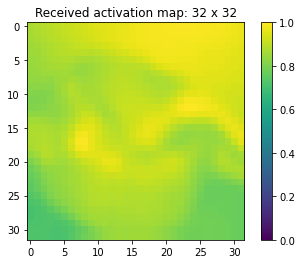

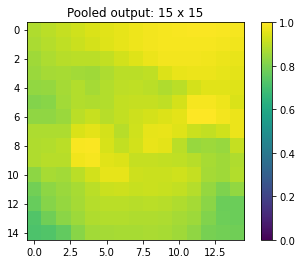

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


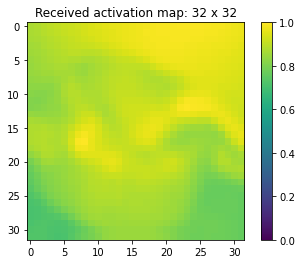

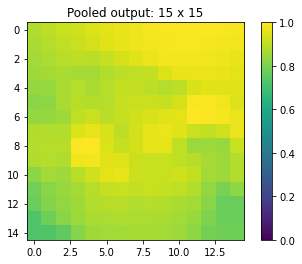

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


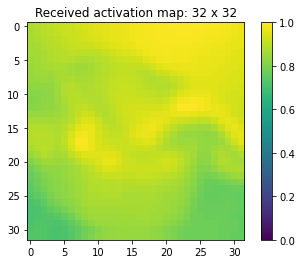

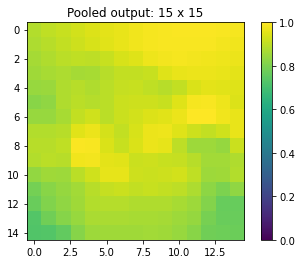

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


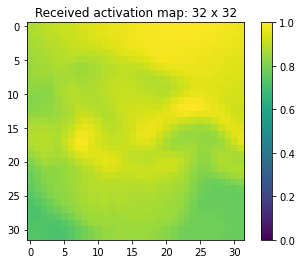

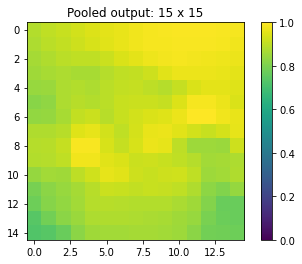

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


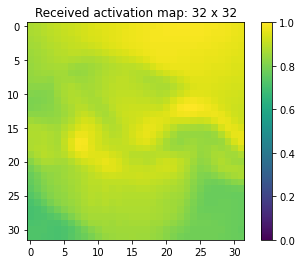

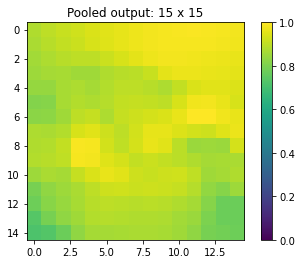

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


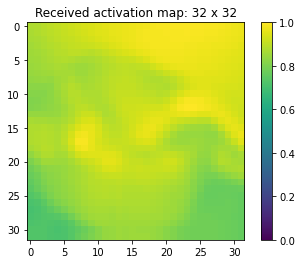

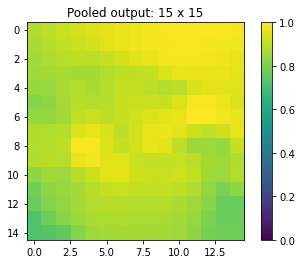

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


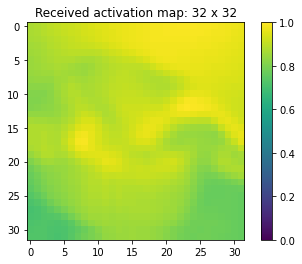

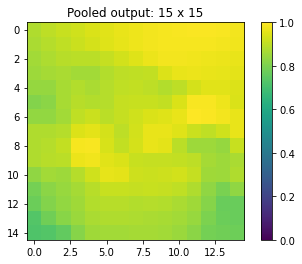

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


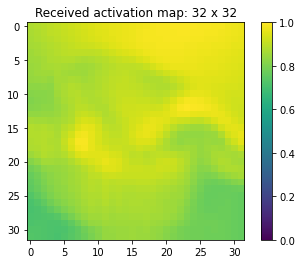

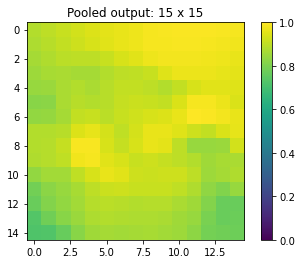

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


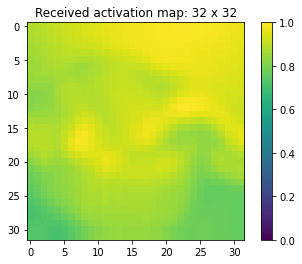

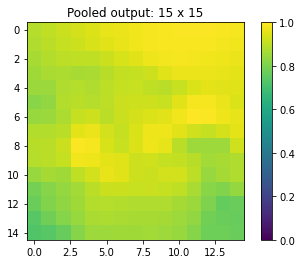

Applying filter kernel 1


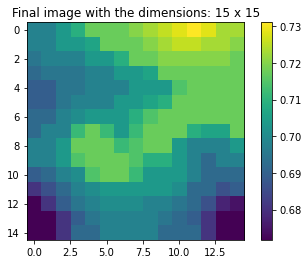

Applying filter kernel 2


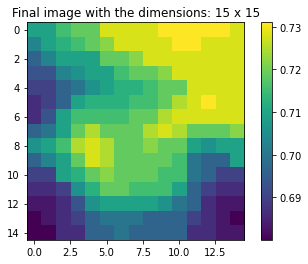

Applying filter kernel 3


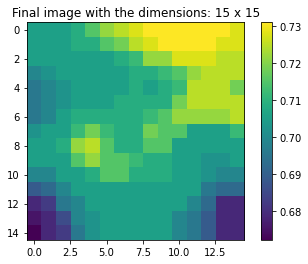

Applying filter kernel 4


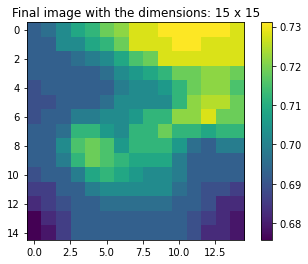

Applying filter kernel 5


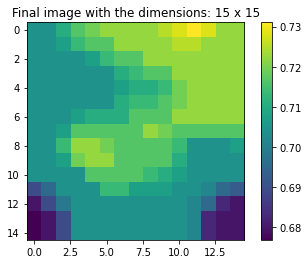

Applying filter kernel 6


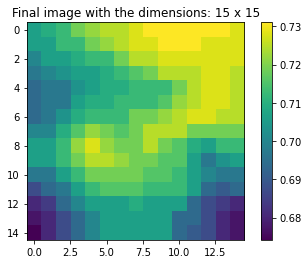

Applying filter kernel 7


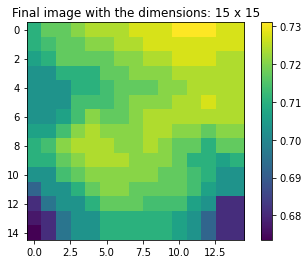

Applying filter kernel 8


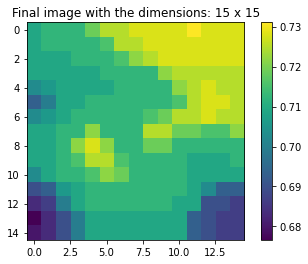

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


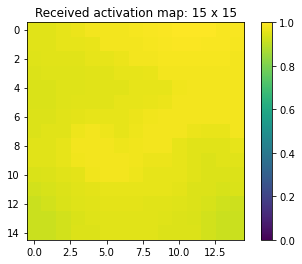

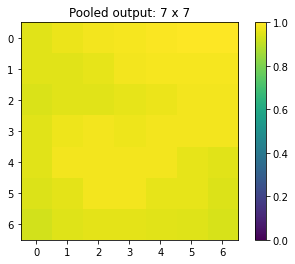

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


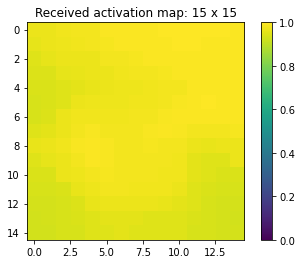

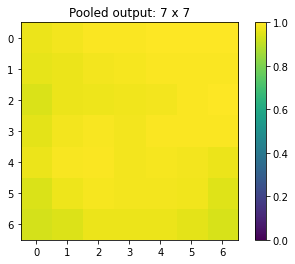

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


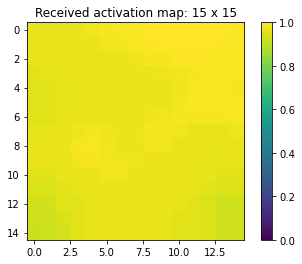

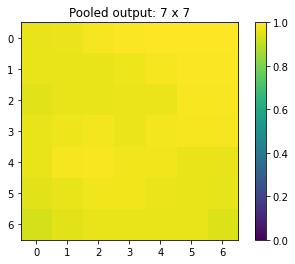

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


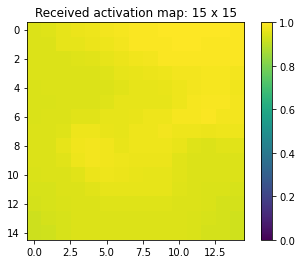

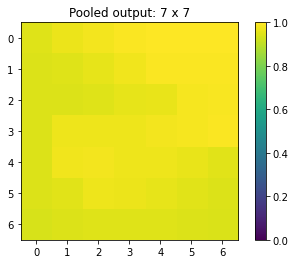

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


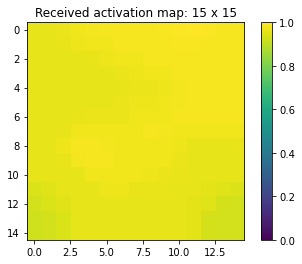

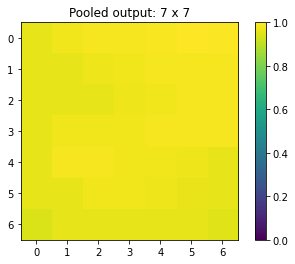

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


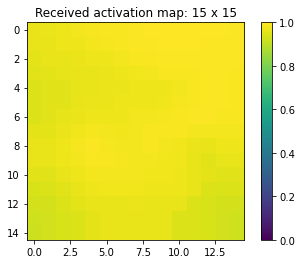

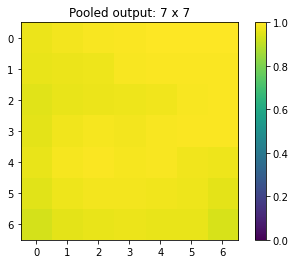

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


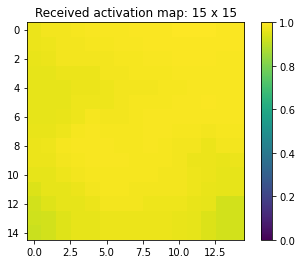

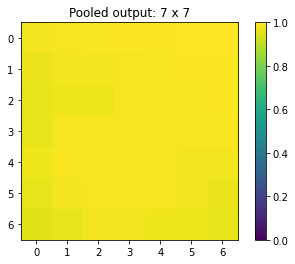

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


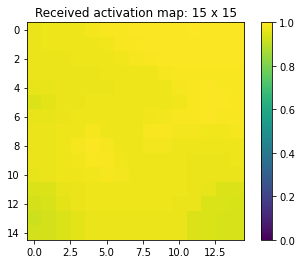

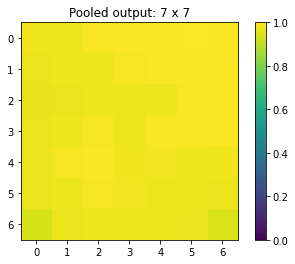

Applying filter kernel 1


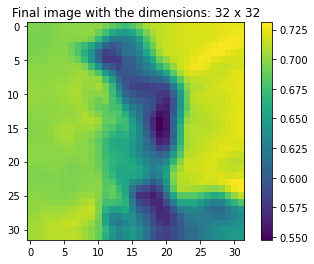

Applying filter kernel 2


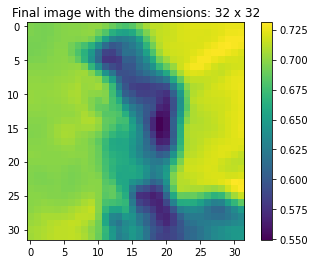

Applying filter kernel 3


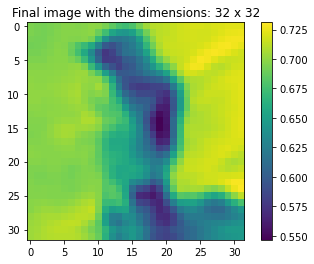

Applying filter kernel 4


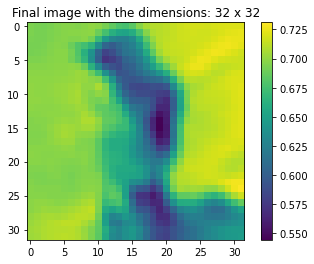

Applying filter kernel 5


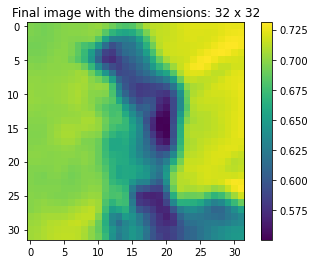

Applying filter kernel 6


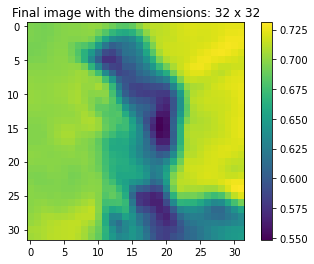

Applying filter kernel 7


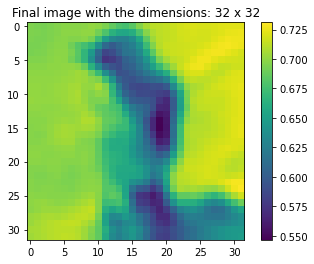

Applying filter kernel 8


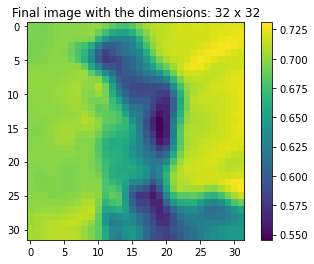

Applying filter kernel 9


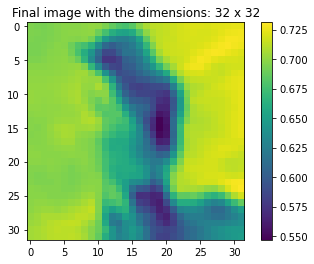

Applying filter kernel 10


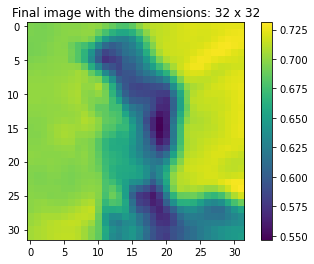

Applying filter kernel 11


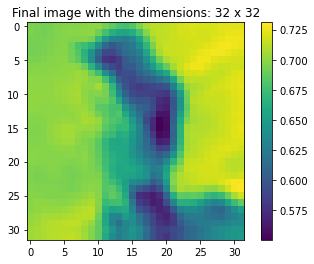

Applying filter kernel 12


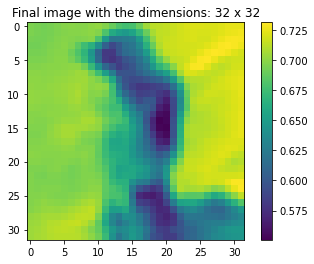

Applying filter kernel 13


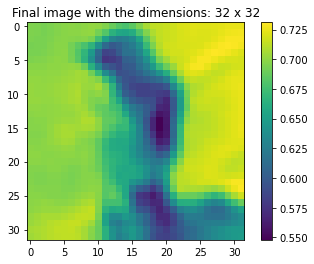

Applying filter kernel 14


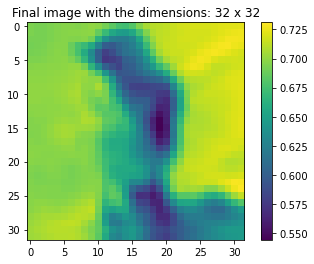

Applying filter kernel 15


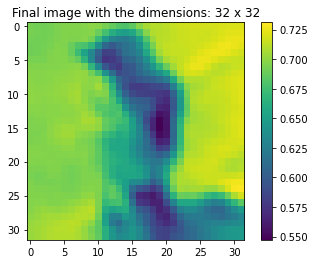

Applying filter kernel 16


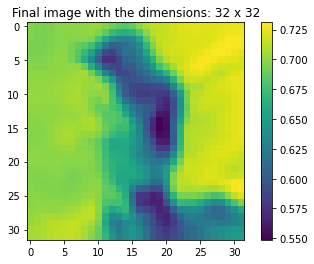

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


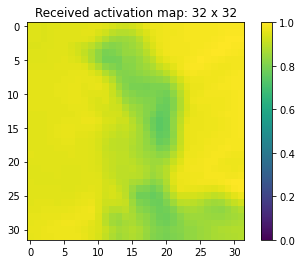

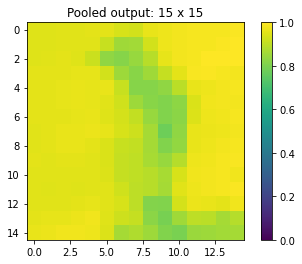

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


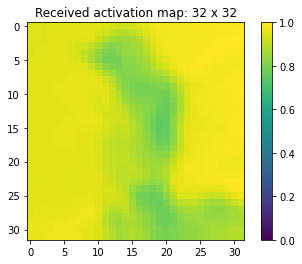

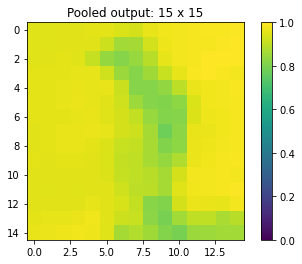

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


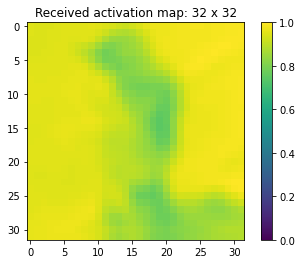

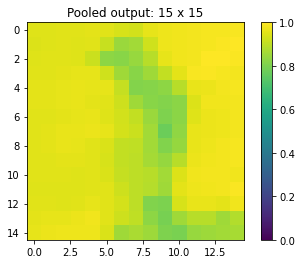

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


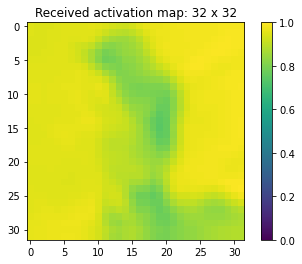

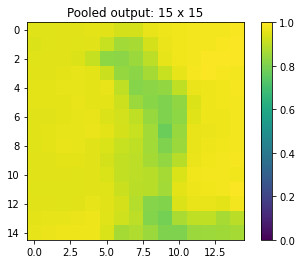

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


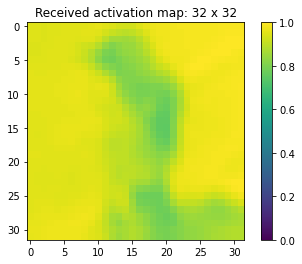

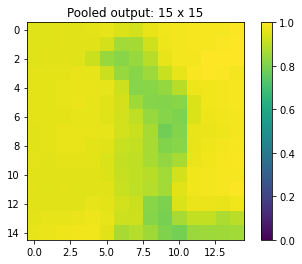

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


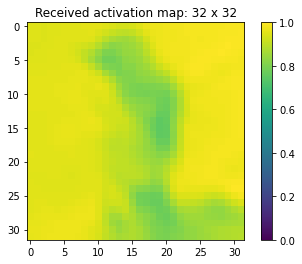

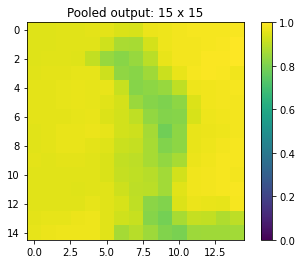

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


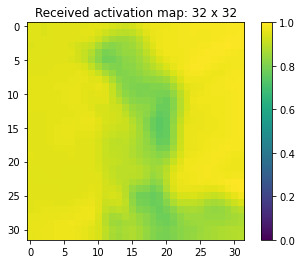

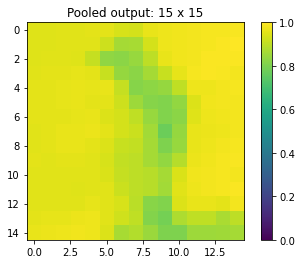

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


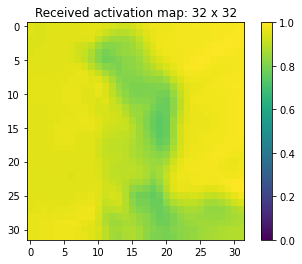

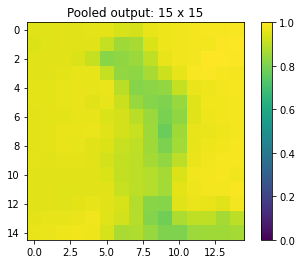

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


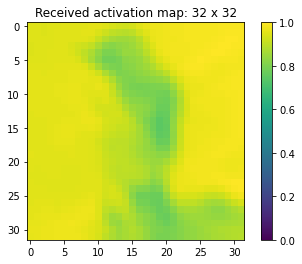

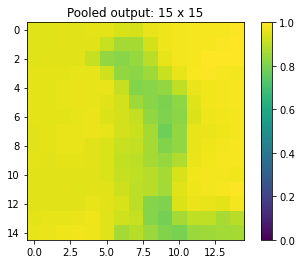

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


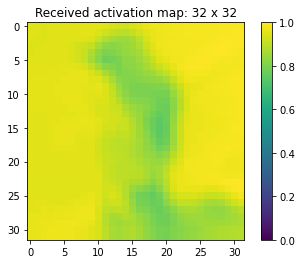

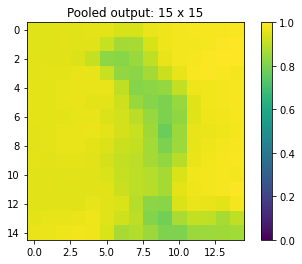

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


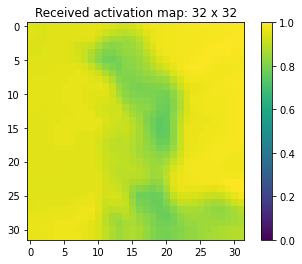

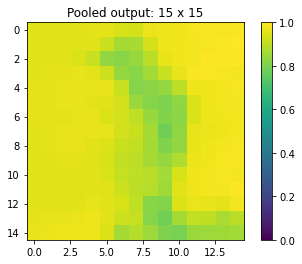

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


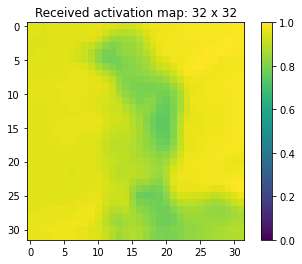

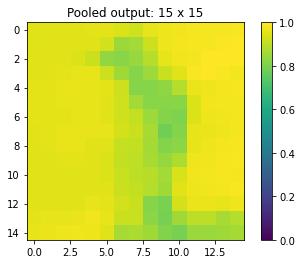

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


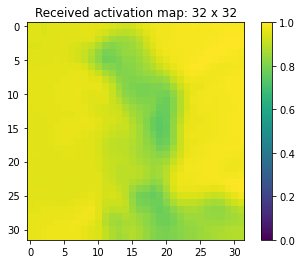

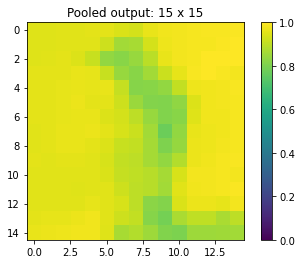

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


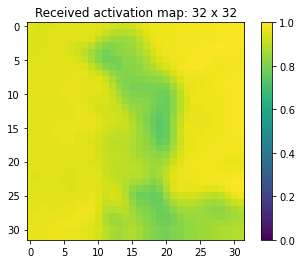

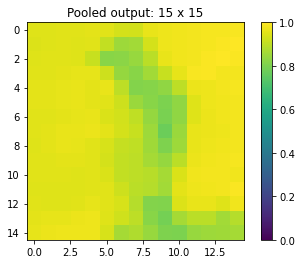

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


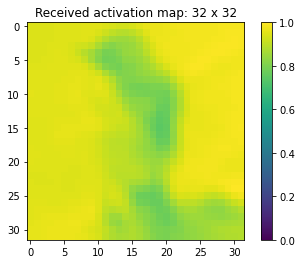

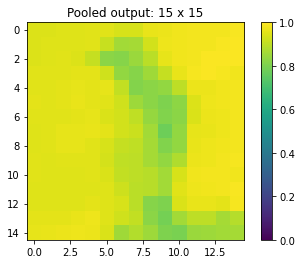

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


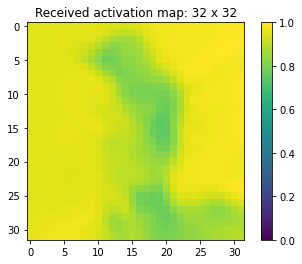

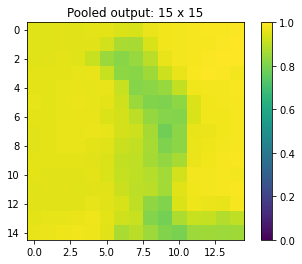

Applying filter kernel 1


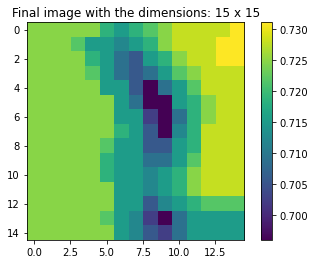

Applying filter kernel 2


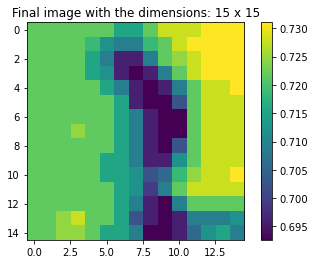

Applying filter kernel 3


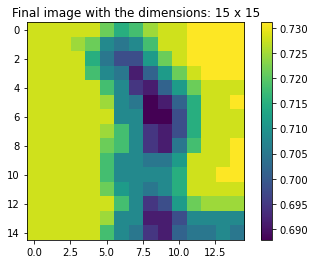

Applying filter kernel 4


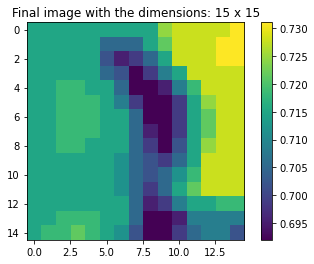

Applying filter kernel 5


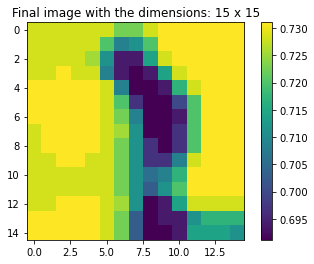

Applying filter kernel 6


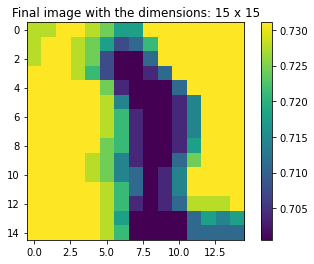

Applying filter kernel 7


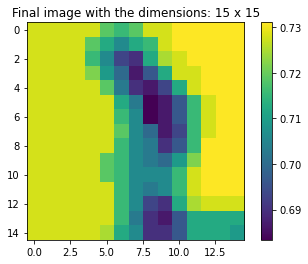

Applying filter kernel 8


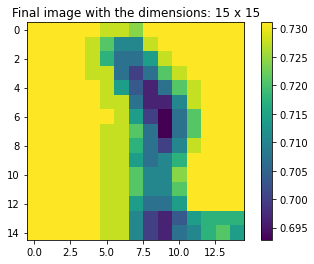

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


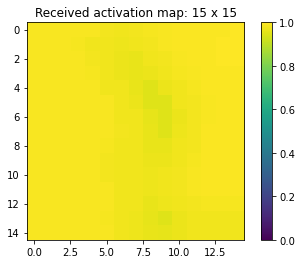

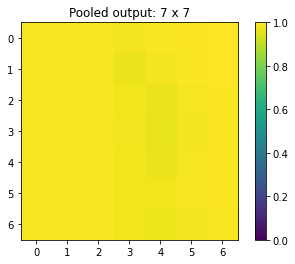

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


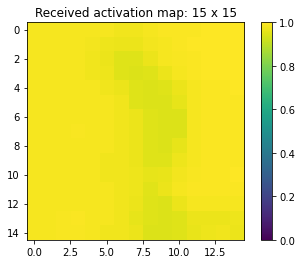

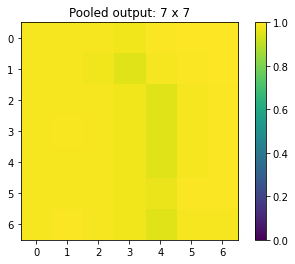

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


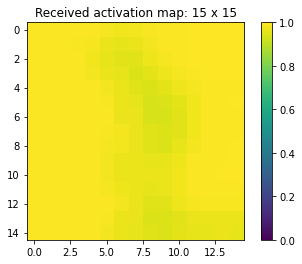

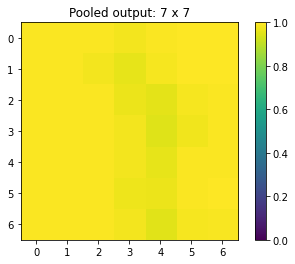

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


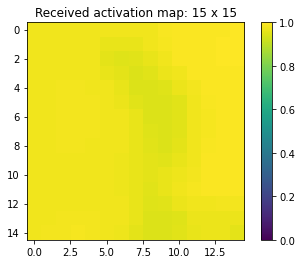

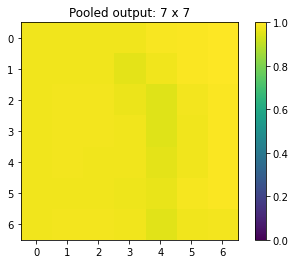

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


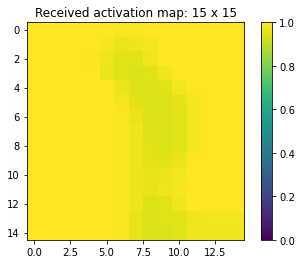

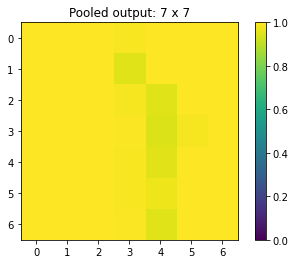

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


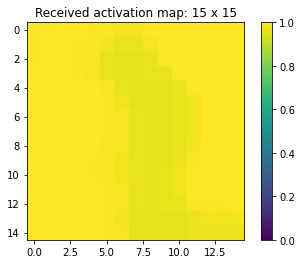

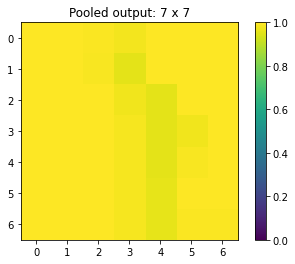

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


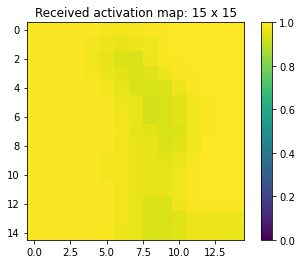

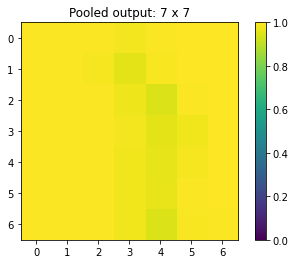

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


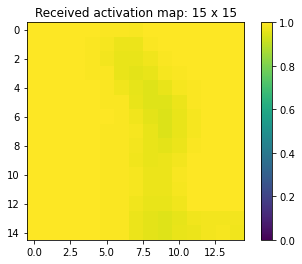

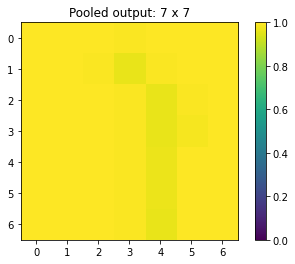

Applying filter kernel 1


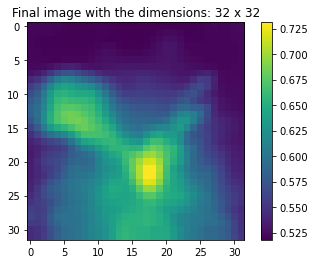

Applying filter kernel 2


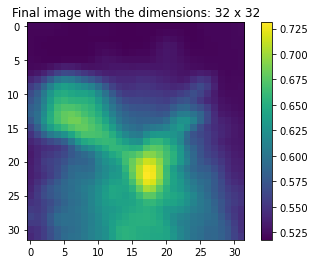

Applying filter kernel 3


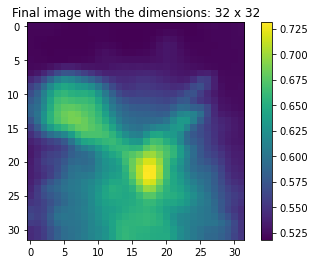

Applying filter kernel 4


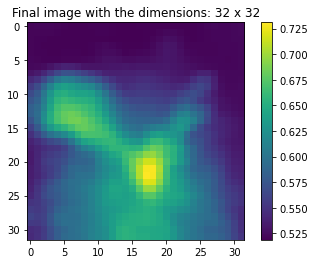

Applying filter kernel 5


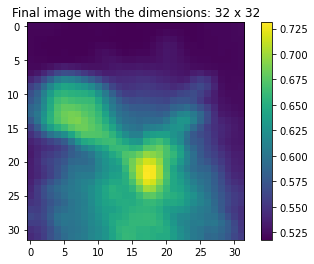

Applying filter kernel 6


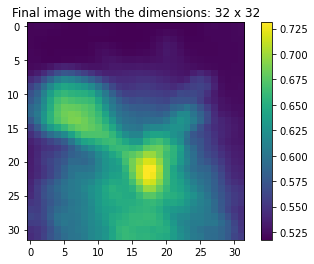

Applying filter kernel 7


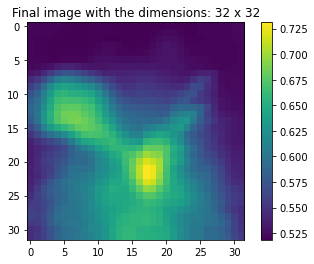

Applying filter kernel 8


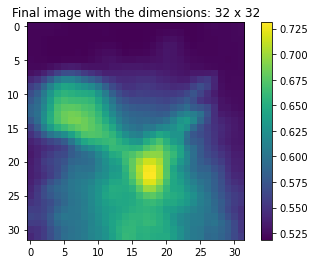

Applying filter kernel 9


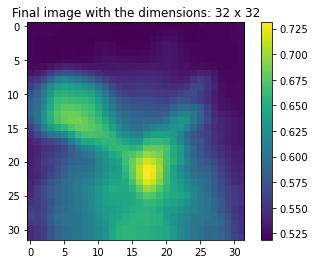

Applying filter kernel 10


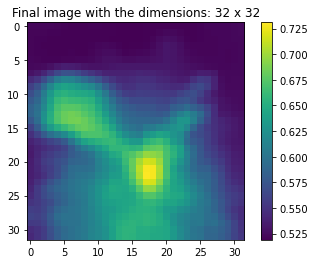

Applying filter kernel 11


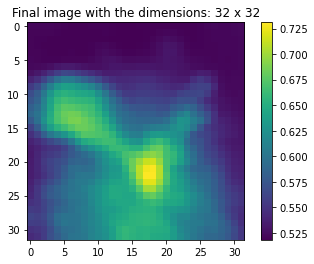

Applying filter kernel 12


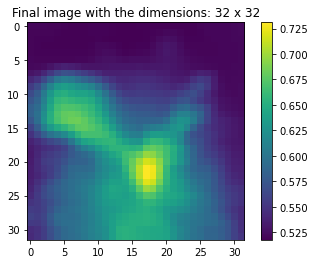

Applying filter kernel 13


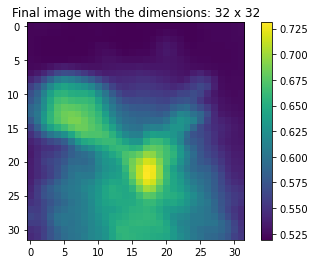

Applying filter kernel 14


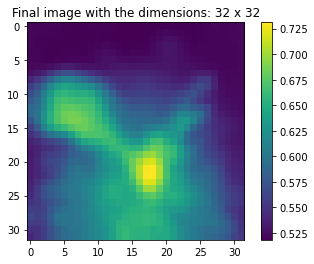

Applying filter kernel 15


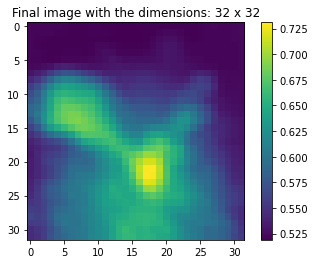

Applying filter kernel 16


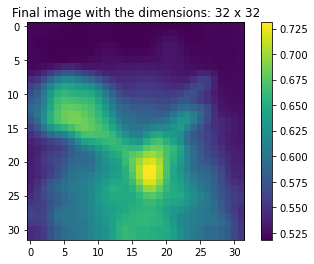

Confirming the dimensions of the output of this function: (32, 32, 16)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


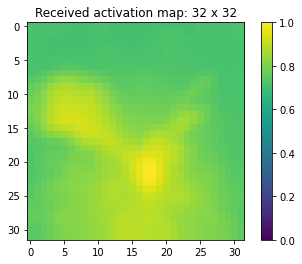

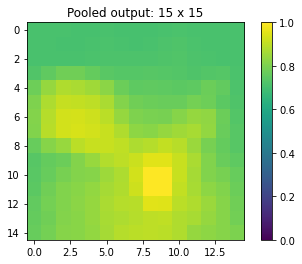

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


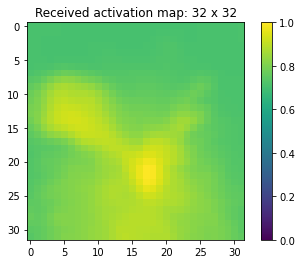

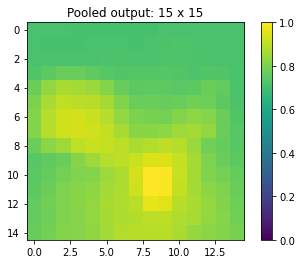

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


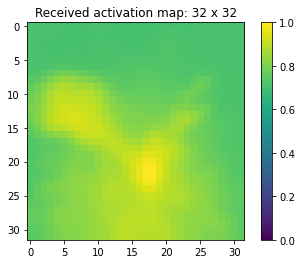

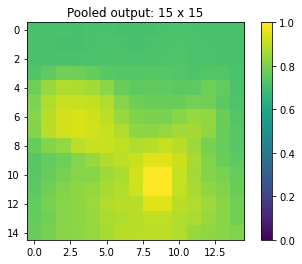

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


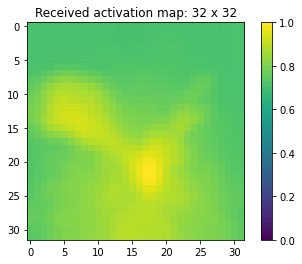

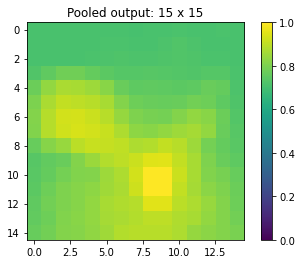

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


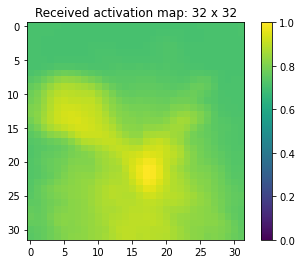

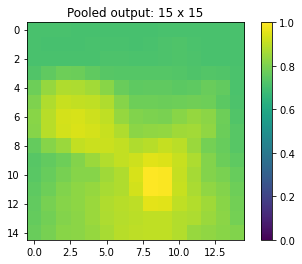

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


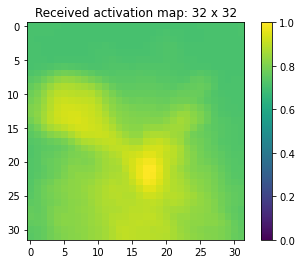

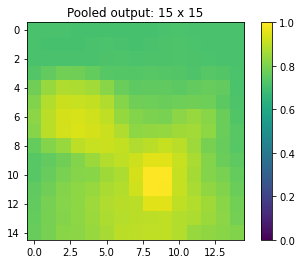

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


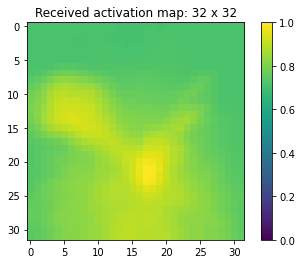

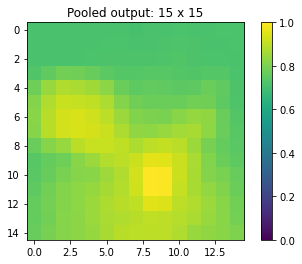

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


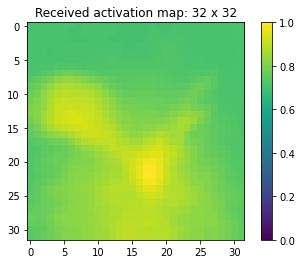

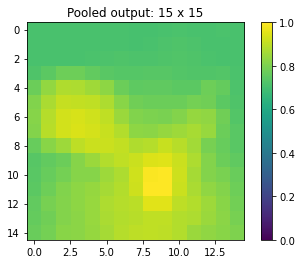

Pooling layer 9 of input activation map
Size of filter: 2 x 2
Stride: 2


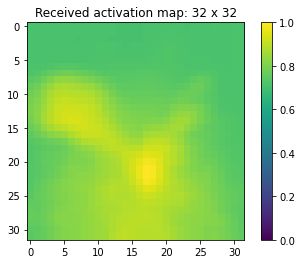

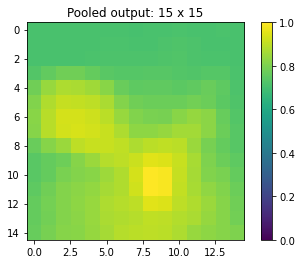

Pooling layer 10 of input activation map
Size of filter: 2 x 2
Stride: 2


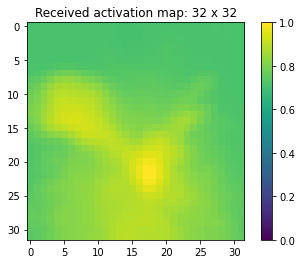

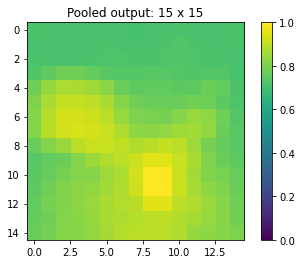

Pooling layer 11 of input activation map
Size of filter: 2 x 2
Stride: 2


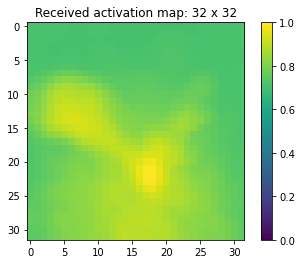

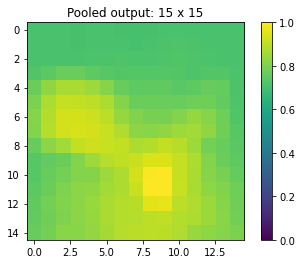

Pooling layer 12 of input activation map
Size of filter: 2 x 2
Stride: 2


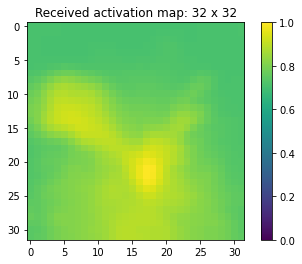

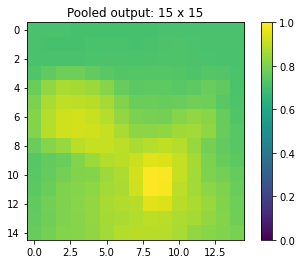

Pooling layer 13 of input activation map
Size of filter: 2 x 2
Stride: 2


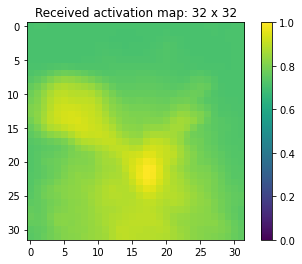

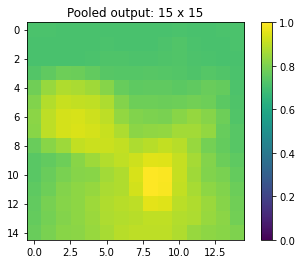

Pooling layer 14 of input activation map
Size of filter: 2 x 2
Stride: 2


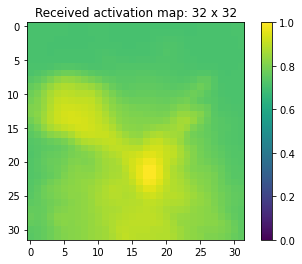

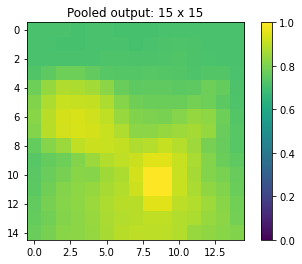

Pooling layer 15 of input activation map
Size of filter: 2 x 2
Stride: 2


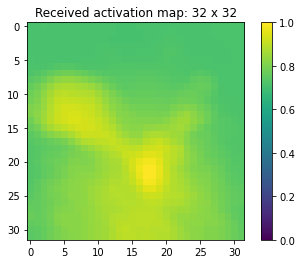

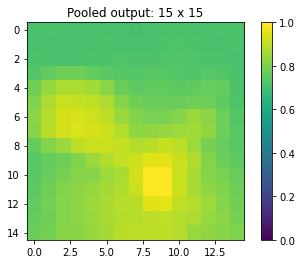

Pooling layer 16 of input activation map
Size of filter: 2 x 2
Stride: 2


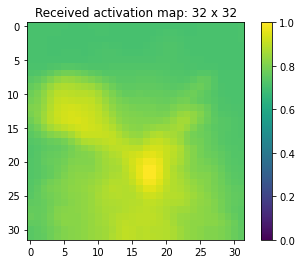

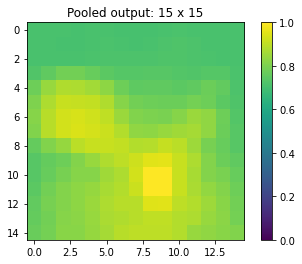

Applying filter kernel 1


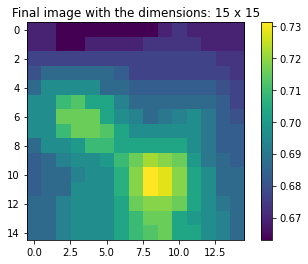

Applying filter kernel 2


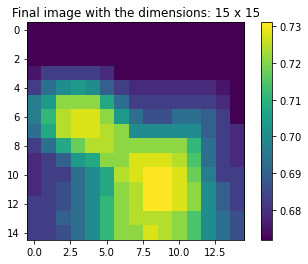

Applying filter kernel 3


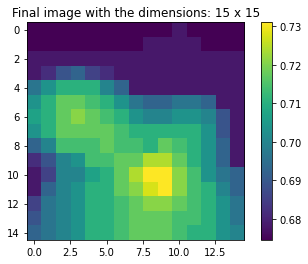

Applying filter kernel 4


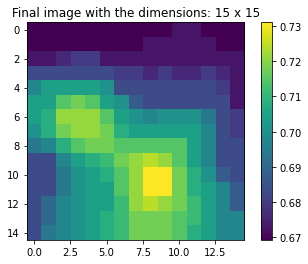

Applying filter kernel 5


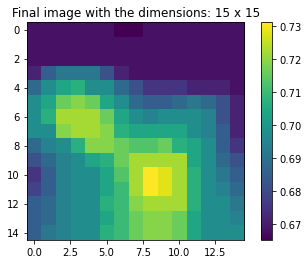

Applying filter kernel 6


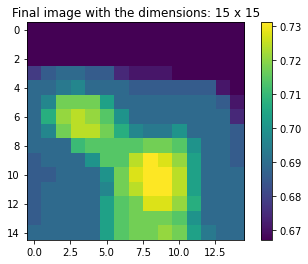

Applying filter kernel 7


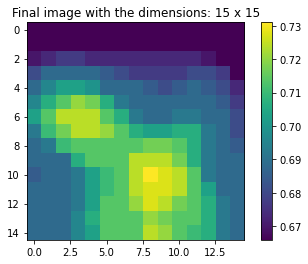

Applying filter kernel 8


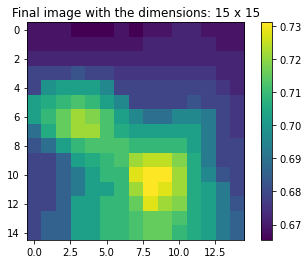

Confirming the dimensions of the output of this function: (15, 15, 8)
Pooling layer 1 of input activation map
Size of filter: 2 x 2
Stride: 2


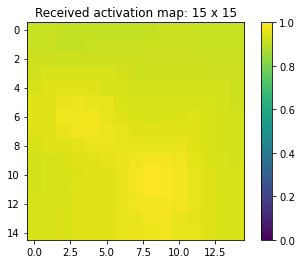

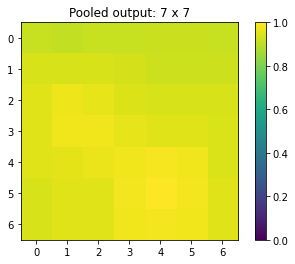

Pooling layer 2 of input activation map
Size of filter: 2 x 2
Stride: 2


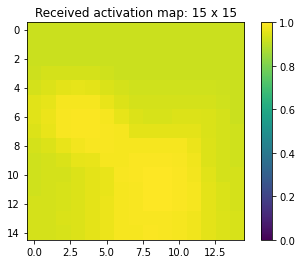

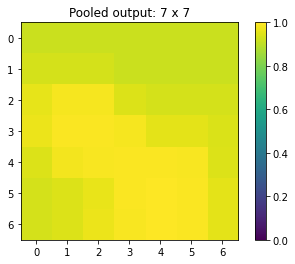

Pooling layer 3 of input activation map
Size of filter: 2 x 2
Stride: 2


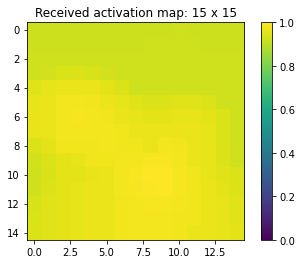

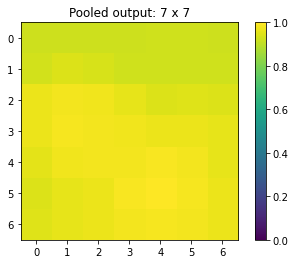

Pooling layer 4 of input activation map
Size of filter: 2 x 2
Stride: 2


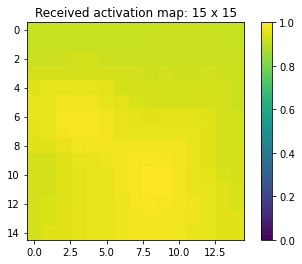

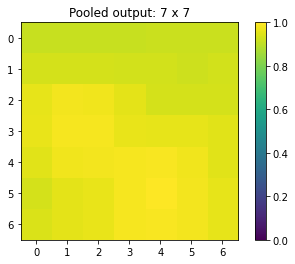

Pooling layer 5 of input activation map
Size of filter: 2 x 2
Stride: 2


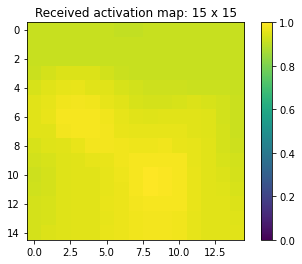

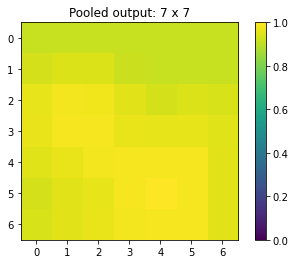

Pooling layer 6 of input activation map
Size of filter: 2 x 2
Stride: 2


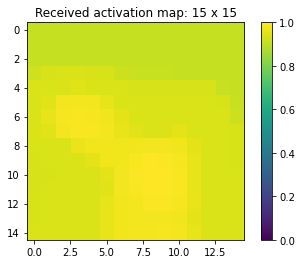

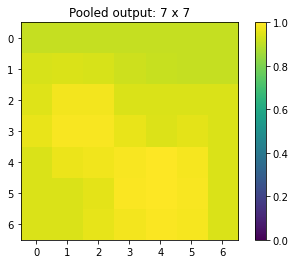

Pooling layer 7 of input activation map
Size of filter: 2 x 2
Stride: 2


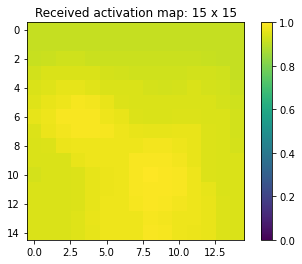

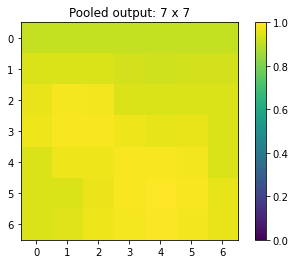

Pooling layer 8 of input activation map
Size of filter: 2 x 2
Stride: 2


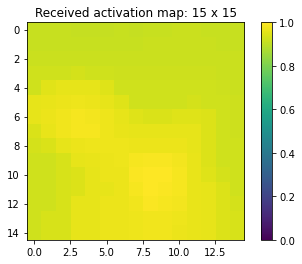

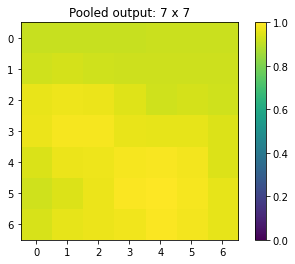

In [326]:
out_vecs = []
for trial_image in trial_images:
    out_vecs.append(feed_forward(trial_image))

In [327]:
print(out_vecs)

[array([[0.26748815, 0.07592608, 0.08419136, 0.08035322, 0.01604753,
        0.00870351, 0.09178653, 0.14073394, 0.14848878, 0.0862809 ]]), array([[0.01709854, 0.03147946, 0.04379316, 0.20079559, 0.07864868,
        0.09202554, 0.29679097, 0.06473401, 0.06042617, 0.11420788]]), array([[0.0783048 , 0.15515581, 0.07469968, 0.09897104, 0.04131425,
        0.19996524, 0.11033924, 0.0561056 , 0.0994454 , 0.08569895]]), array([[0.07704039, 0.02709905, 0.18566995, 0.06034097, 0.07498257,
        0.05583129, 0.22803177, 0.02497913, 0.20909172, 0.05693316]]), array([[0.06600258, 0.14008582, 0.03441146, 0.18097318, 0.08625129,
        0.09759701, 0.06990092, 0.11648036, 0.17883929, 0.02945809]]), array([[0.03551063, 0.04619314, 0.01265455, 0.0122674 , 0.08299569,
        0.01410434, 0.12699373, 0.25141385, 0.11350927, 0.3043574 ]]), array([[0.00895773, 0.4642888 , 0.02511716, 0.03925208, 0.01400237,
        0.0509492 , 0.03750686, 0.00499724, 0.34725439, 0.00767418]]), array([[0.02935001, 0.0370

In the output vectors, for different images, different components have a higher value. This indicates some classification is done.

In [342]:
out_arr = np.array(out_vecs)
out_arr = out_arr.reshape(len(out_arr[0, 0])*len(out_arr))
out_arr = out_arr.reshape((10, 10))
out_arr

array([[0.26748815, 0.07592608, 0.08419136, 0.08035322, 0.01604753,
        0.00870351, 0.09178653, 0.14073394, 0.14848878, 0.0862809 ],
       [0.01709854, 0.03147946, 0.04379316, 0.20079559, 0.07864868,
        0.09202554, 0.29679097, 0.06473401, 0.06042617, 0.11420788],
       [0.0783048 , 0.15515581, 0.07469968, 0.09897104, 0.04131425,
        0.19996524, 0.11033924, 0.0561056 , 0.0994454 , 0.08569895],
       [0.07704039, 0.02709905, 0.18566995, 0.06034097, 0.07498257,
        0.05583129, 0.22803177, 0.02497913, 0.20909172, 0.05693316],
       [0.06600258, 0.14008582, 0.03441146, 0.18097318, 0.08625129,
        0.09759701, 0.06990092, 0.11648036, 0.17883929, 0.02945809],
       [0.03551063, 0.04619314, 0.01265455, 0.0122674 , 0.08299569,
        0.01410434, 0.12699373, 0.25141385, 0.11350927, 0.3043574 ],
       [0.00895773, 0.4642888 , 0.02511716, 0.03925208, 0.01400237,
        0.0509492 , 0.03750686, 0.00499724, 0.34725439, 0.00767418],
       [0.02935001, 0.0370914 , 0.1515456

In [328]:
# implementing t-SNE from sklearn
from sklearn.manifold import TSNE

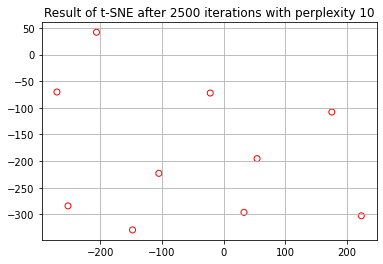

In [349]:
reduced = TSNE(n_components = 2 , n_iter = 3000, perplexity=5).fit_transform(out_arr)
plt.scatter(reduced[:,0], reduced[:,1], marker='o', ec='r', fc='None')
plt.grid(True)
plt.title('Result of t-SNE after 2500 iterations with perplexity 10')
plt.show()